### Imports


In [10]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

comp='bf1'
import sys  # update paths
sys.path.append('../../')

import os 
import numpy as np 
import matplotlib.pyplot as plt
import copy
import meas_analysis.handy as hy
import scresonators.fit_resonator.ana_resonator_vic as ana_res
import scresonators.fit_resonator.ana_resonator as ana_res_shannon
import scresonators.fit_resonator.ana_tls_vic as ana_tls
import seaborn as sns
import scipy.constants as cs
from scipy.optimize import curve_fit

colors = ['#4053d3', '#b51d14', '#ddb310','#658b38','#7e1e9c', '#75bbfd', '#cacaca']
sns.set_palette(colors)

if comp=='shannon':
    pth_base ='/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/'
elif comp=='bf1':
    pth_base='G:/'

folder = 'My Drive/Projects/Materials/'
pth = pth_base+folder
img_pth = pth+'Outputs/Resonators/'

#sample_dict = {'no hf':['240725'], 'hf':['240719', '240729', '240729-2', '240729-3', '240729-6'], 'hf-soc0':['240729-5','240729-6'], 'hf-soc0':[], 'scalinq':['240814-2'], 'silicon-scalinq':['silicon-scalinq-1']}

sample_dict = {'no hf':{'meas':['240725']}, 'hf':['240719', '240729', '240729-2', '240729-3', '240729-6'], 'hf-soc0':['240729-5','240729-6'], 'hf-soc0':[], 'scalinq':['240814-2'], 'silicon-scalinq':['silicon-scalinq-1'], 'silicon-mux':['silicon-mux']}


# samples: no hf, hf, scalinq (0729-2 is hf3)
# meas: 240725, 240719, 240729, 240729-2, 240814-2

#meas = 'silicon-scalinq-1'
meas = 'silicon-mux'

matching_keys = [key for key, items in sample_dict.items() for item in items if item == meas]
sample = matching_keys[0] if matching_keys else None

#sample = 

#sample ='silicon-scalinq'
#meas = sample + '-1'



The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:

if sample=='no hf':
    flip = False
    pth = '240725/'
    params = {'atten': -40, 'min_power': -100, 'max_power': -15}
elif sample=='hf':
    flip = True
    pth = '240729/'
    params = {'atten':-50, 'min_power': -100, 'max_power': -25}
elif sample=='hf-soc':
    flip=True
    pth = '240818-Resonator/'
    params = {'atten':-50, 'min_power': -100, 'max_power': 25}
elif sample=='hf-soc0':
    flip=True
    pth = '240816-Resonator/'
    params = {'atten':-50, 'min_power': -100, 'max_power': 25}
elif sample=='scalinq':
    flip = False
    pth = '240814-Resonator/'
    params = {'atten':-65, 'min_power': -100, 'max_power': -15}    
elif sample=='silicon-scalinq':
    flip = True
    pth = '240908-Resonator/'
    params = {'atten':-65, 'min_power': -100, 'max_power': -15}
elif sample=='silicon-mux':
    flip = True
    pth = '240912-Resonator_mux/'
    params = {'atten':-65, 'min_power': -100, 'max_power': -15}
else:
    print('Sample not found')

data_pth = pth_base+folder+'Data/'+pth
params['temp'] = 0.04
params['res_name']=meas
params['sample']=sample
if flip: 
    params['pitch'] = [10, 12, 14, 2, 16, 4, 6, 8]
    params['target_freq'] =[5.9, 6.2, 6.5, 7, 6.7, 7.2, 7.5, 7.9]
else: 
    params['pitch'] = [10, 12, 14, 16, 2, 4, 6, 8]
    params['target_freq'] =[5.9, 6.2, 6.5, 6.7, 7, 7.2, 7.5, 7.9]

## Sweep power/temp, plot results

### Run sweep 

In [12]:
import time
def analyze_sweep_mux(directories, pth_base, img_pth, name='res', plot=None, min_power=-100, slope=0):
    pattern0 = r'res_(\d+)'

    # Initialize dict by getting list of resonators, creating dict with len = n resonators
    resonators, file_list = ana_res.get_resonators(directories[0],pth_base, pattern0)
    res_params = [None] * len(resonators)
    for i in range(len(resonators)):
        res_params[i] = {'freqs':[], 'phs':[], 'q':[], 'qi':[], 'qc':[], 'qi_phi':[], 'pow':[], 'qi_err':[], 'q_err':[], 'phs_err':[], 'qc_err':[], 'qc_real_err':[], 'f_err':[]}
    
    # Each directory is a temperature 
    for i in range(len(directories)): 
        start = time.time()
        print(i)
        output_path = img_pth+'/Images/'+name+'_' + directories[i] + '/'
        resonators, file_list0 = ana_res.get_resonators(directories[i], pth_base, pattern0)
        pth = pth_base + directories[i]
        for j in range(len(resonators)): 
            # Grab all the files for a given resonator, then sort by power. 
            pattern = 'res_{:d}_'.format(resonators[j]) + '(\d+)'
            file_list = ana_res.get_resonator_power_list(pattern, file_list0)
            
            params, err, power = [], [], []
            for k in range(len(file_list)):
                data, attrs = ana_res.grab_data(pth, file_list[k],  meas_type='soc', slope=slope)

                power.append(file_list[k][9:])
                
                try:                                            
                    output = ana_res.fit_resonator(data, file_list[k], output_path, plot=plot)
                    params.append(output[0])
                    err.append(output[1])
                except Exception as error:
                    print("An exception occurred:", error) 
                    params.append(np.nan*np.ones(4))
                    err.append(np.nan*np.ones(6))
            res_params = ana_res.stow_data(params, res_params, j, power, err)
            
            print('Time elapsed: ', time.time()-start)            

    for i in range(len(resonators)):
        for key in res_params[i].keys():
            res_params[i][key] = np.array(res_params[i][key])

    return res_params

Counter({5521: 12, 5824: 12, 6094: 12, 6371: 12, 6379: 12, 6704: 12, 7064: 12, 7390: 12})
0
Counter({5521: 12, 5824: 12, 6094: 12, 6371: 12, 6379: 12, 6704: 12, 7064: 12, 7390: 12})
['res_5521_33', 'res_5521_30', 'res_5521_27', 'res_5521_24', 'res_5521_21', 'res_5521_18', 'res_5521_15', 'res_5521_12', 'res_5521_9', 'res_5521_6', 'res_5521_3', 'res_5521_0']
28.45


c:\Users\circu\anaconda3\envs\slab\Lib\site-packages\lmfit\confidence.py:356: UserWarning: Bound reached with prob(phi=3.141592653589793) = 0.45011859285053185 < max(sigmas)
  warn(errmsg)


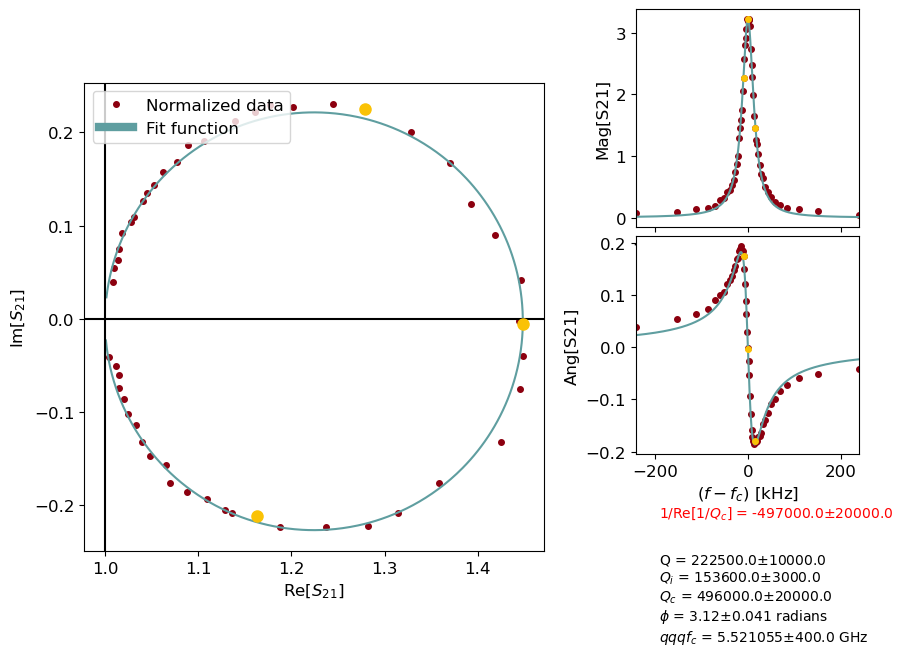

28.45


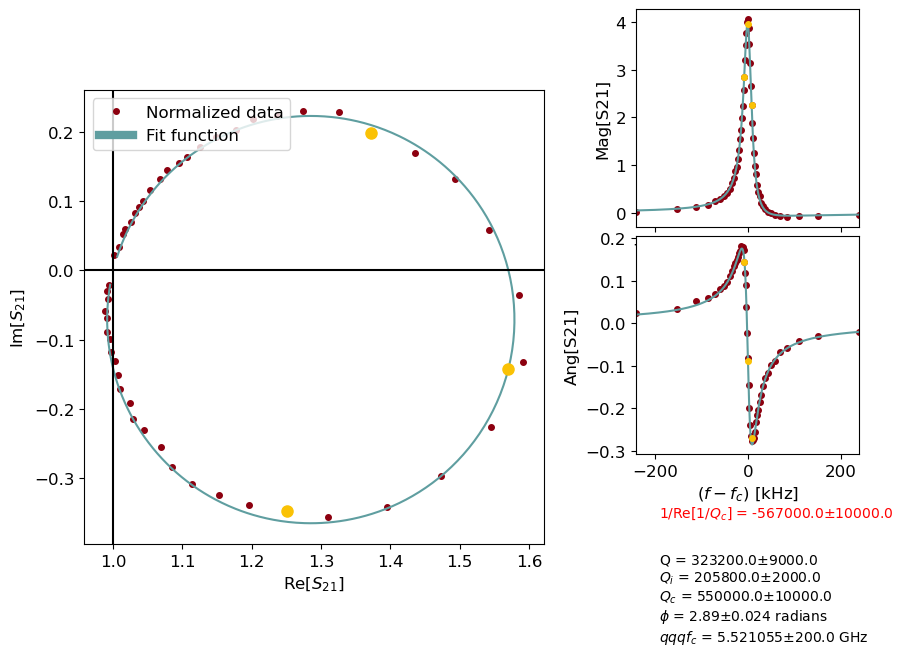

28.45


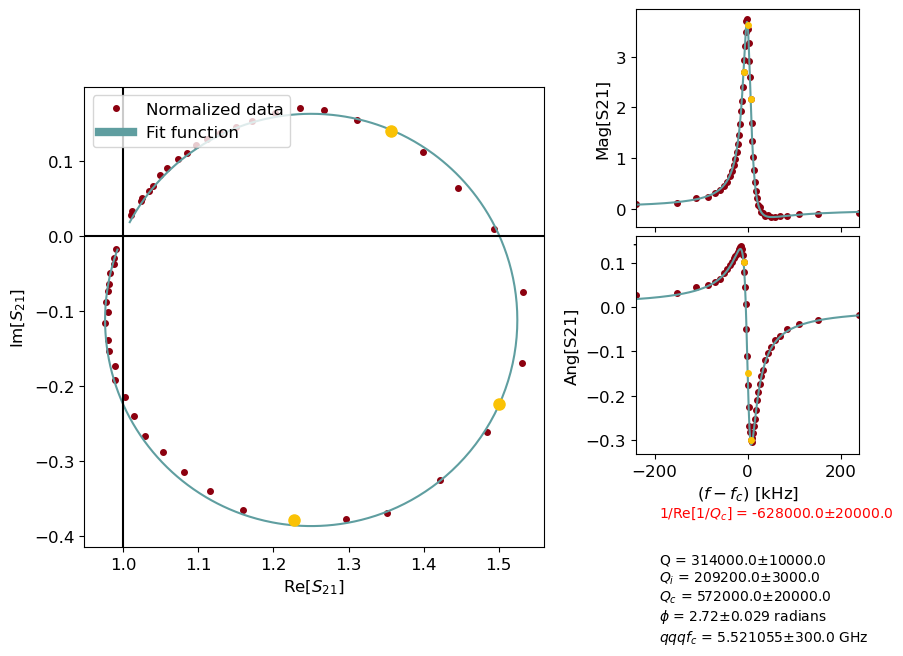

28.45


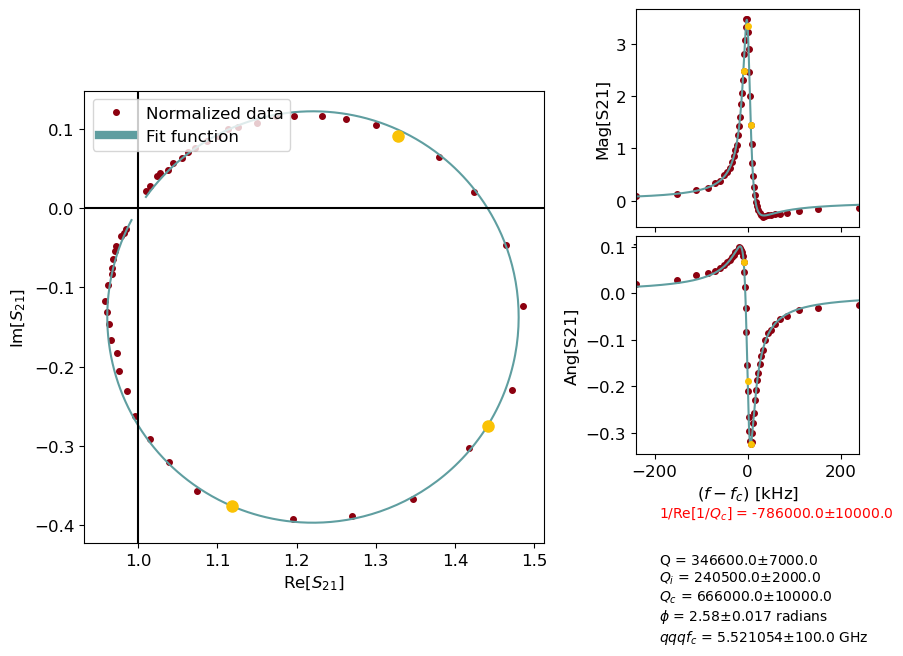

28.45


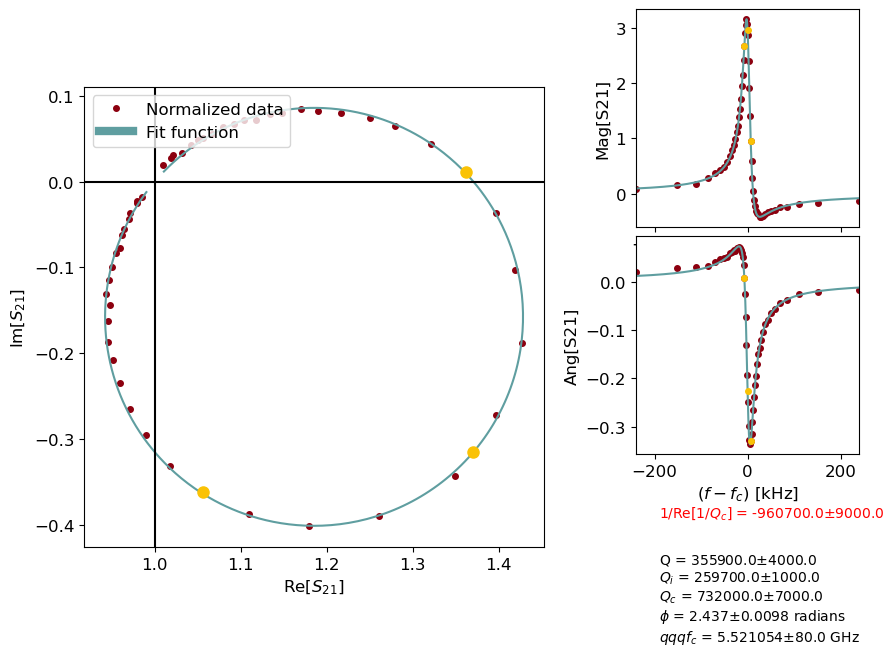

28.45


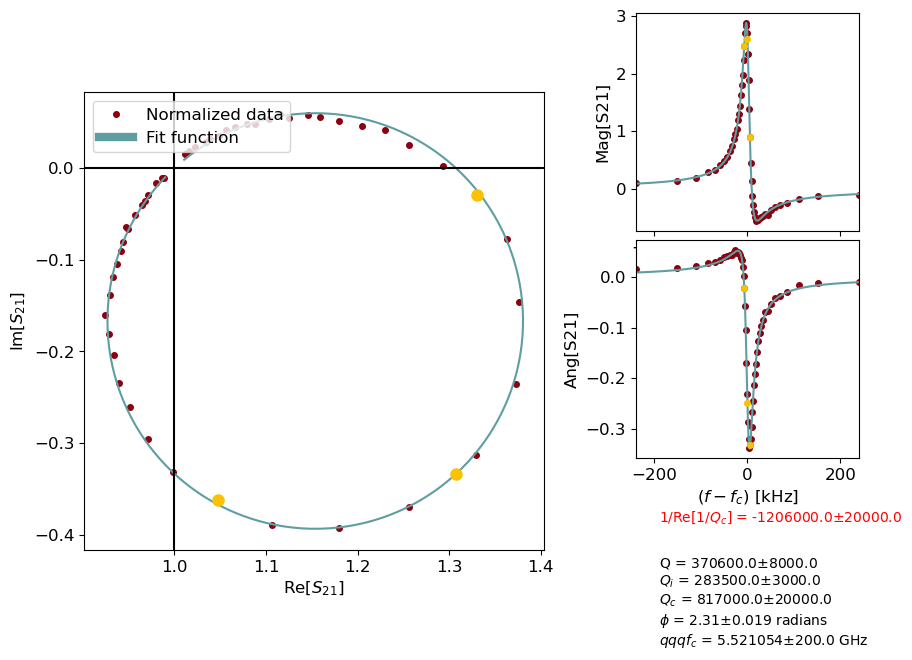

28.45


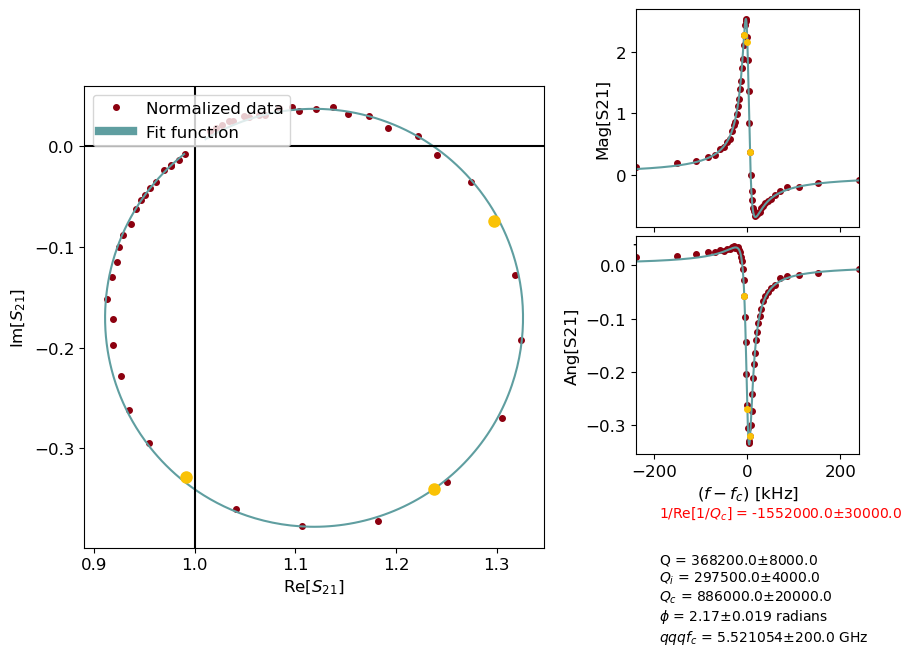

28.45


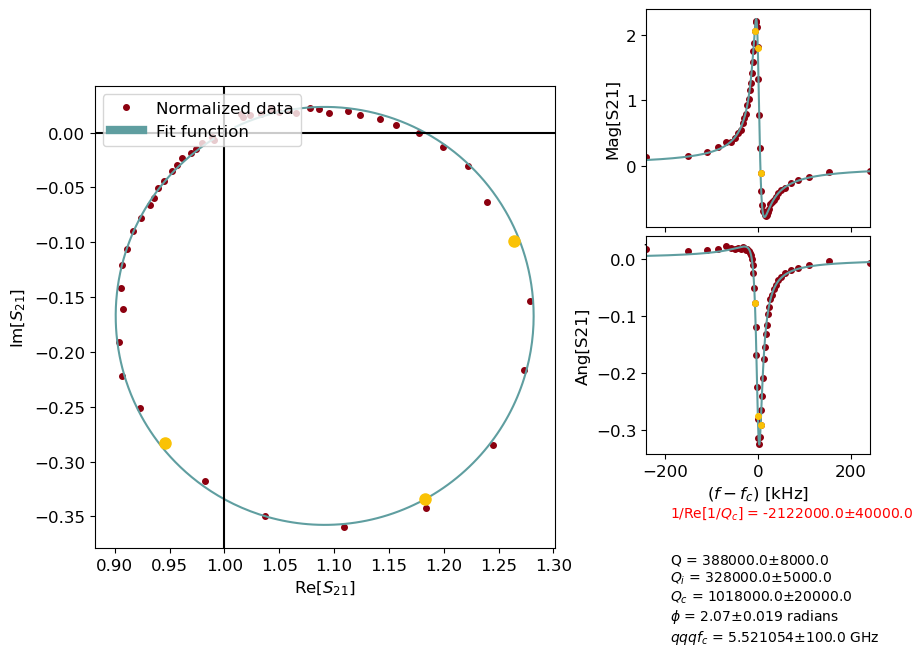

28.45


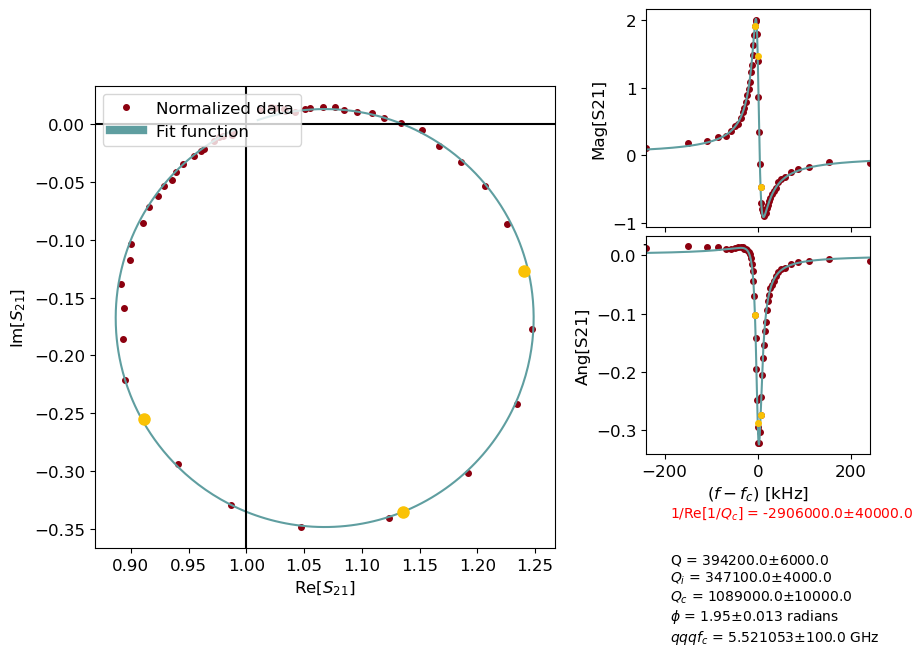

28.45


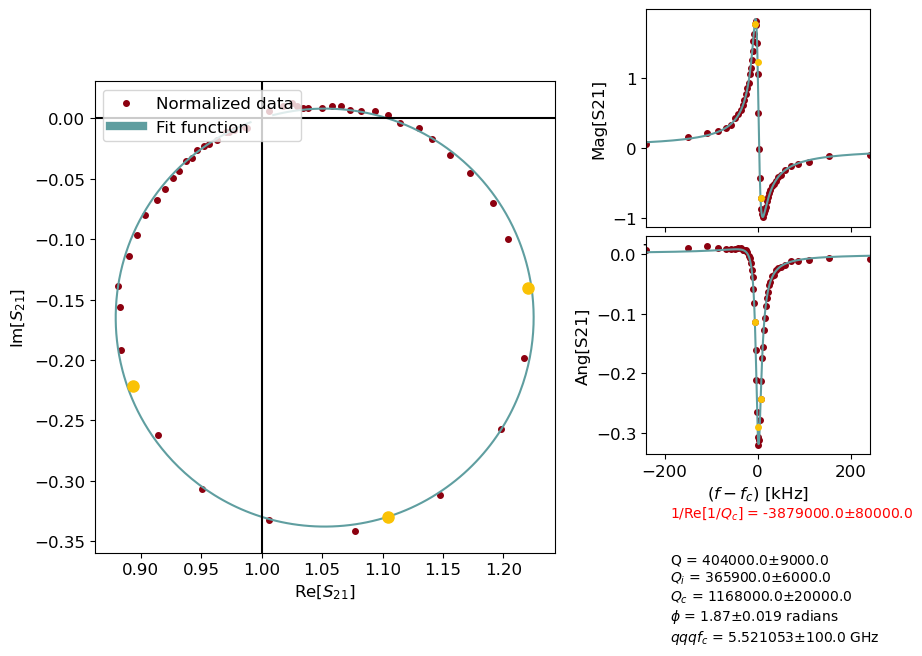

28.45


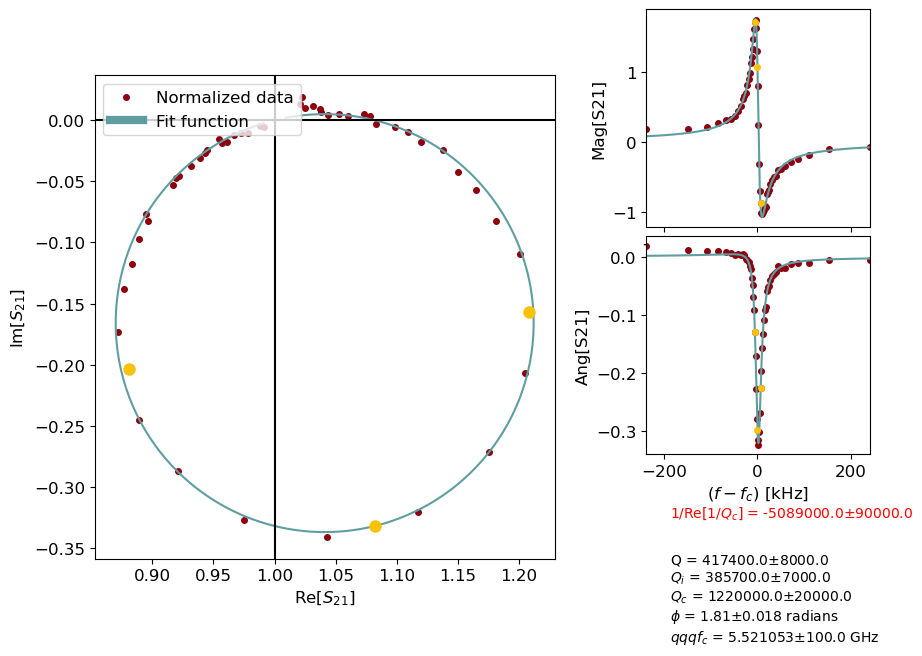

28.45


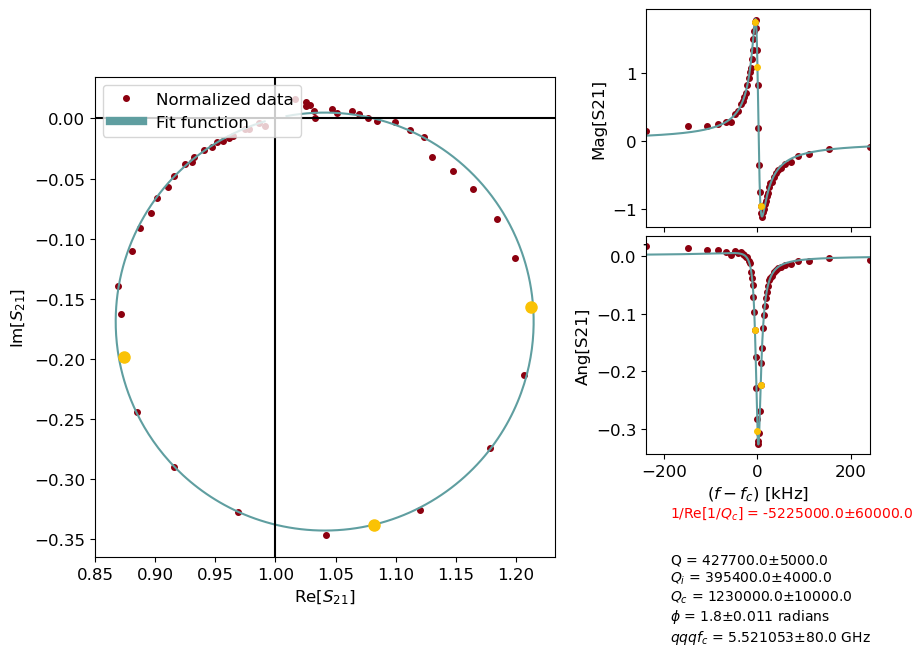

Time elapsed:  9.034449338912964
['res_5824_33', 'res_5824_30', 'res_5824_27', 'res_5824_24', 'res_5824_21', 'res_5824_18', 'res_5824_15', 'res_5824_12', 'res_5824_9', 'res_5824_6', 'res_5824_3', 'res_5824_0']
28.45


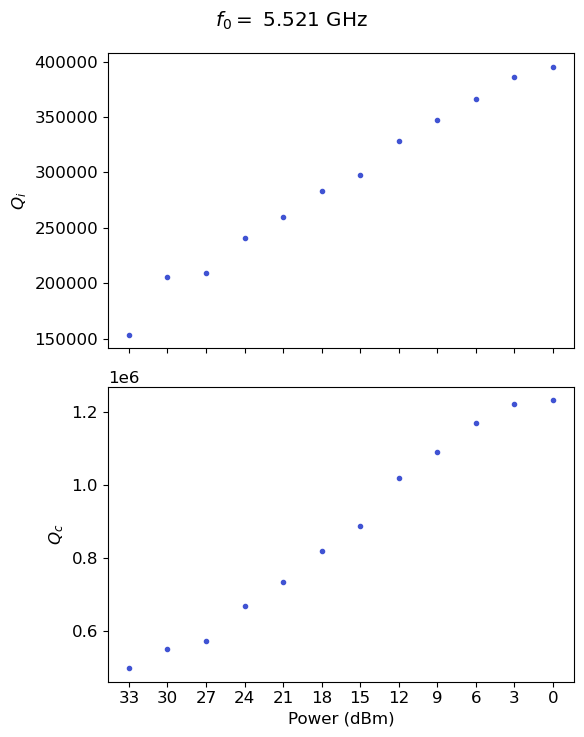

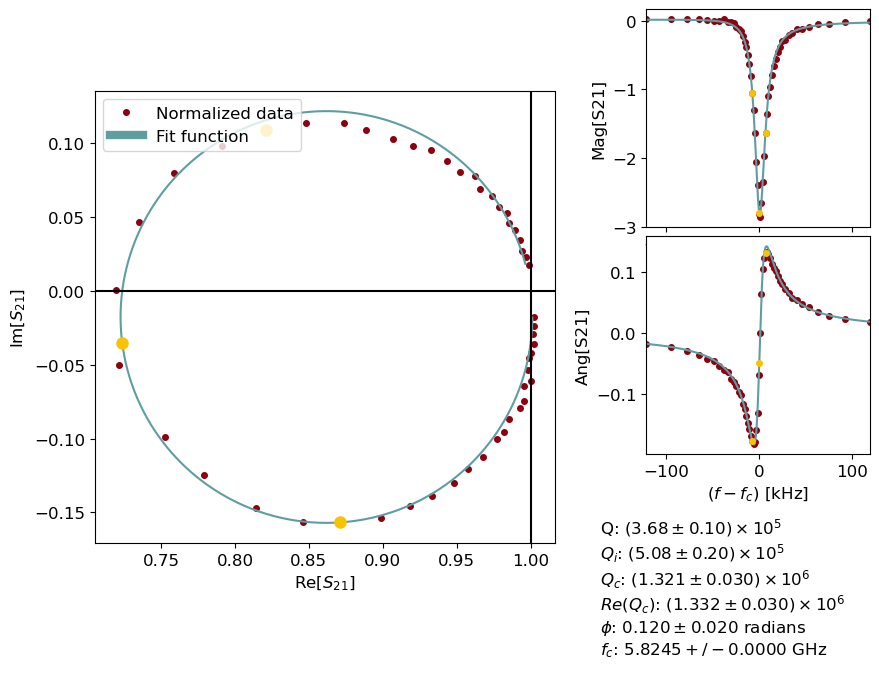

28.45


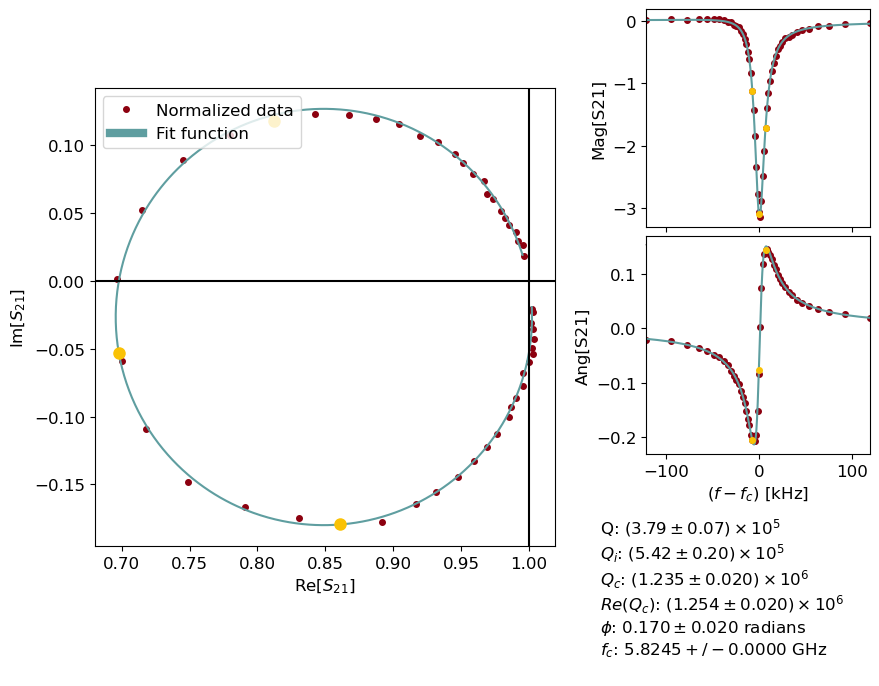

28.45


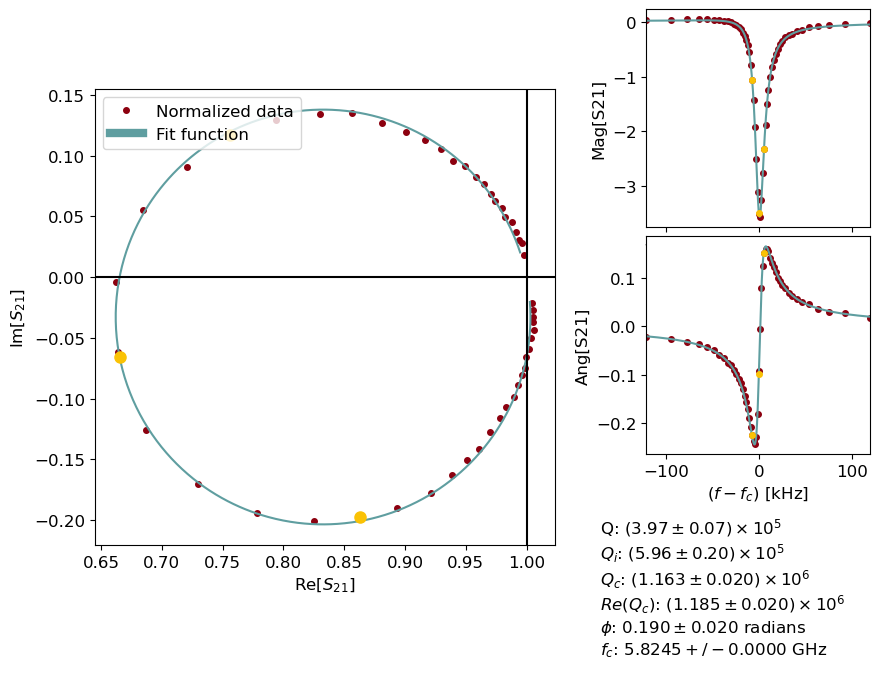

28.45


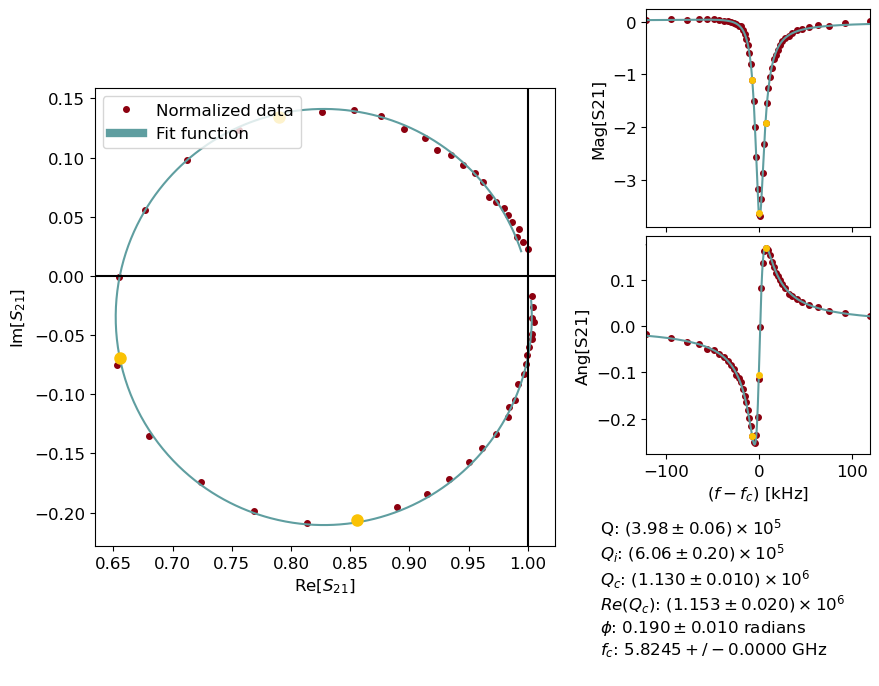

28.45


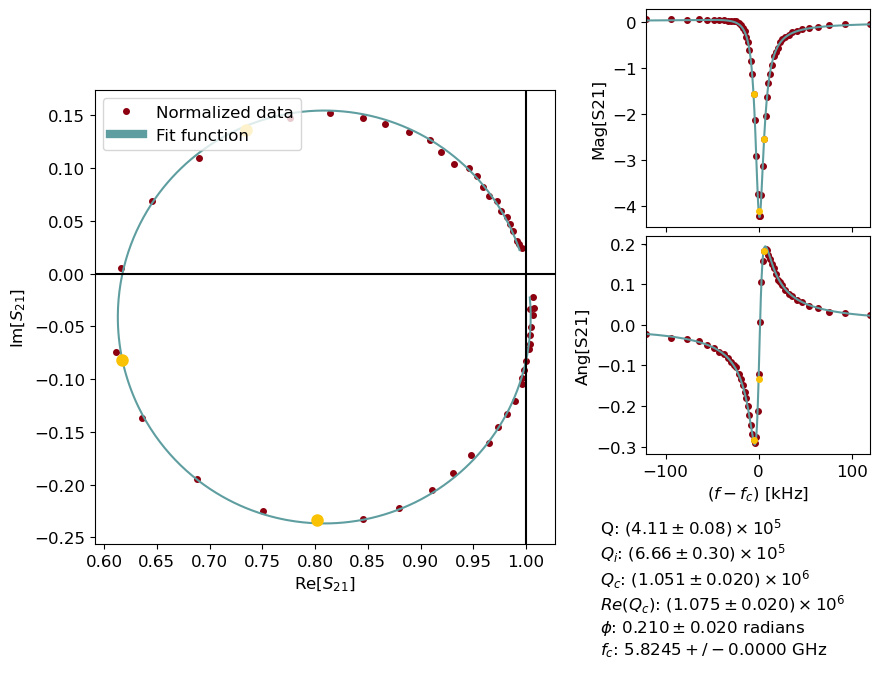

28.45


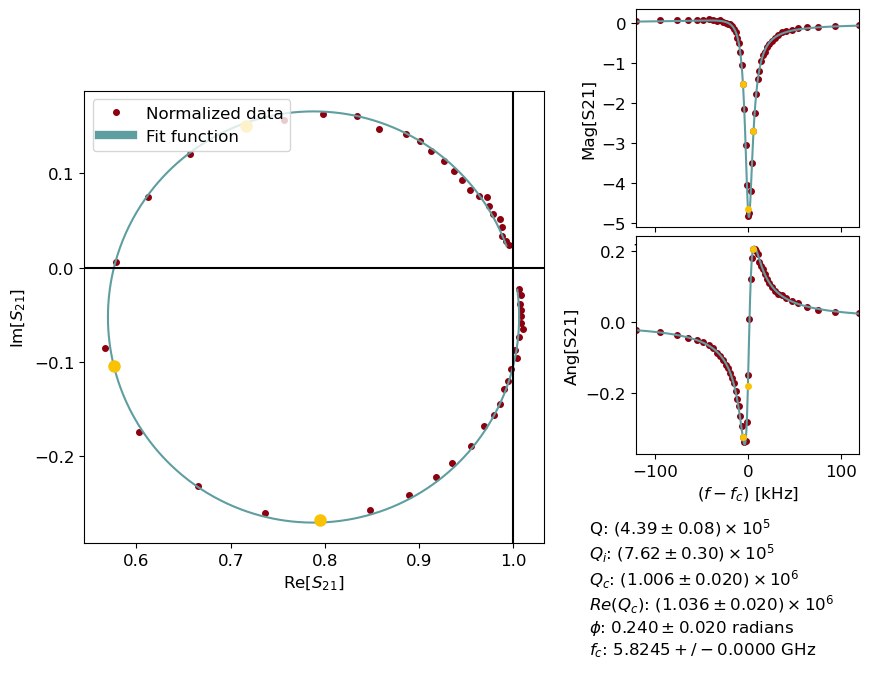

28.45


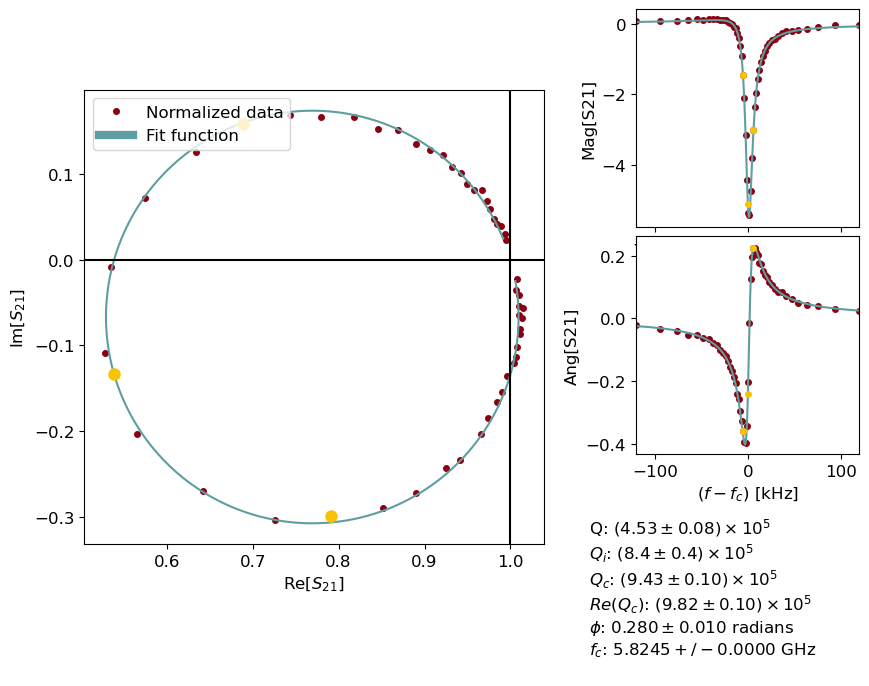

28.45


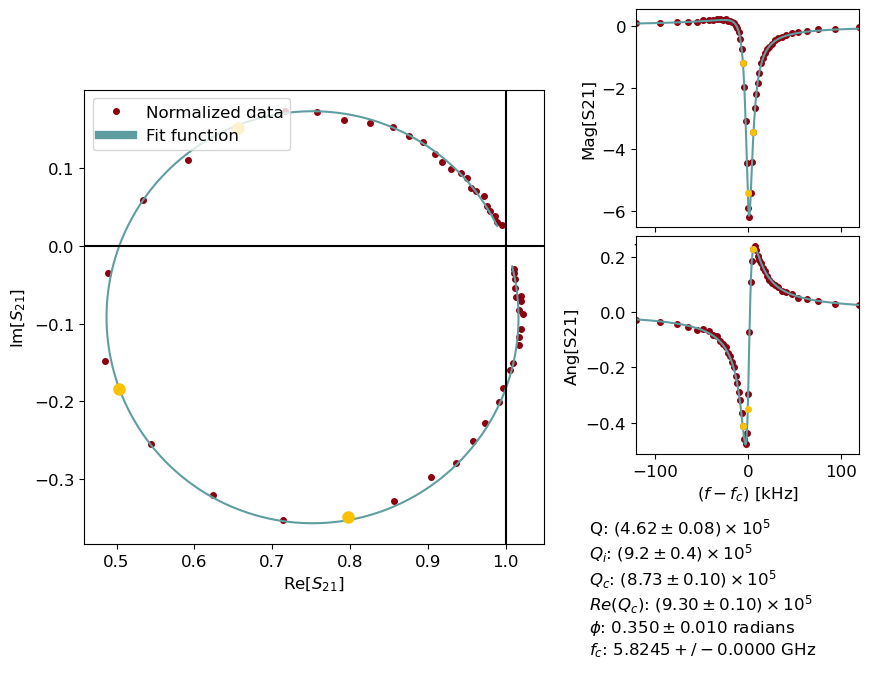

28.45


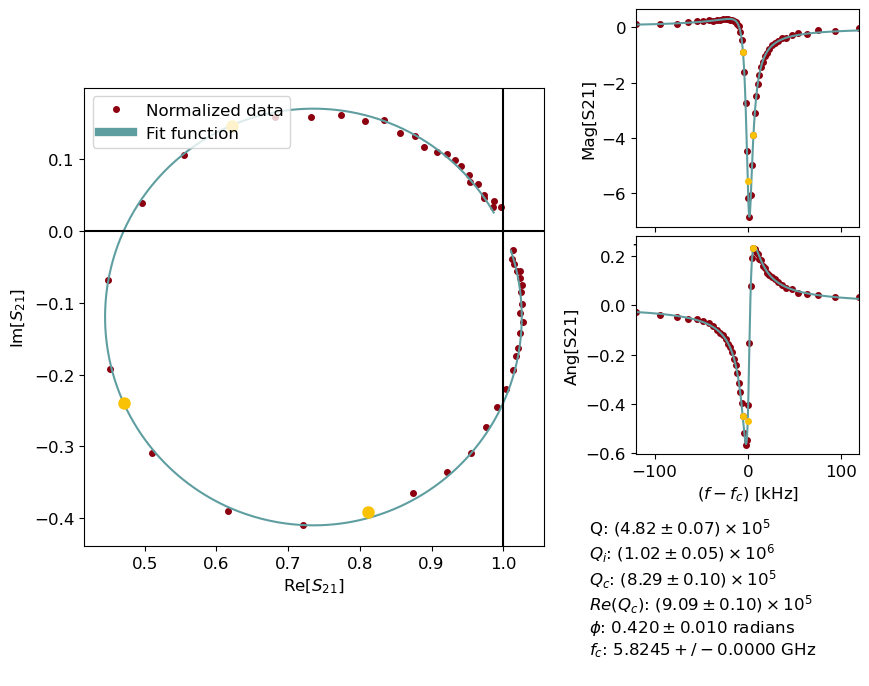

28.45


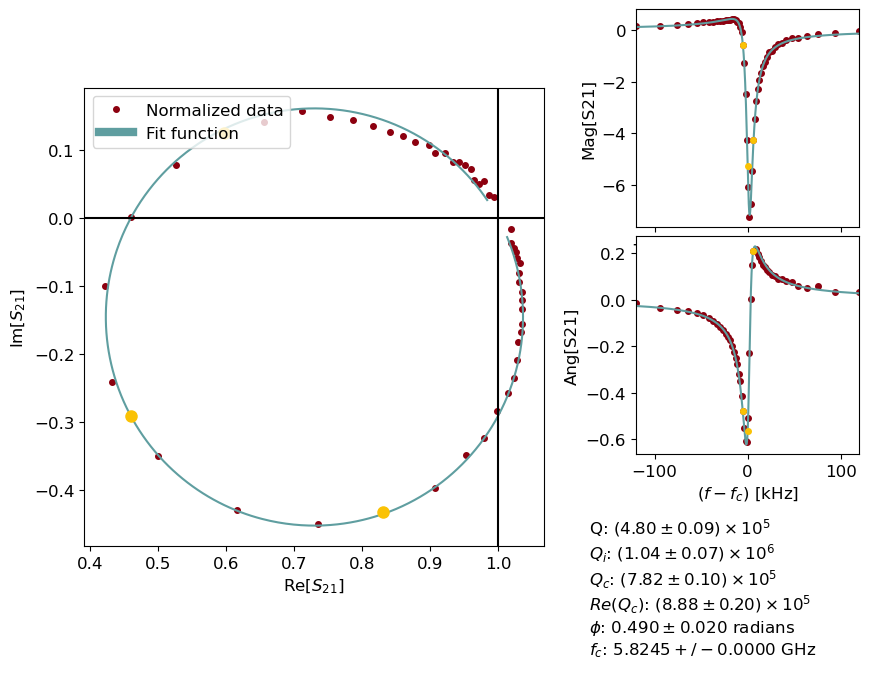

28.45


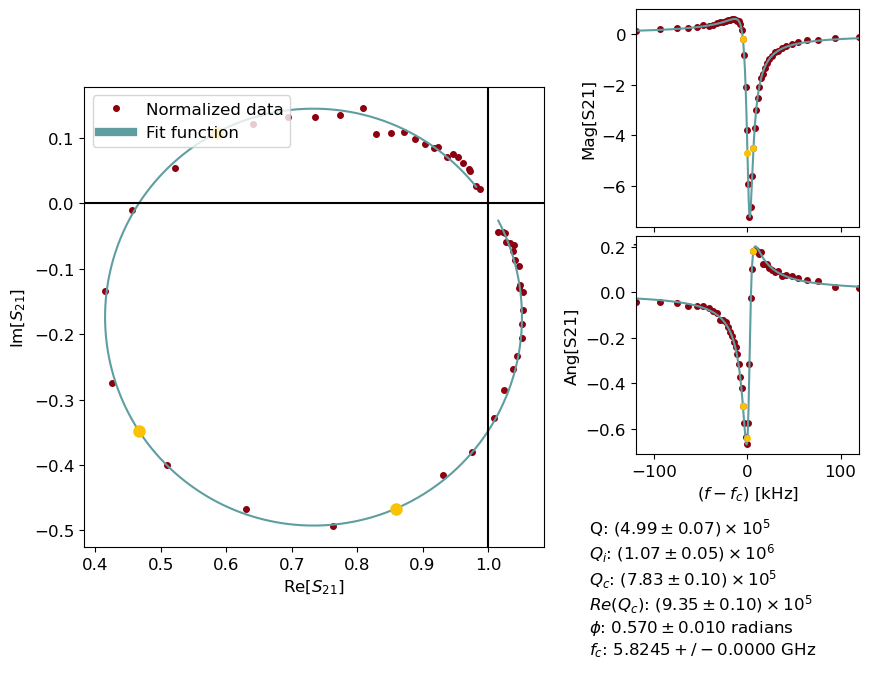

28.45


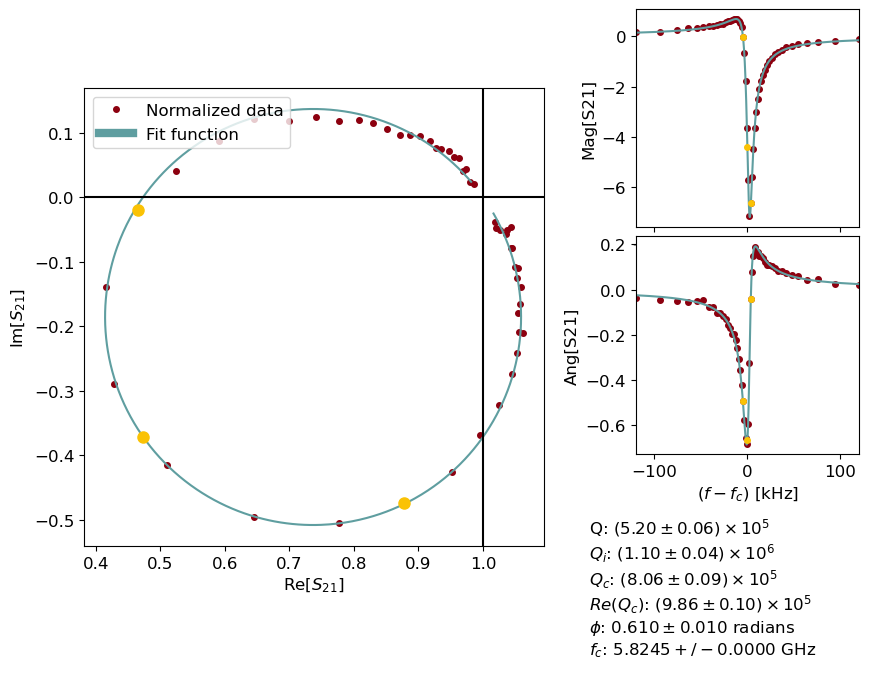

Time elapsed:  19.480268239974976
['res_6094_33', 'res_6094_30', 'res_6094_27', 'res_6094_24', 'res_6094_21', 'res_6094_18', 'res_6094_15', 'res_6094_12', 'res_6094_9', 'res_6094_6', 'res_6094_3', 'res_6094_0']
28.45


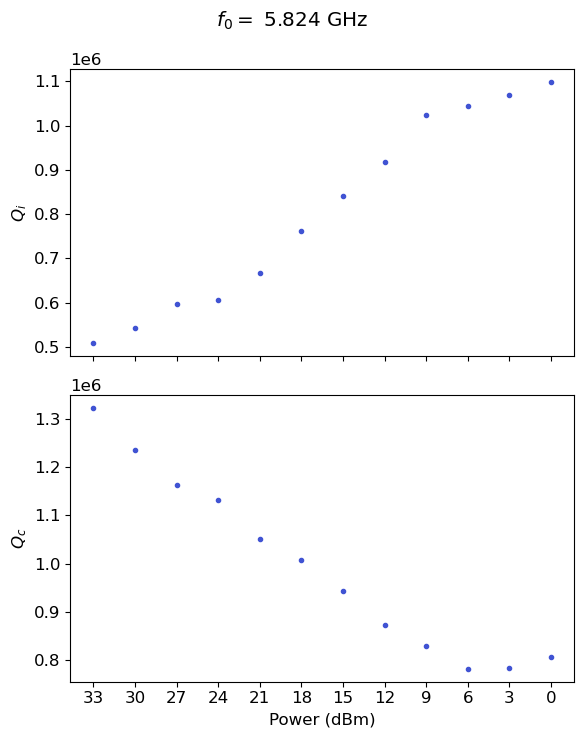

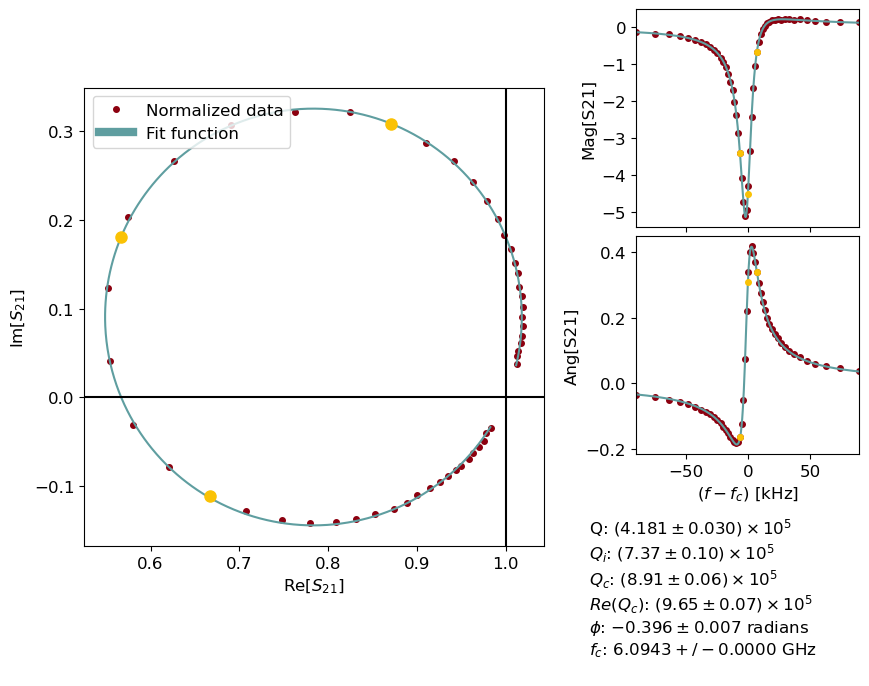

28.45


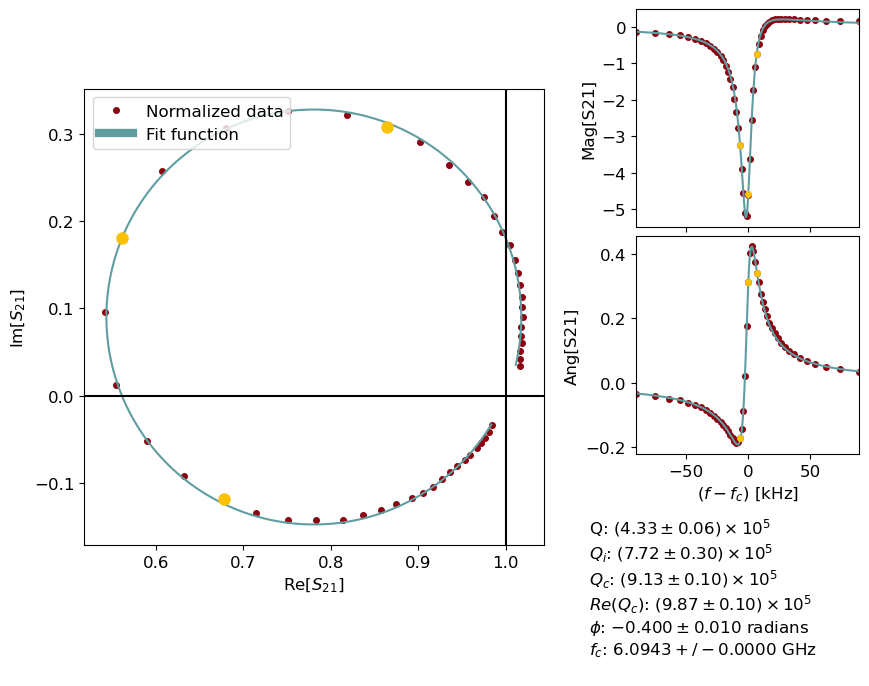

28.45


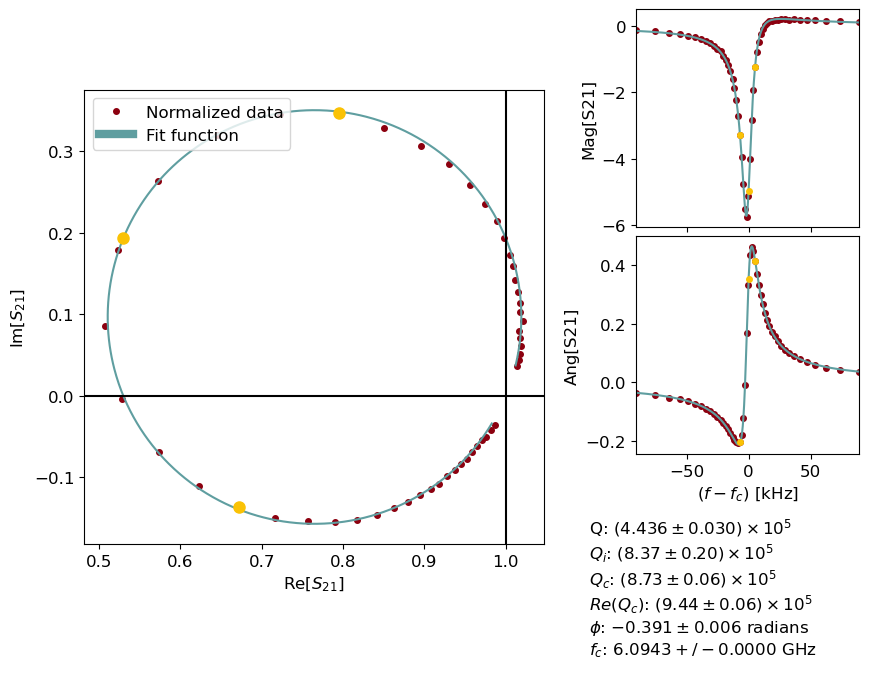

28.45


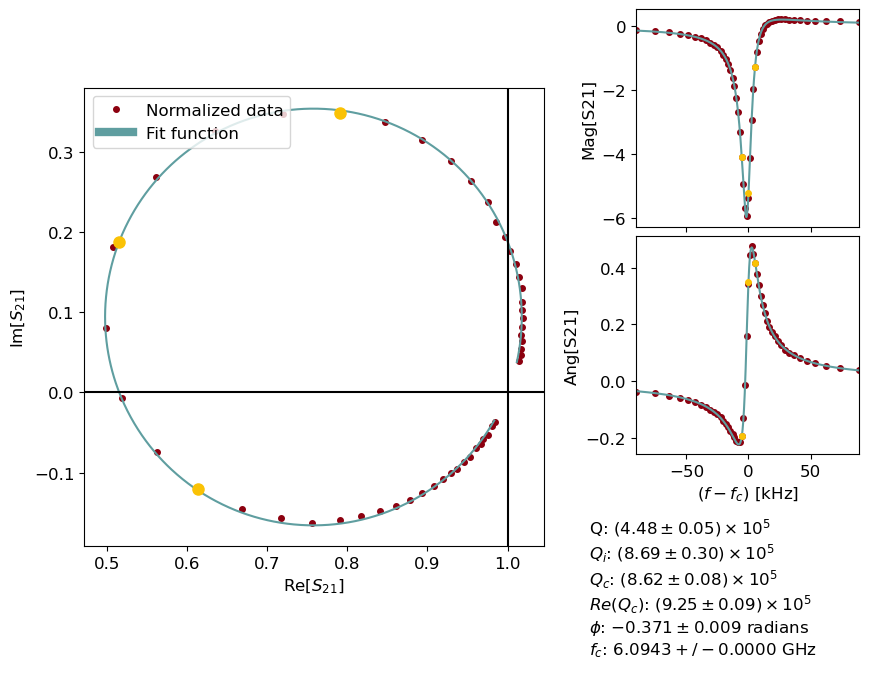

28.45


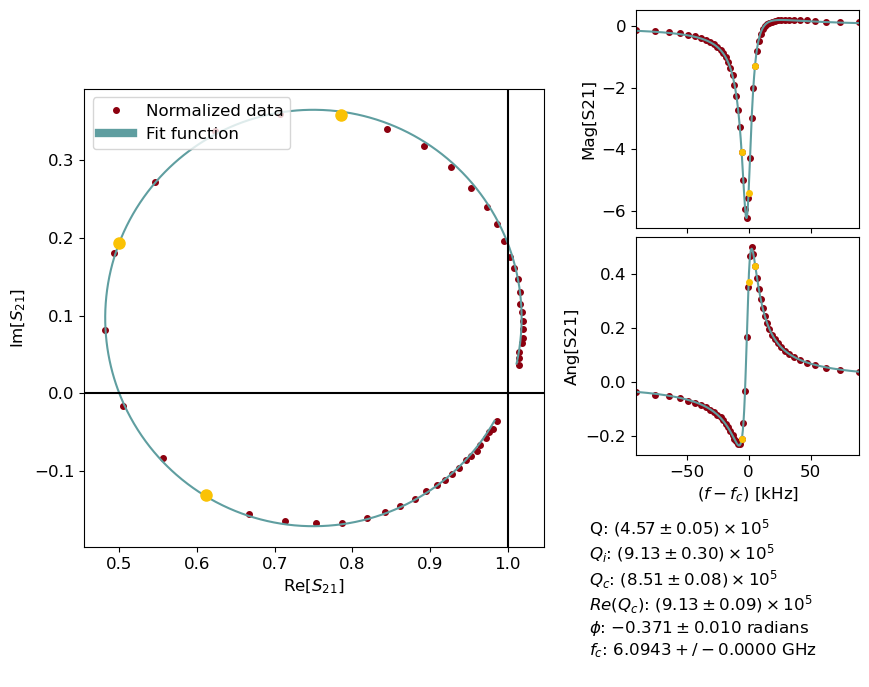

28.45


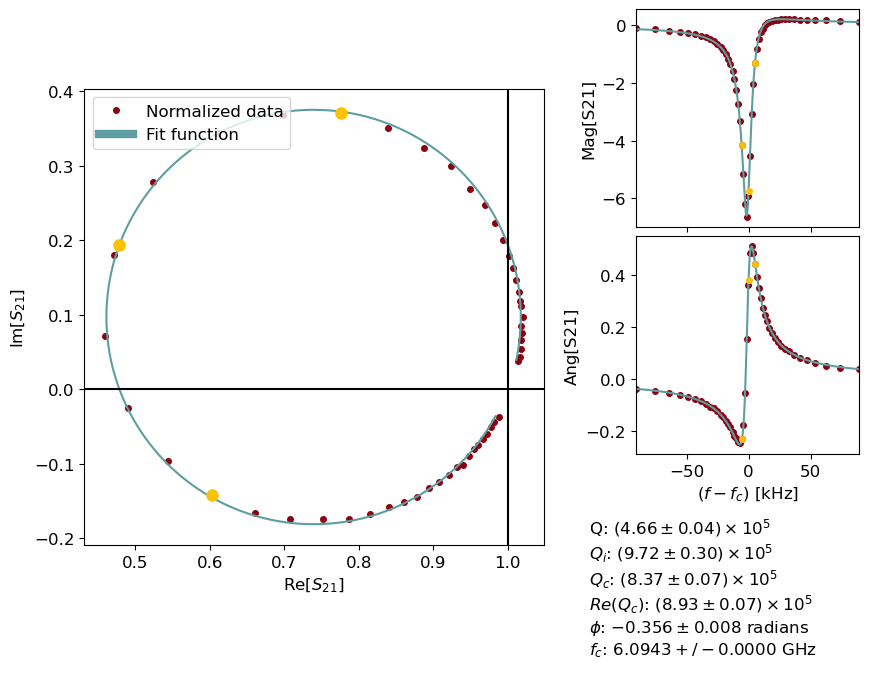

28.45


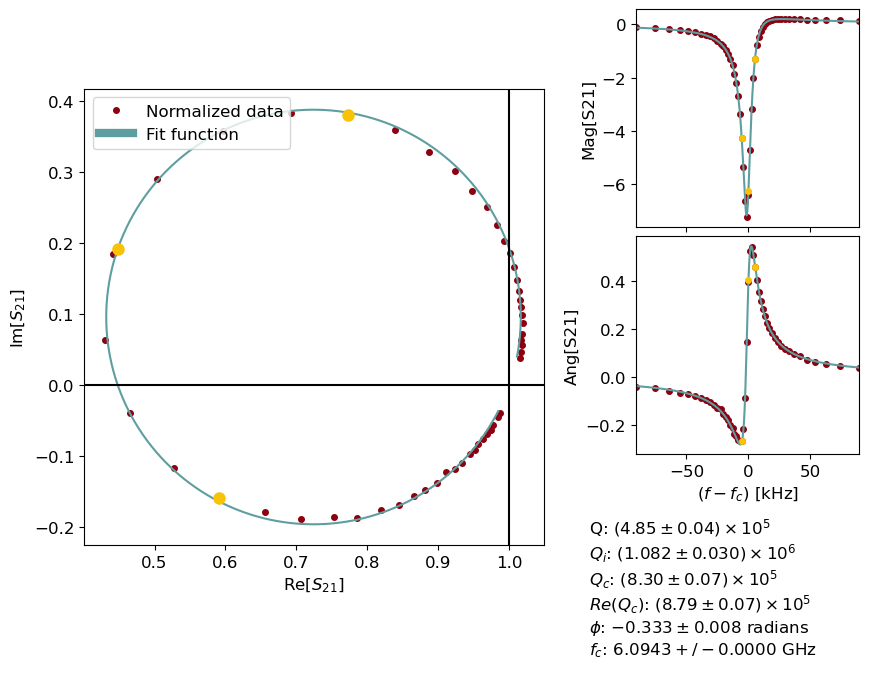

28.45


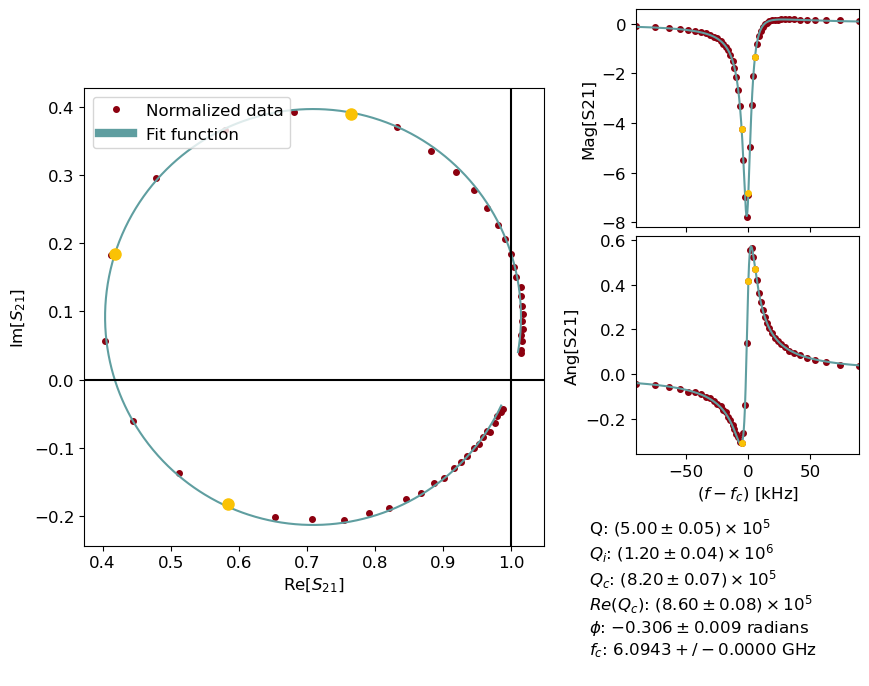

28.45


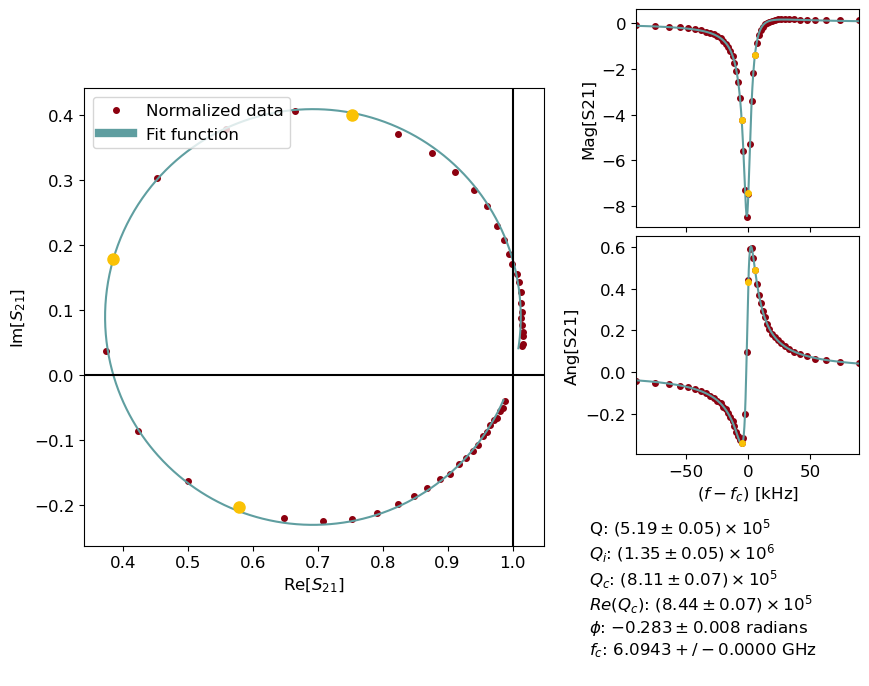

28.45


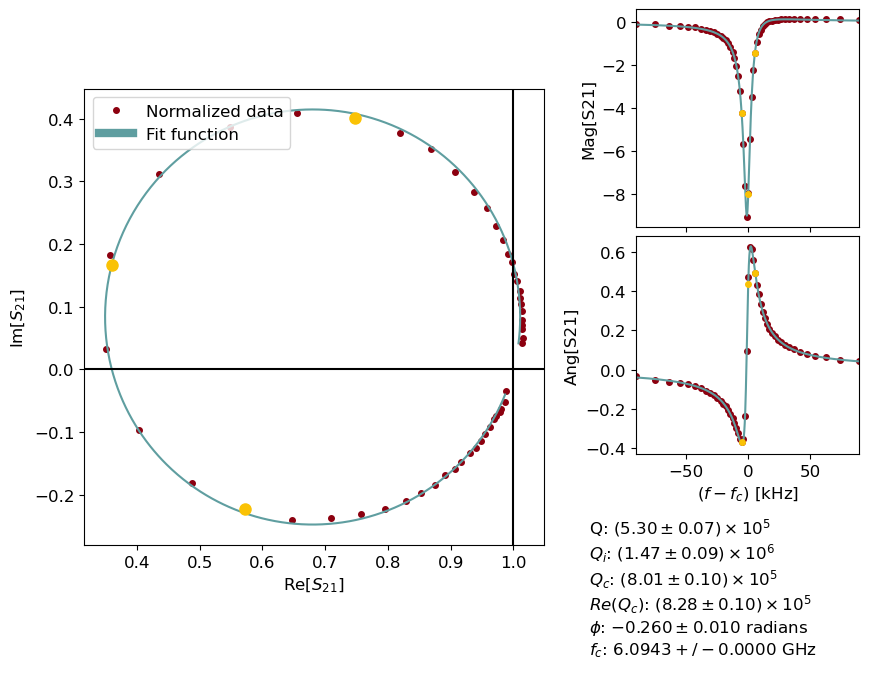

28.45


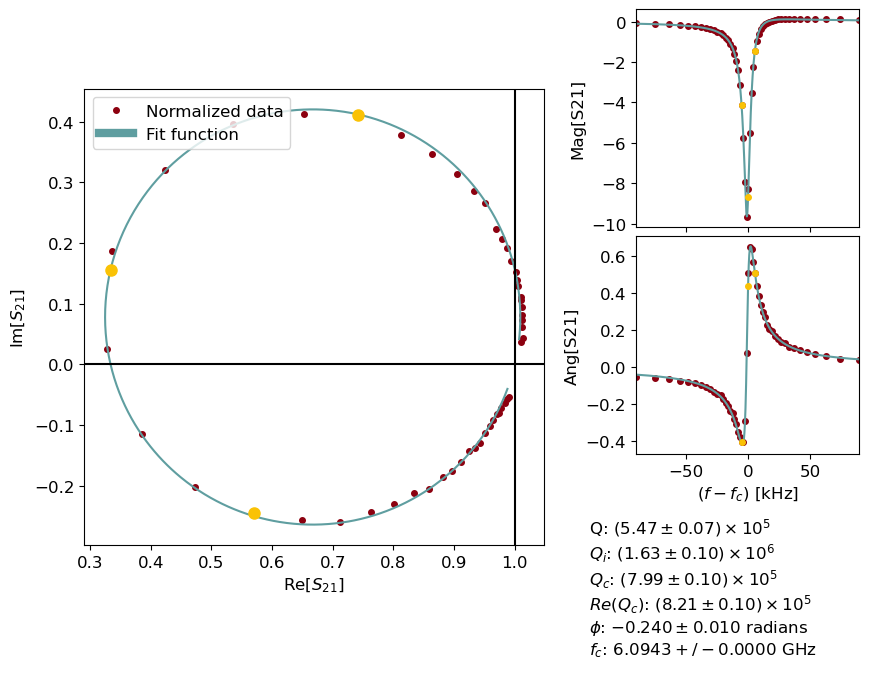

28.45


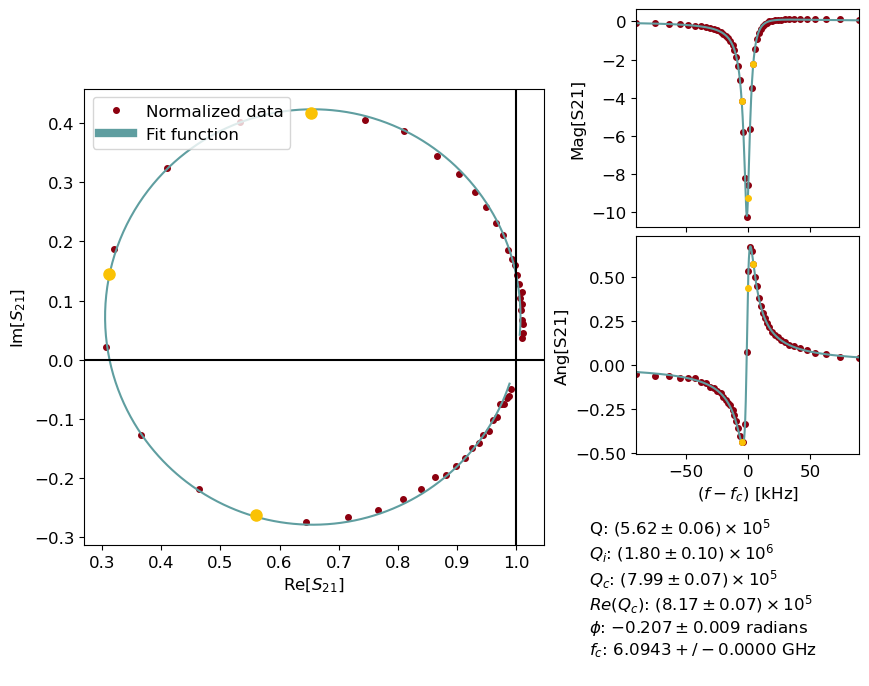

Time elapsed:  29.81364107131958
['res_6371_33', 'res_6371_30', 'res_6371_27', 'res_6371_24', 'res_6371_21', 'res_6371_18', 'res_6371_15', 'res_6371_12', 'res_6371_9', 'res_6371_6', 'res_6371_3', 'res_6371_0']
28.45


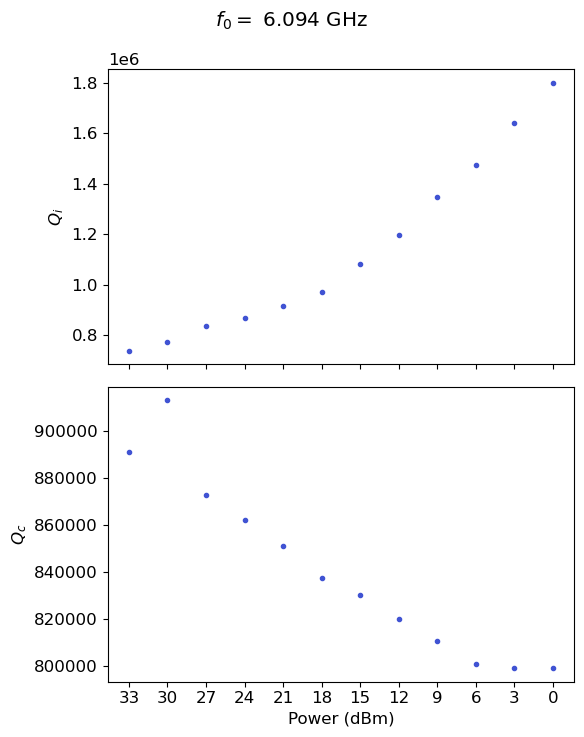

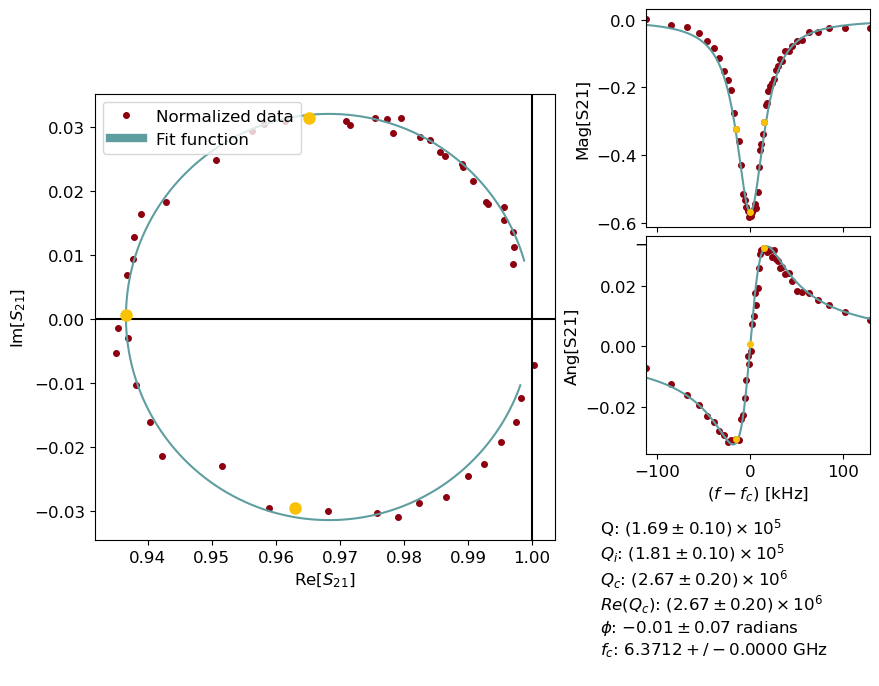

28.45


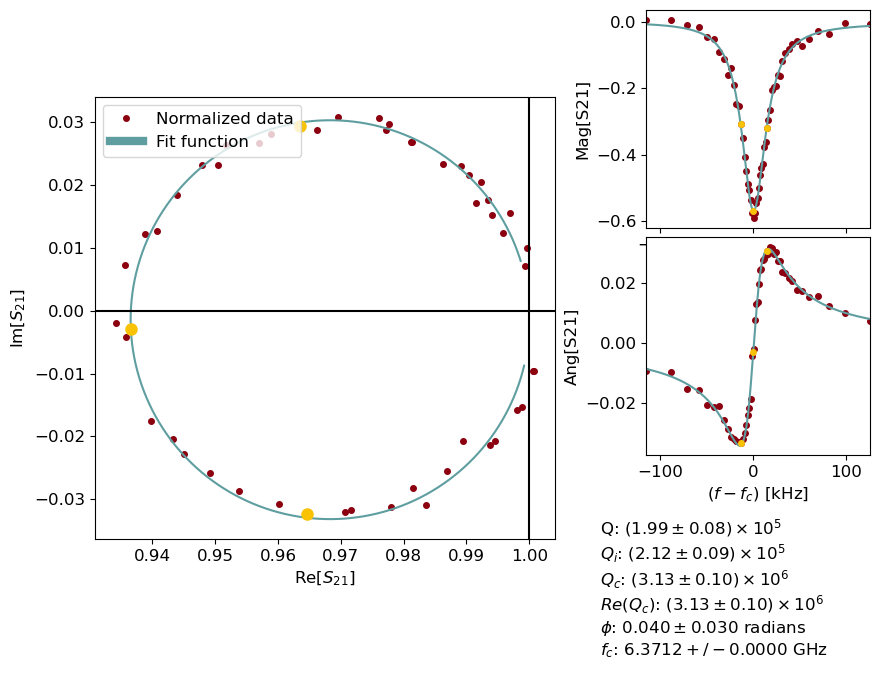

28.45


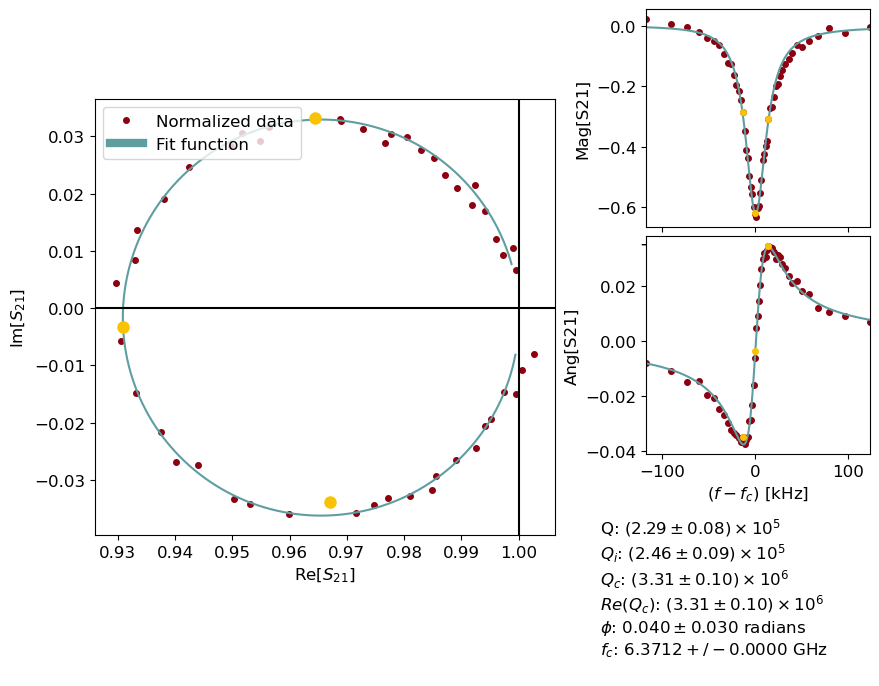

28.45


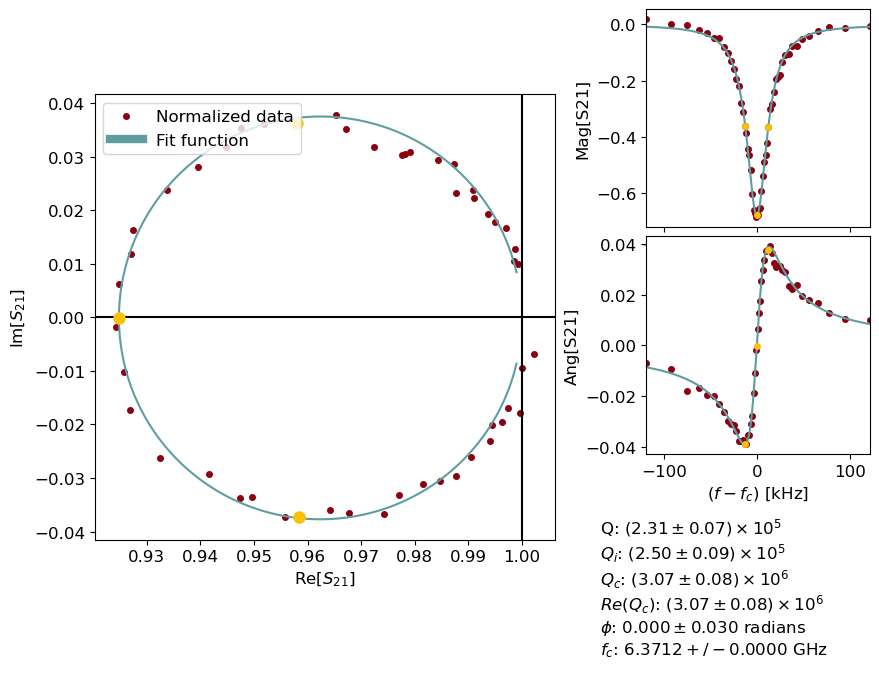

28.45


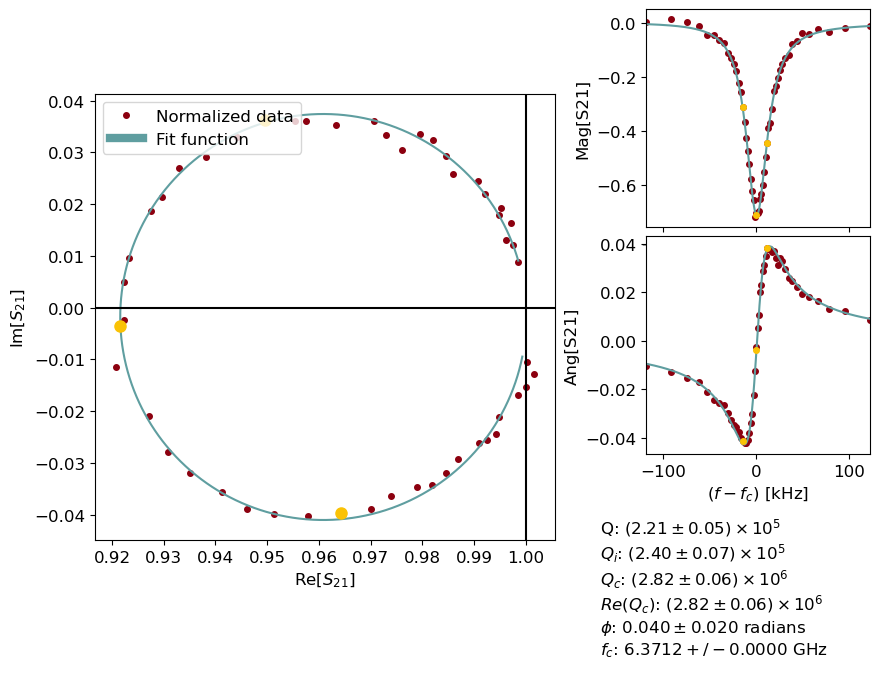

28.45


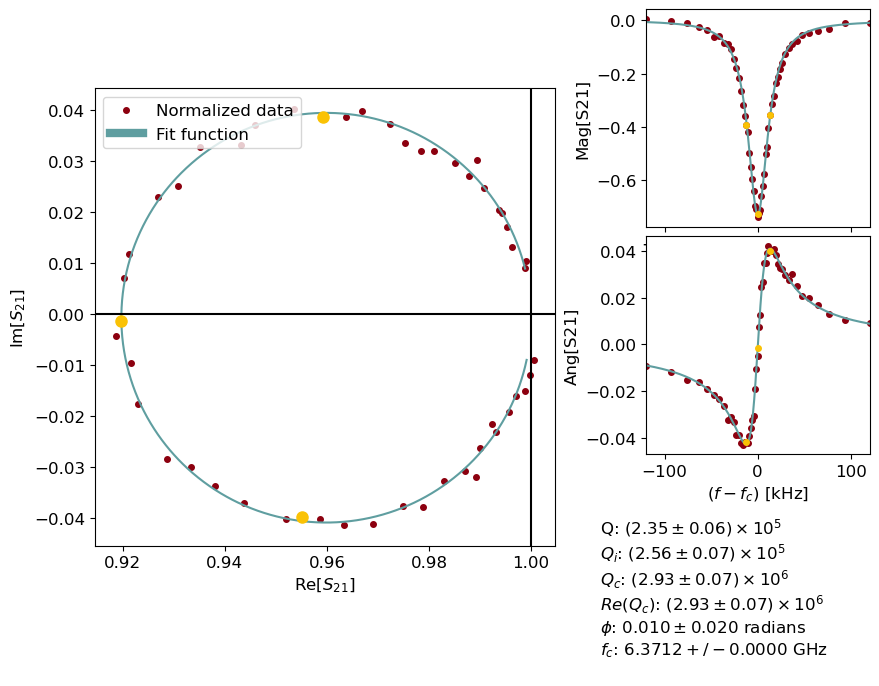

28.45


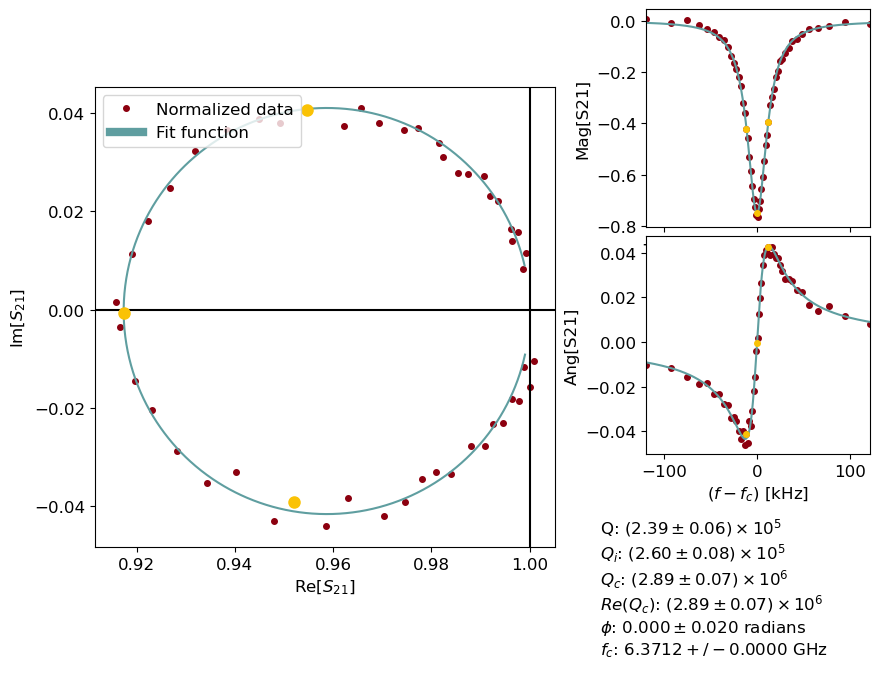

28.45


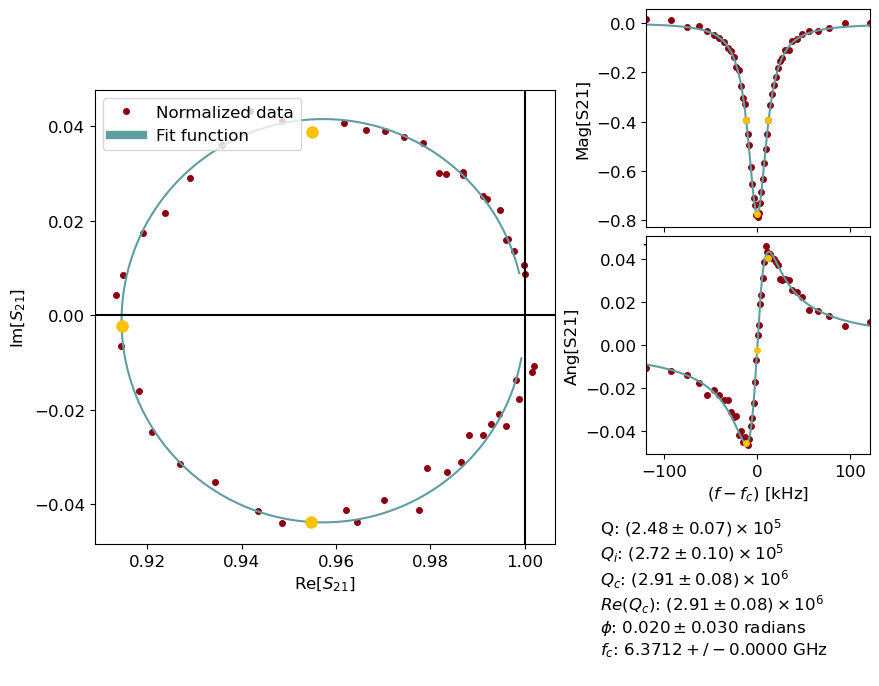

28.45


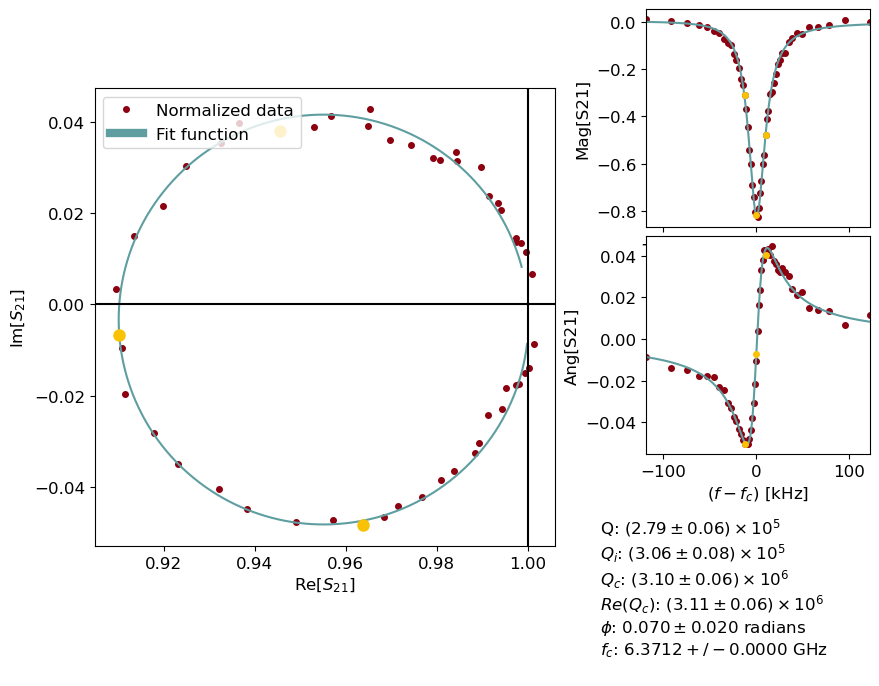

28.45


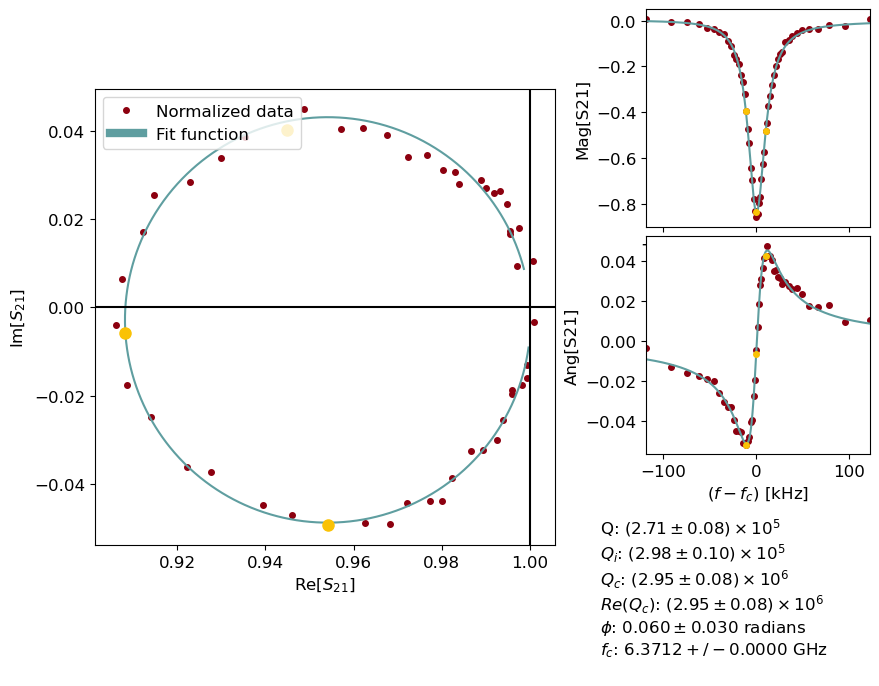

28.45


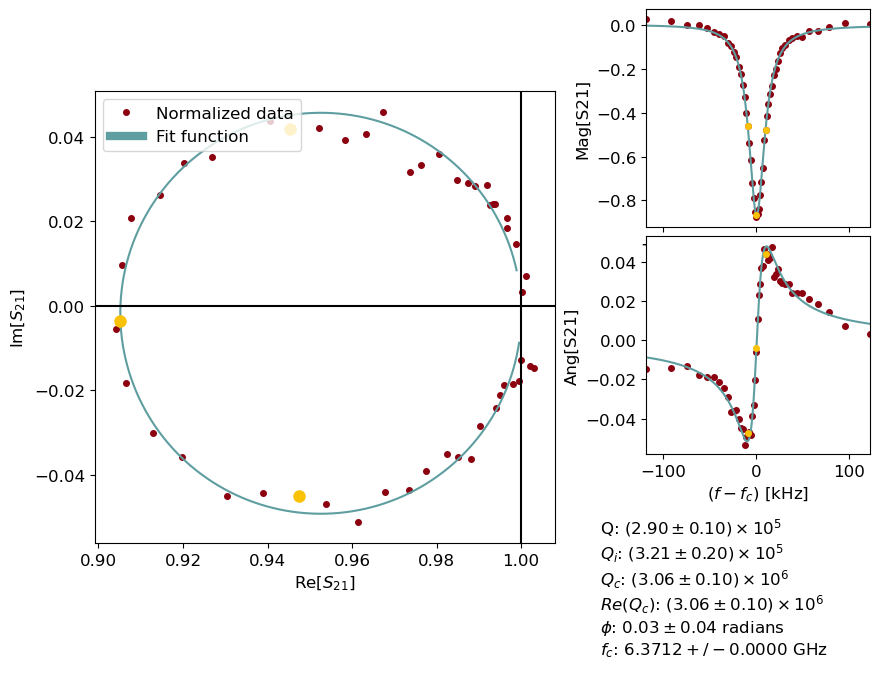

28.45


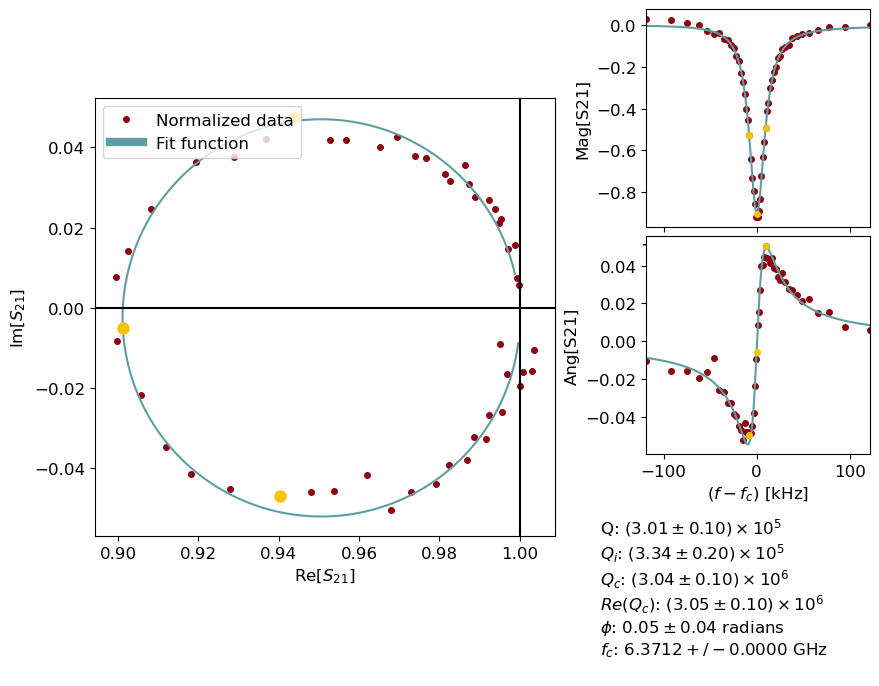

Time elapsed:  41.27984023094177
['res_6379_33', 'res_6379_30', 'res_6379_27', 'res_6379_24', 'res_6379_21', 'res_6379_18', 'res_6379_15', 'res_6379_12', 'res_6379_9', 'res_6379_6', 'res_6379_3', 'res_6379_0']
28.45


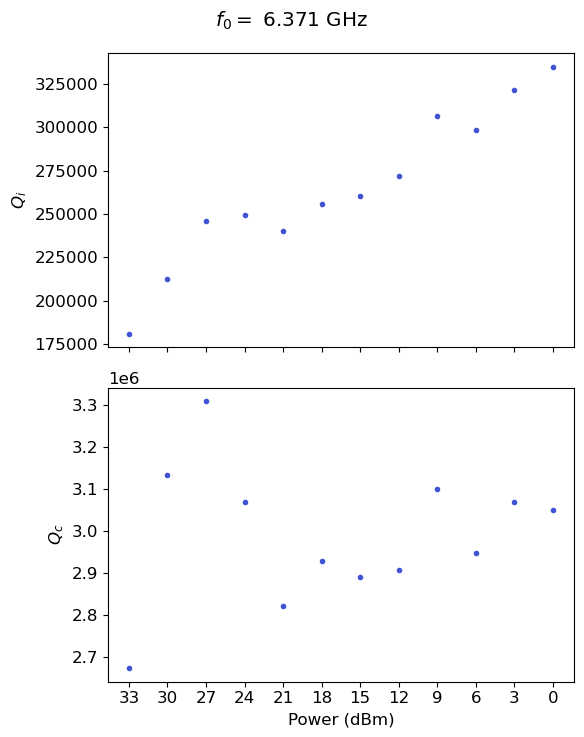

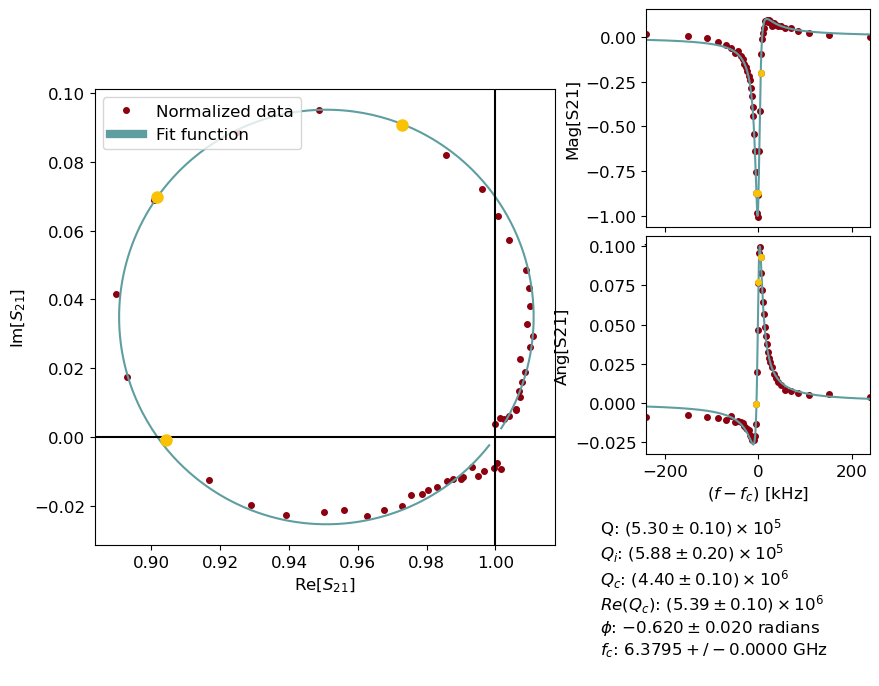

28.45


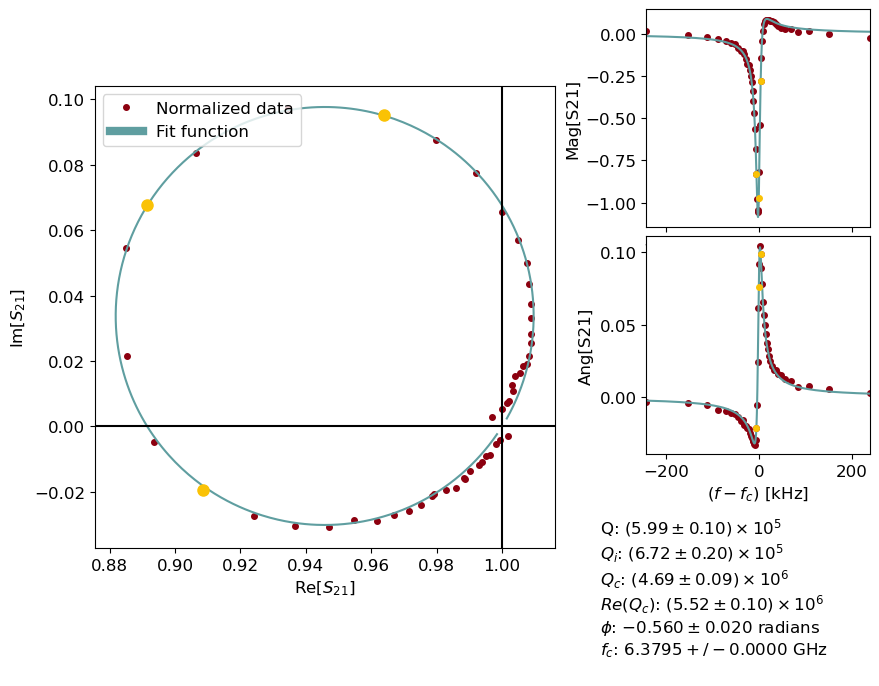

28.45


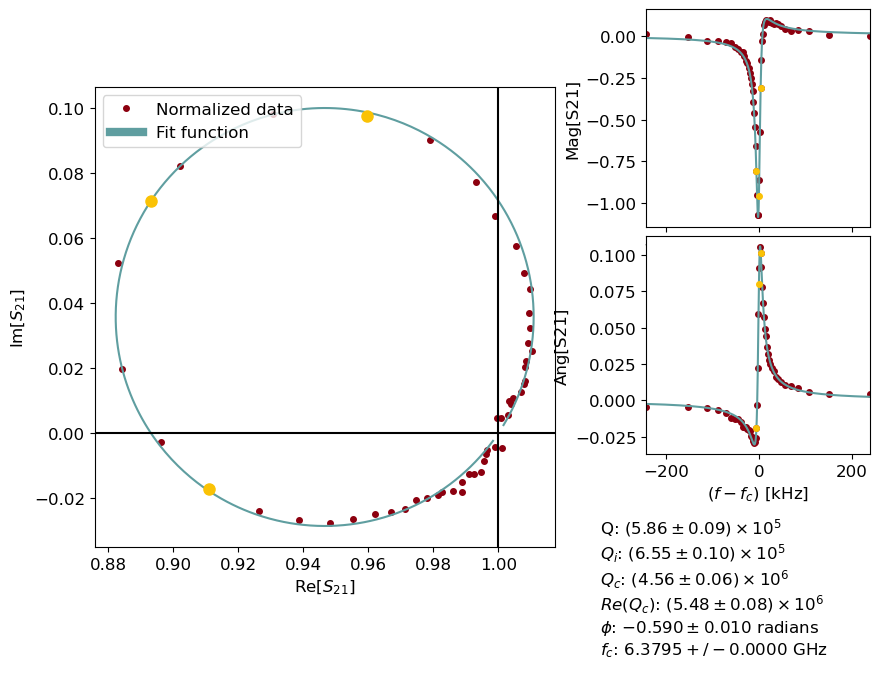

28.45


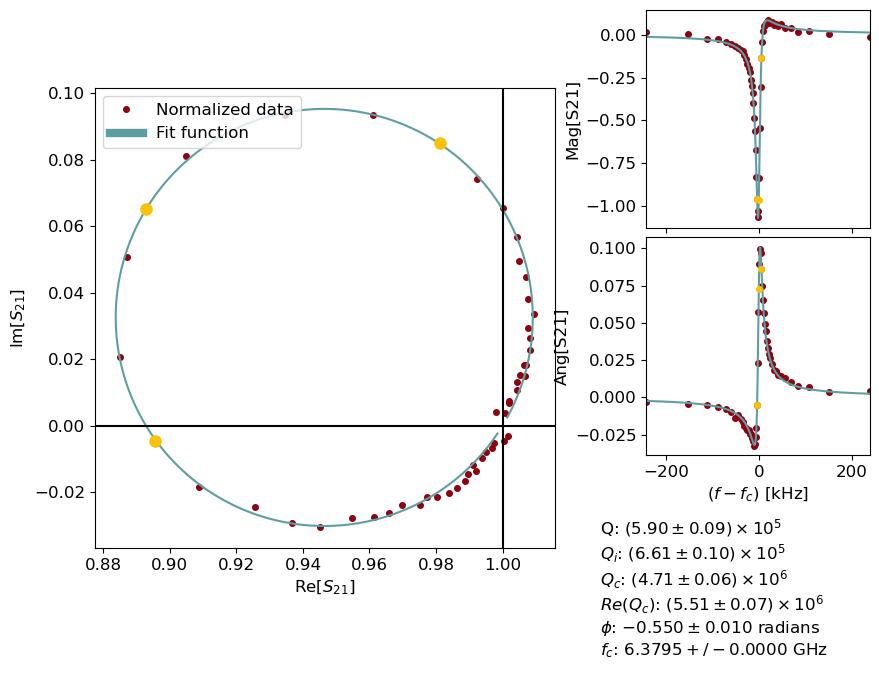

28.45


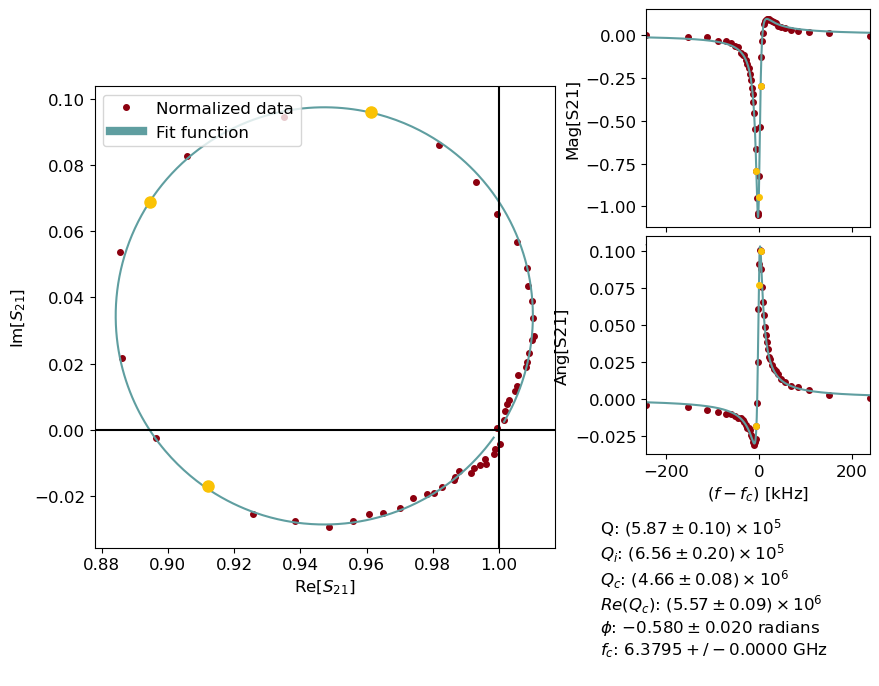

28.45


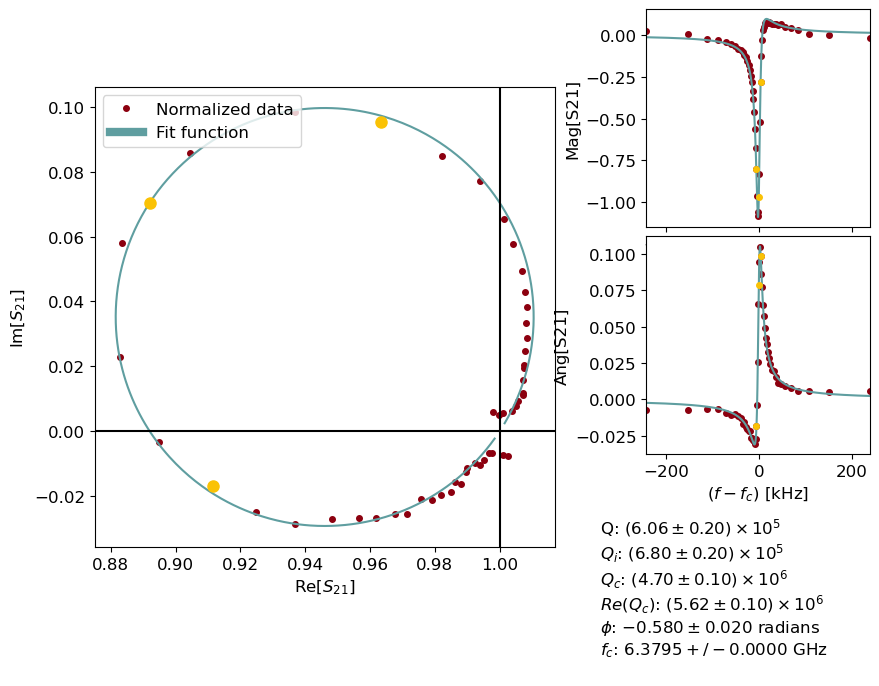

28.45


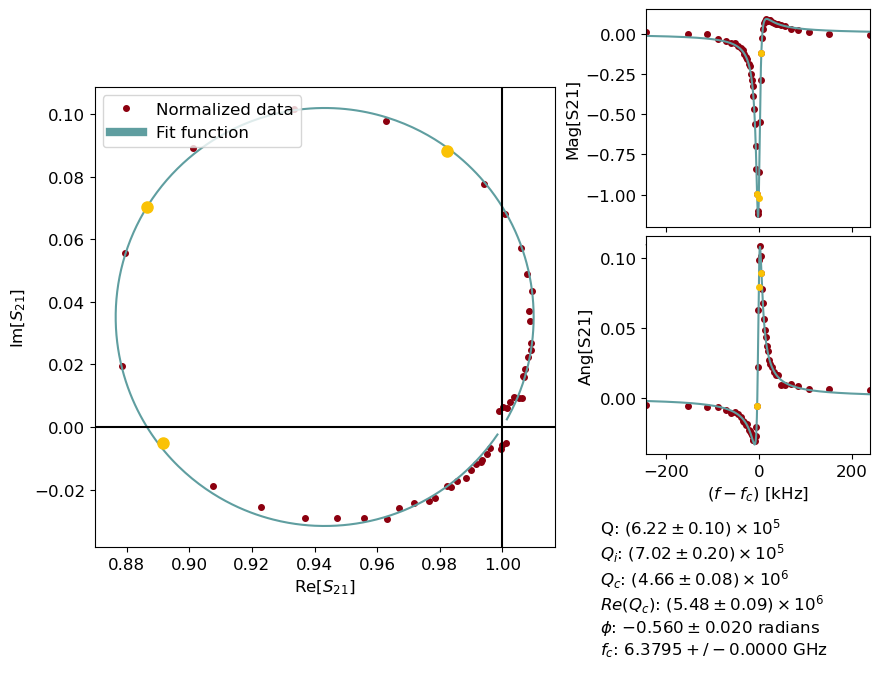

28.45


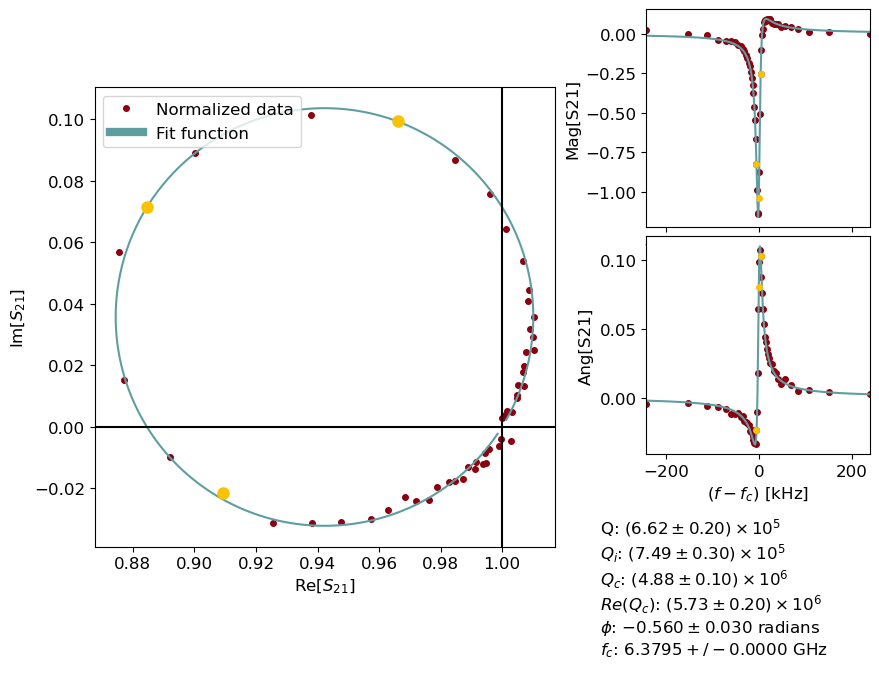

28.45


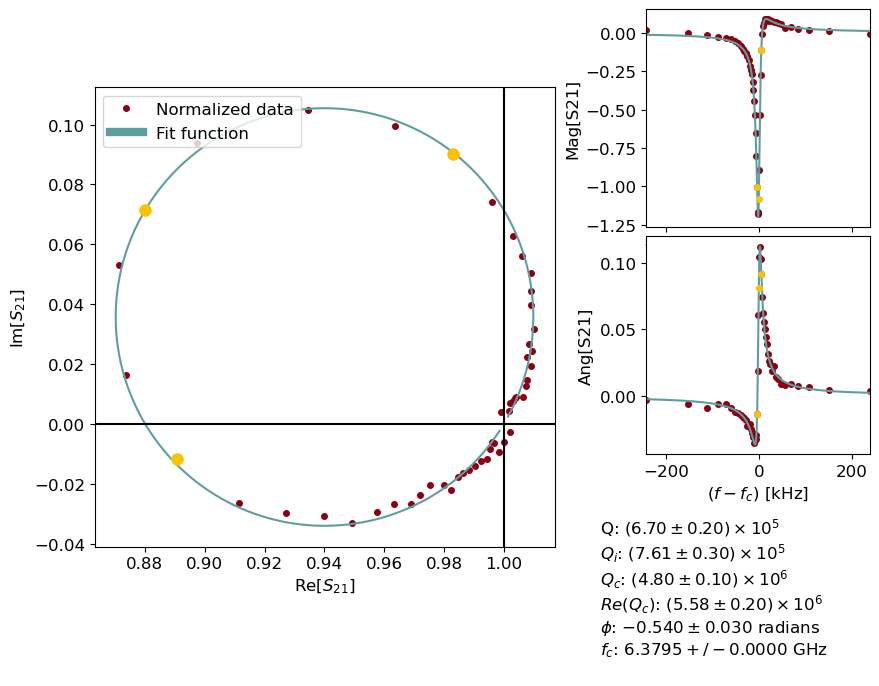

28.45


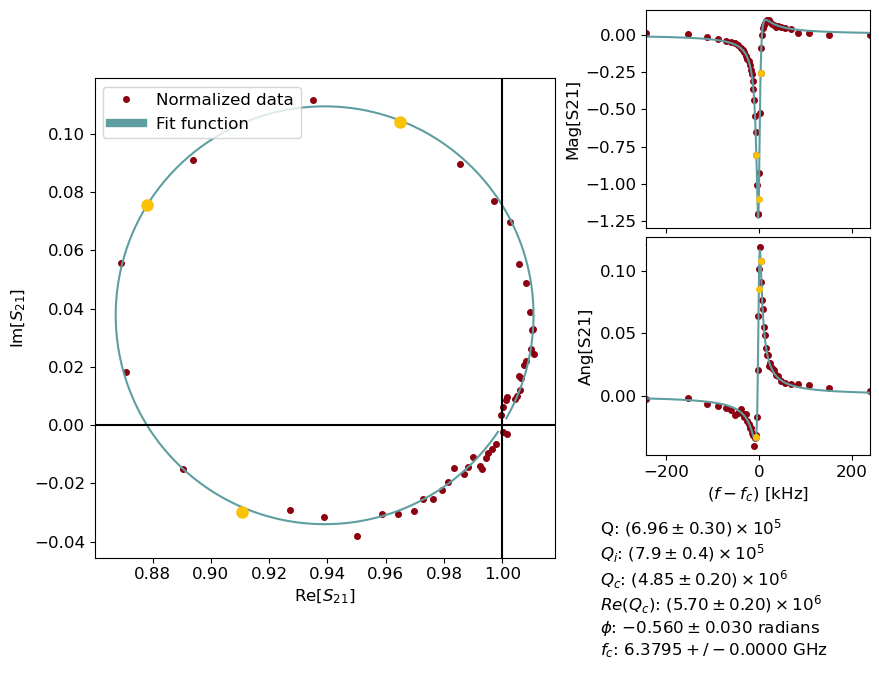

28.45


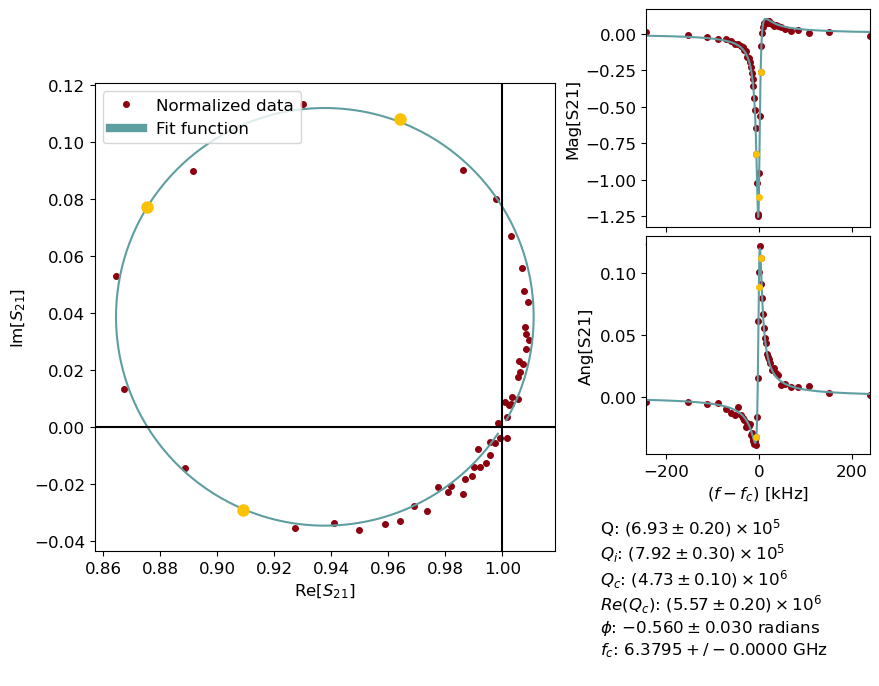

28.45


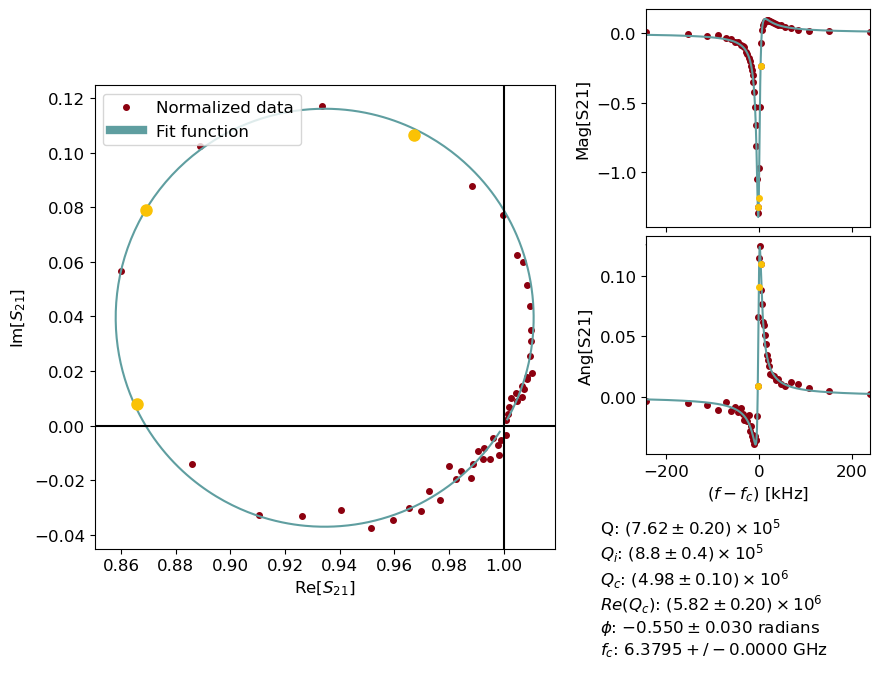

Time elapsed:  52.07817482948303
['res_6704_33', 'res_6704_30', 'res_6704_27', 'res_6704_24', 'res_6704_21', 'res_6704_18', 'res_6704_15', 'res_6704_12', 'res_6704_9', 'res_6704_6', 'res_6704_3', 'res_6704_0']
28.45


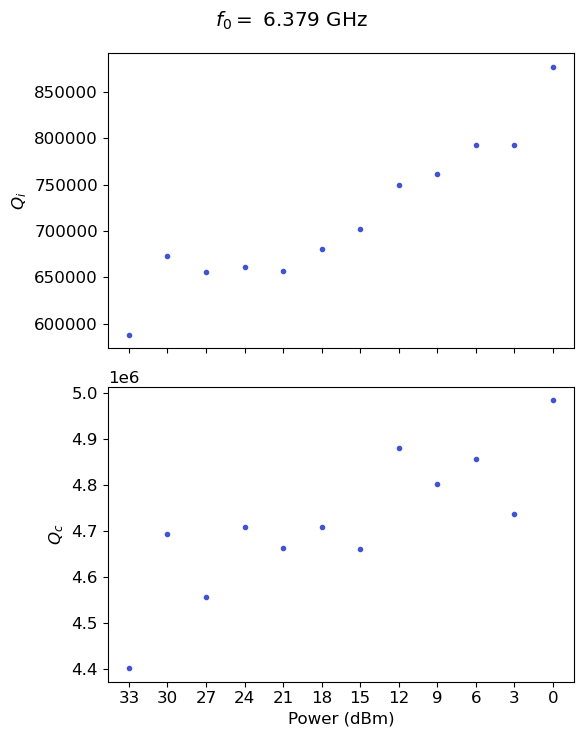

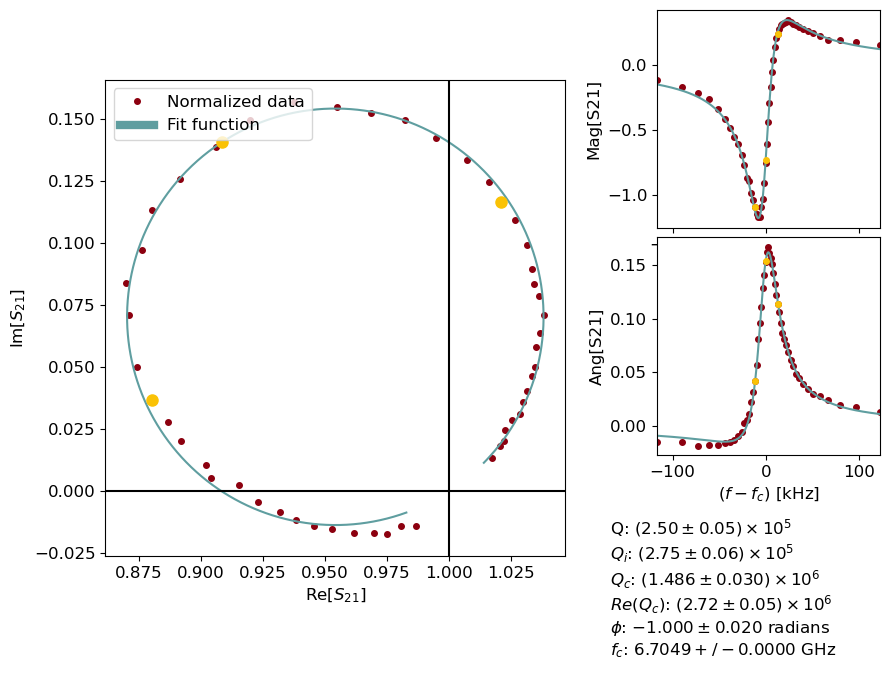

28.45


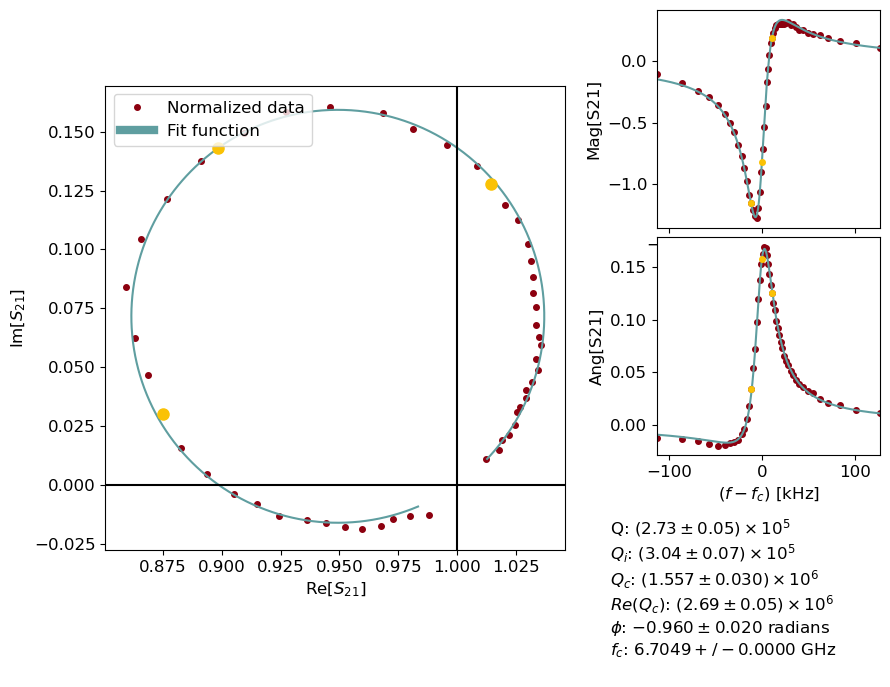

28.45


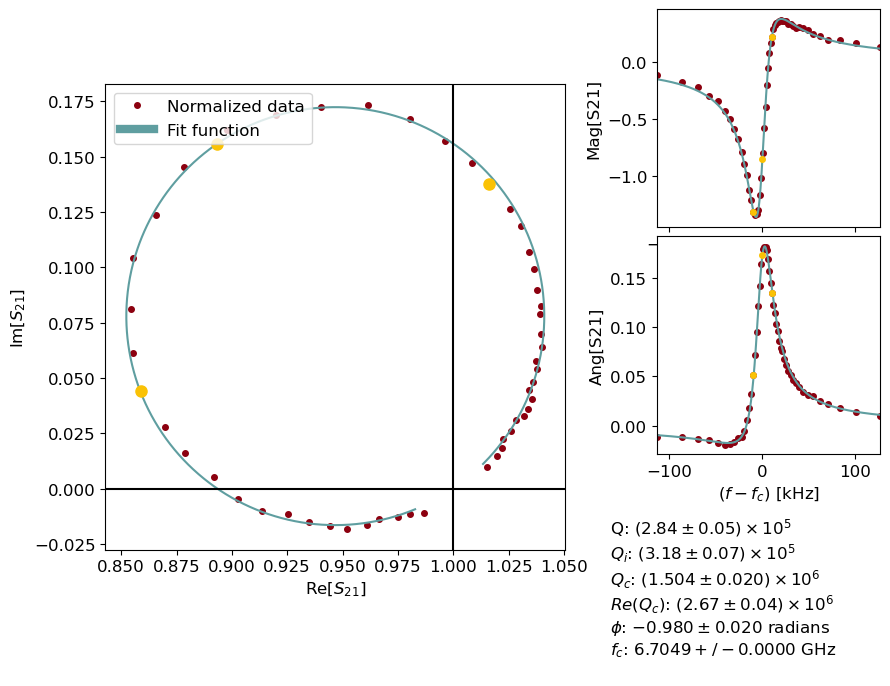

28.45


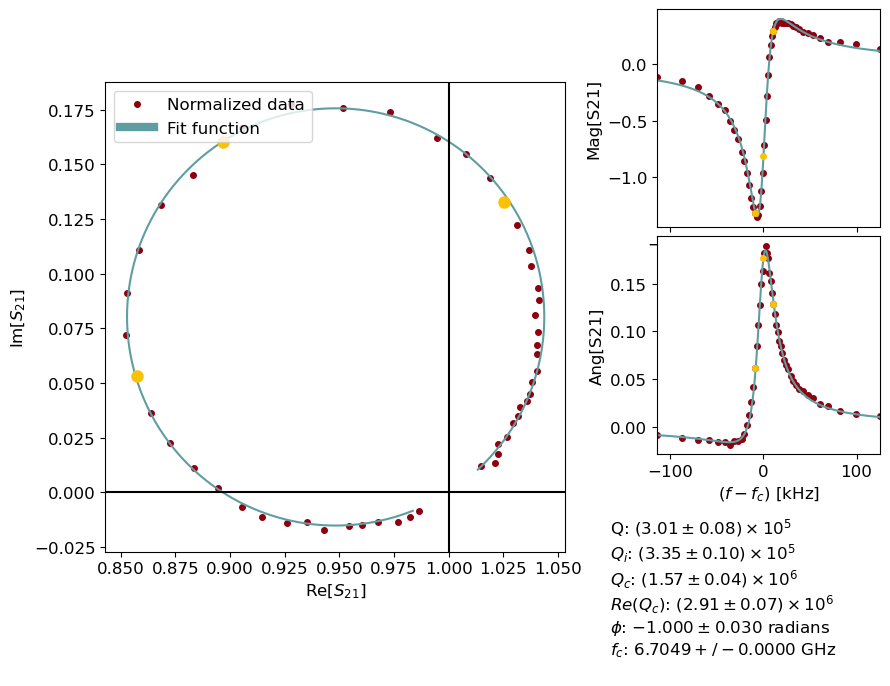

28.45


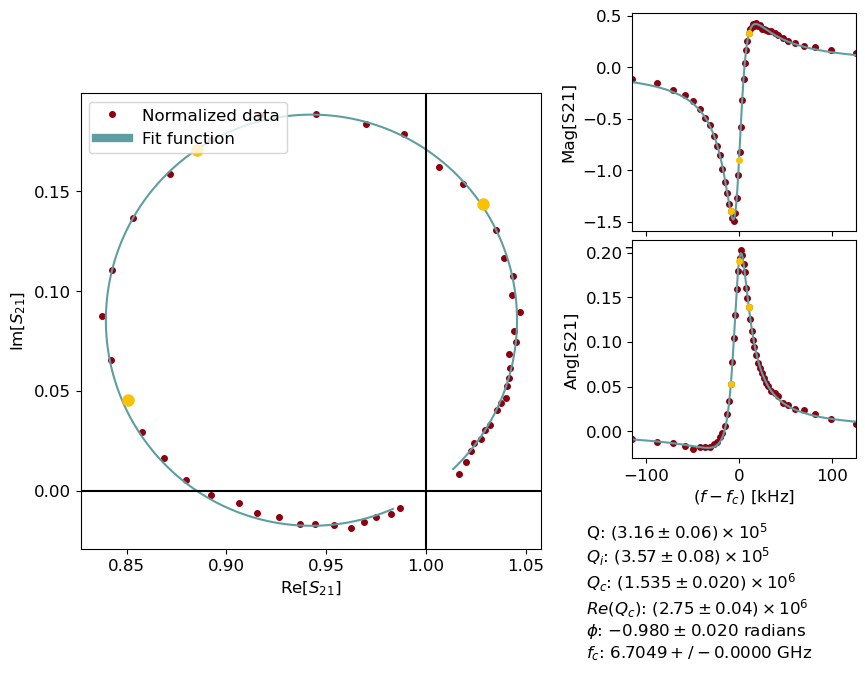

28.45


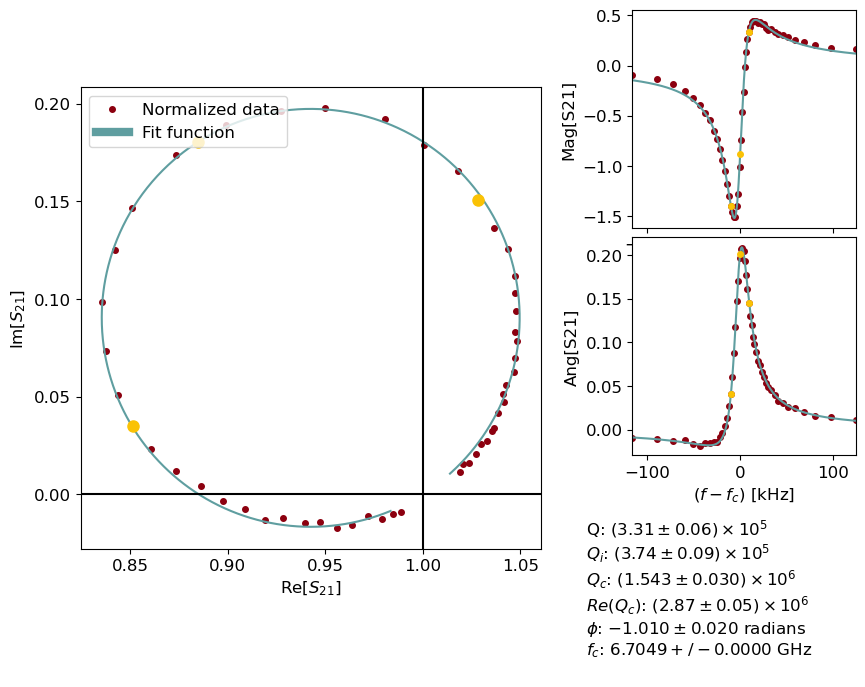

28.45


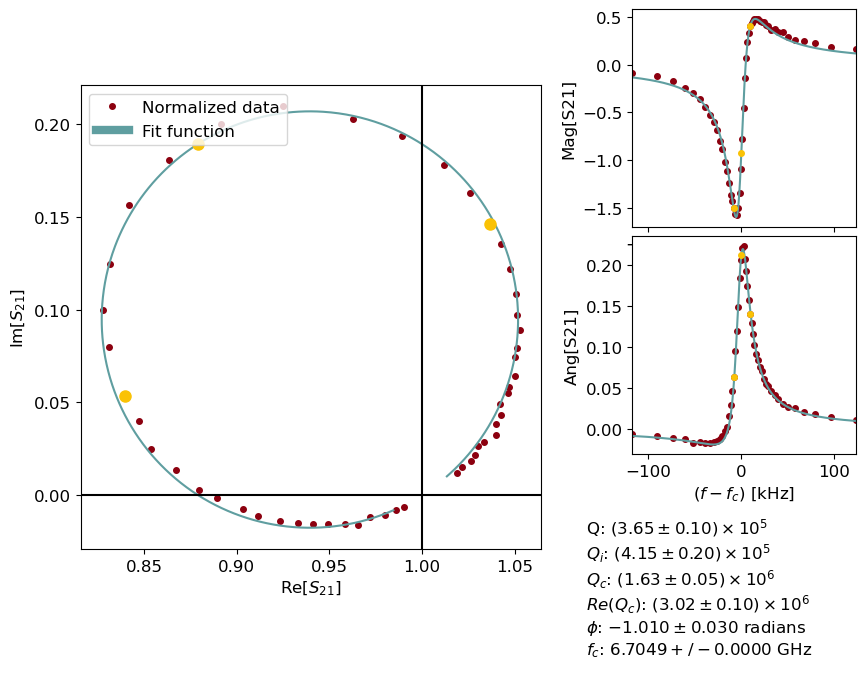

28.45


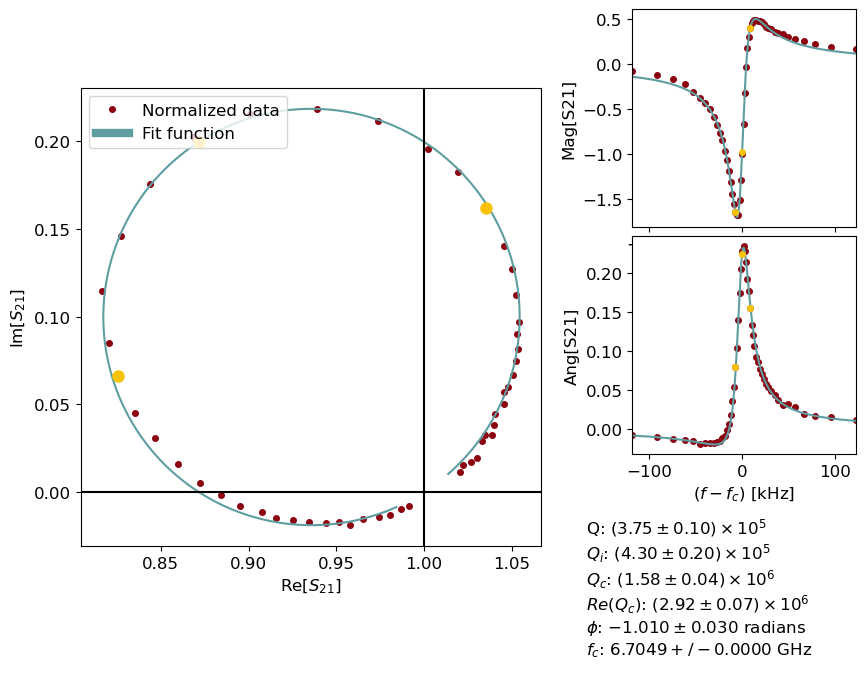

28.45


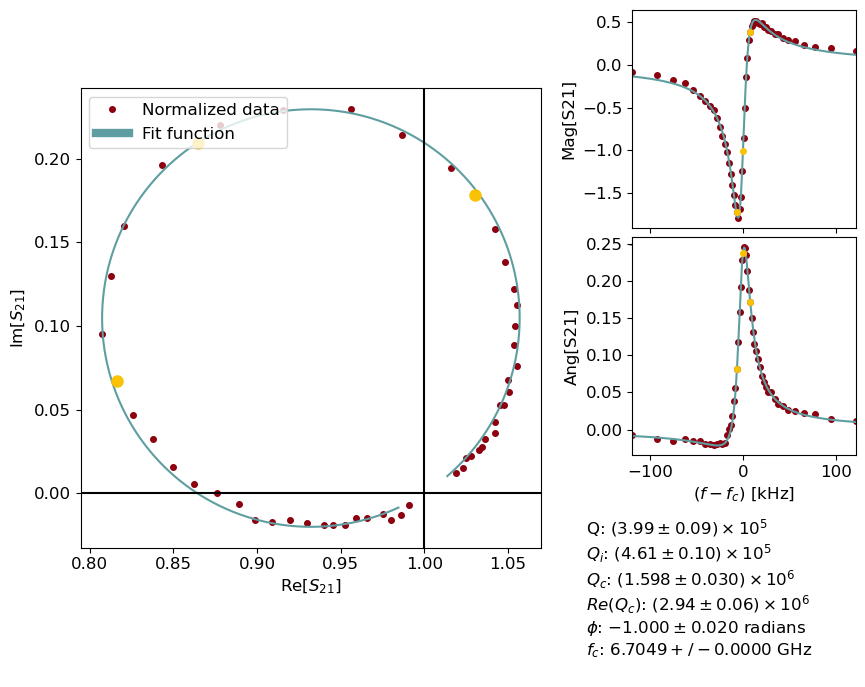

28.45


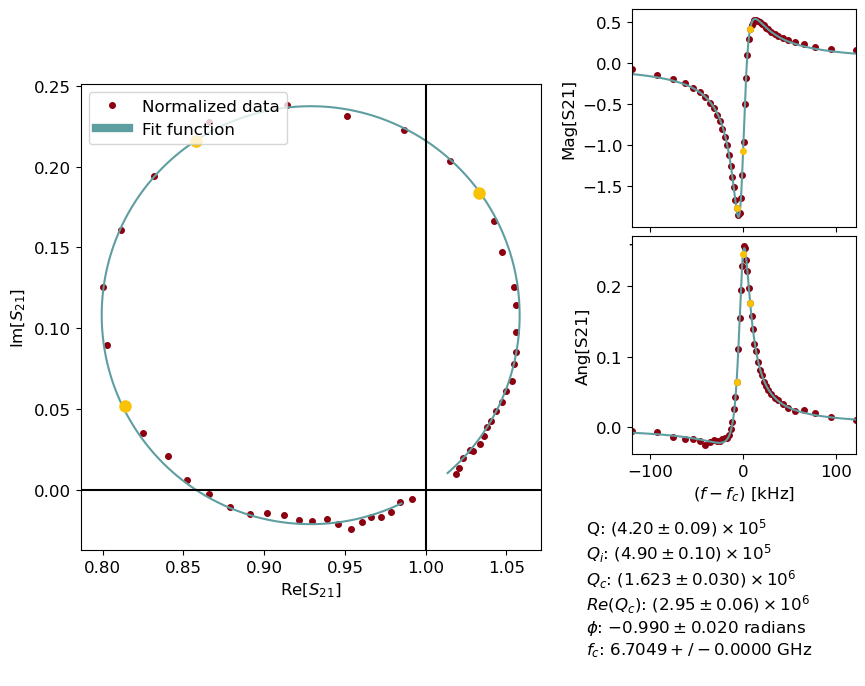

28.45


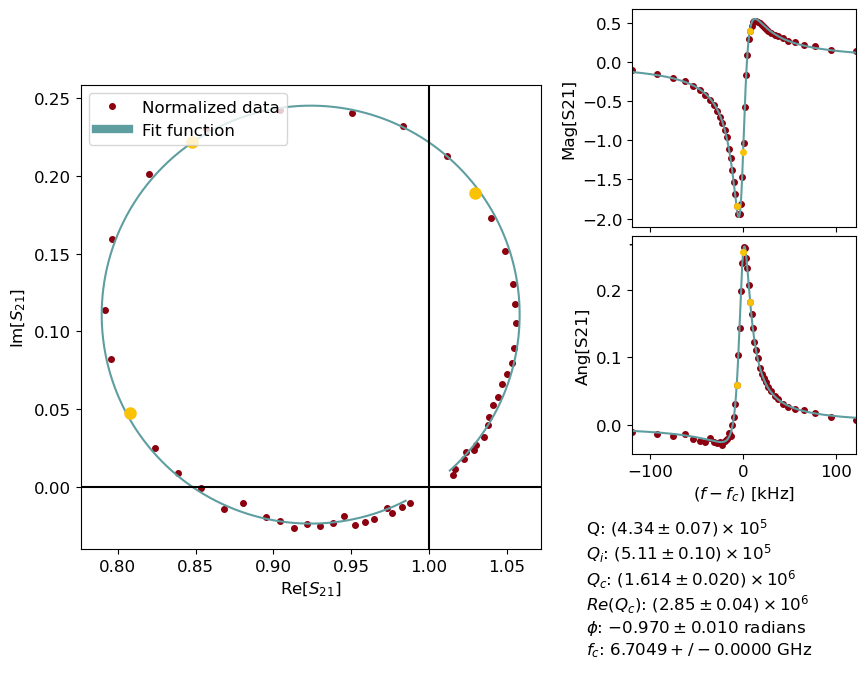

28.45


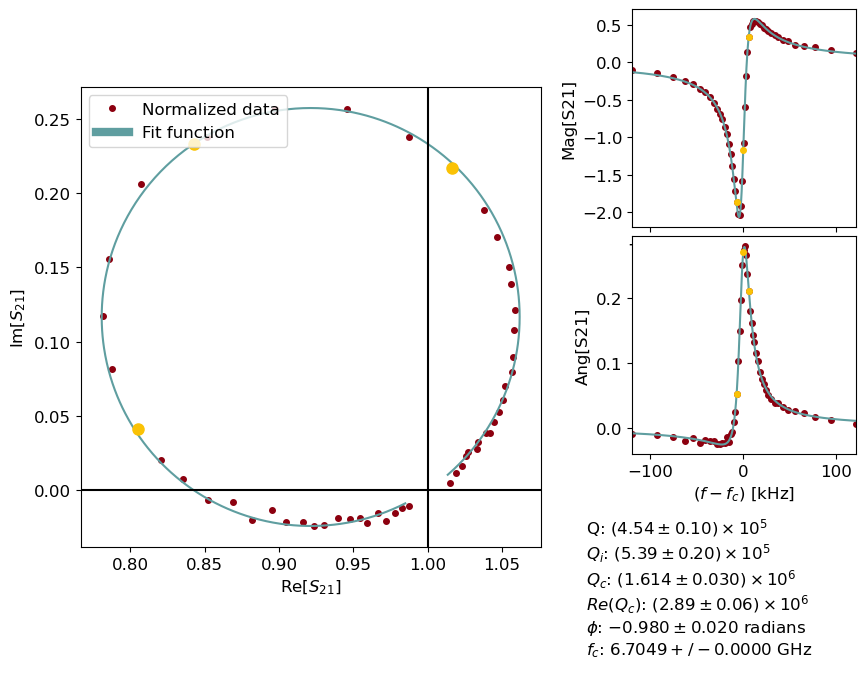

Time elapsed:  62.488208055496216
['res_7064_33', 'res_7064_30', 'res_7064_27', 'res_7064_24', 'res_7064_21', 'res_7064_18', 'res_7064_15', 'res_7064_12', 'res_7064_9', 'res_7064_6', 'res_7064_3', 'res_7064_0']
28.45


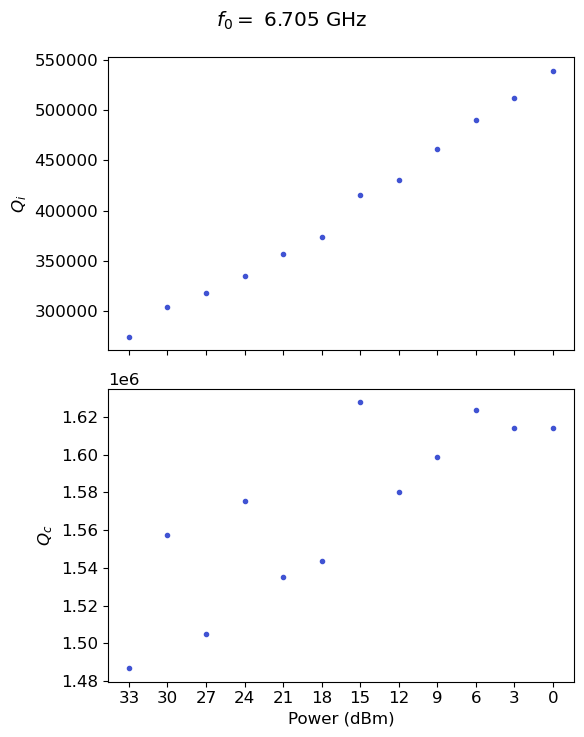

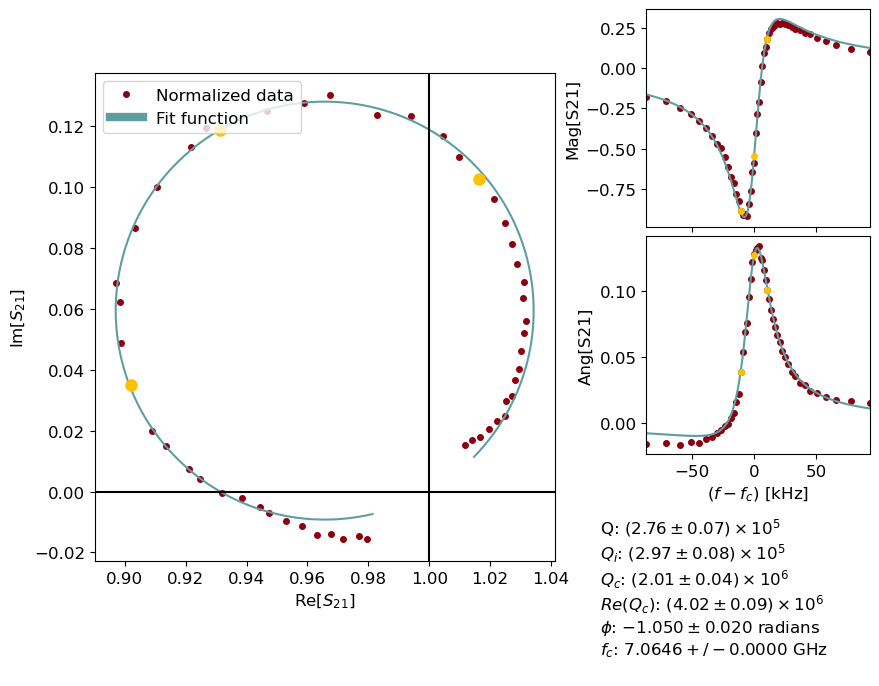

28.45


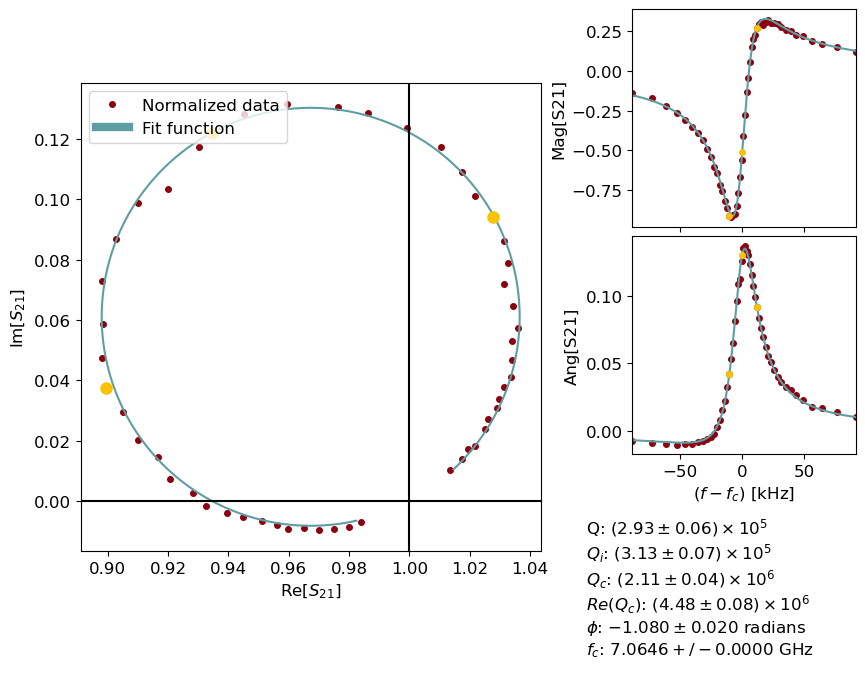

28.45


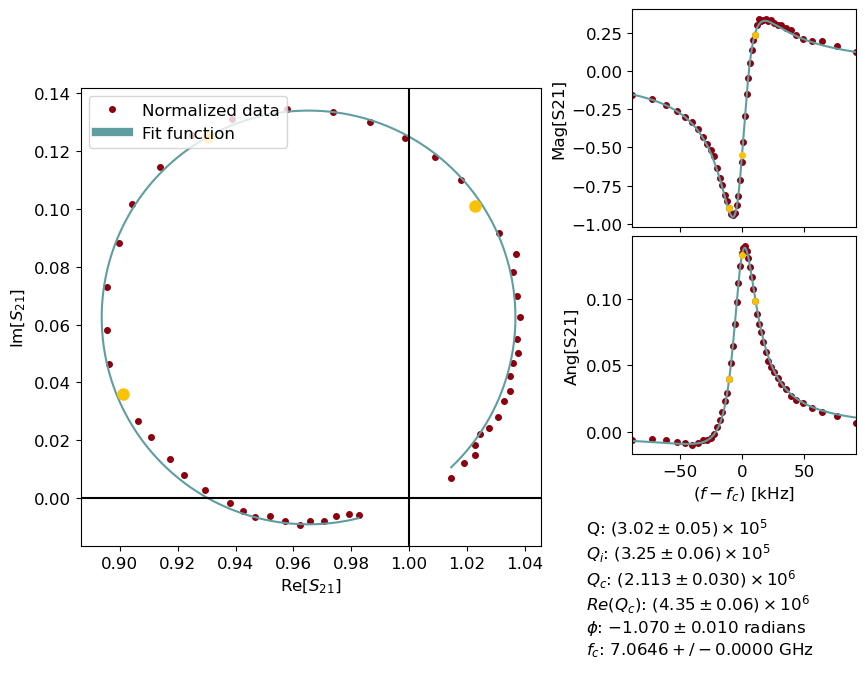

28.45


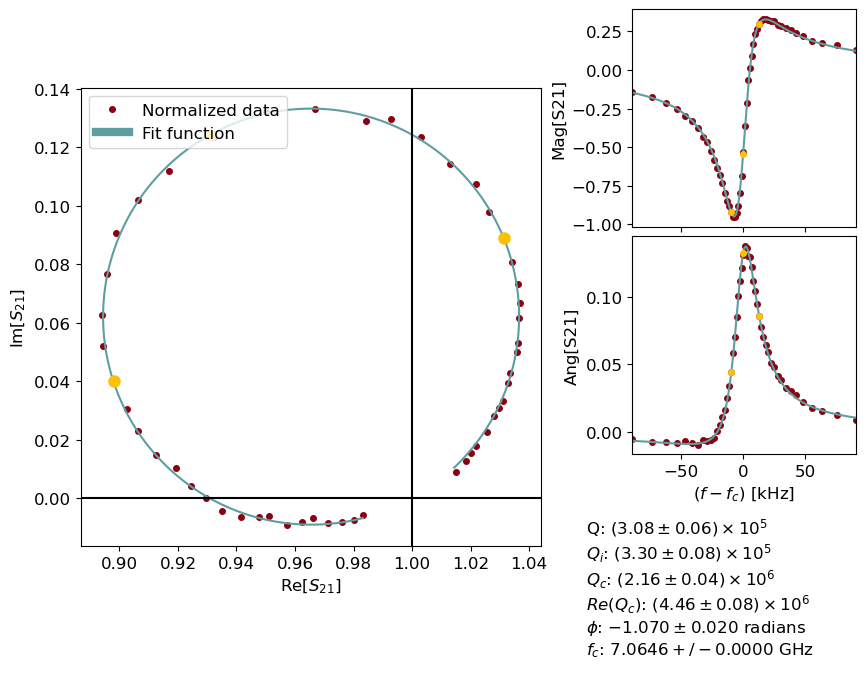

28.45


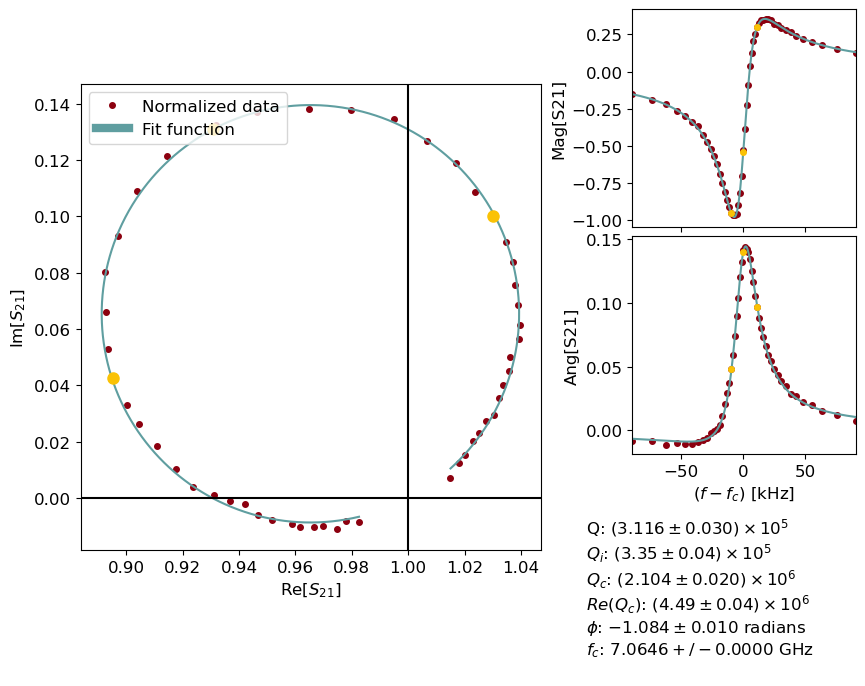

28.45


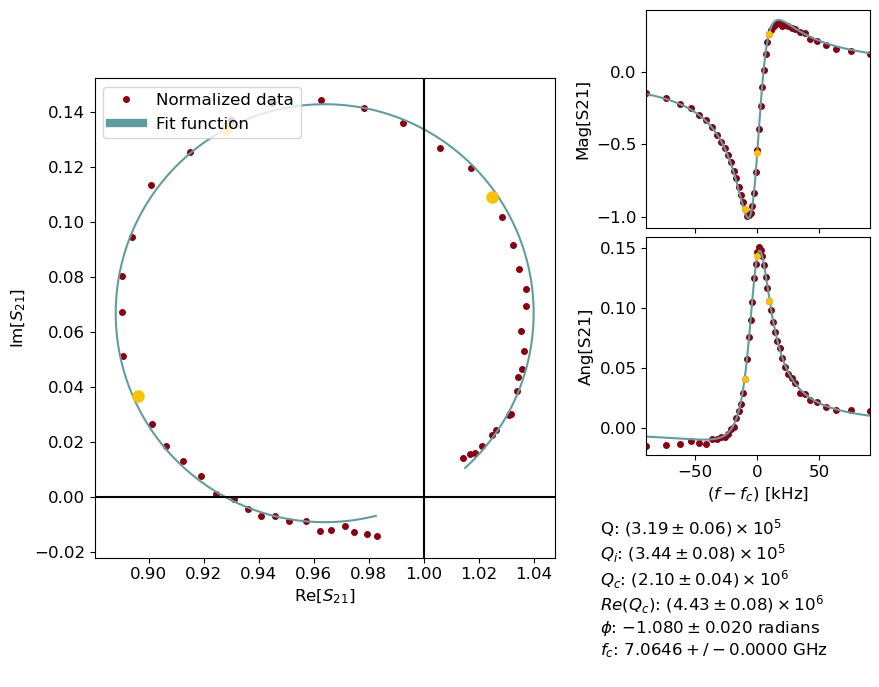

28.45


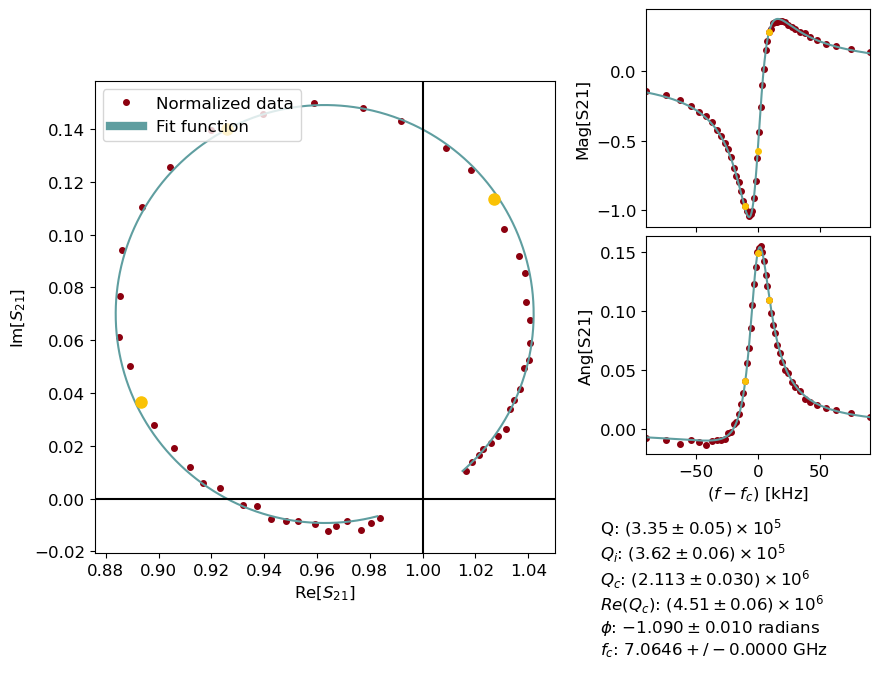

28.45


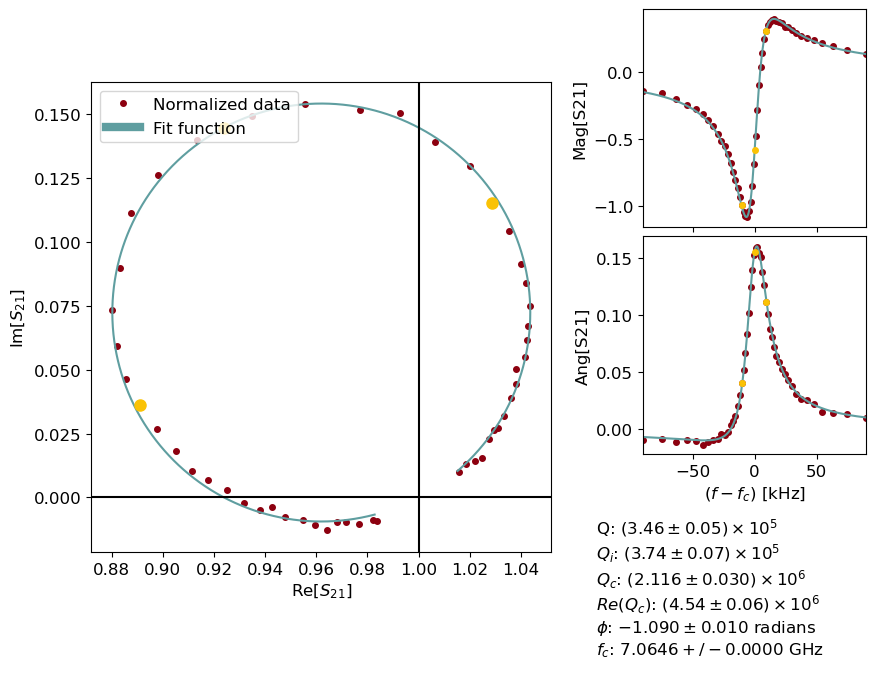

28.45


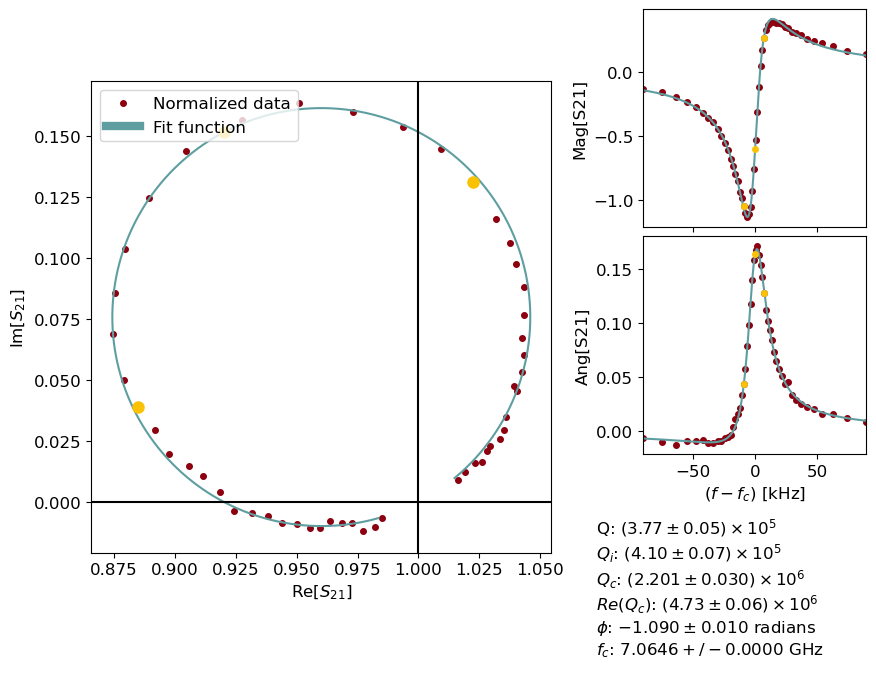

28.45


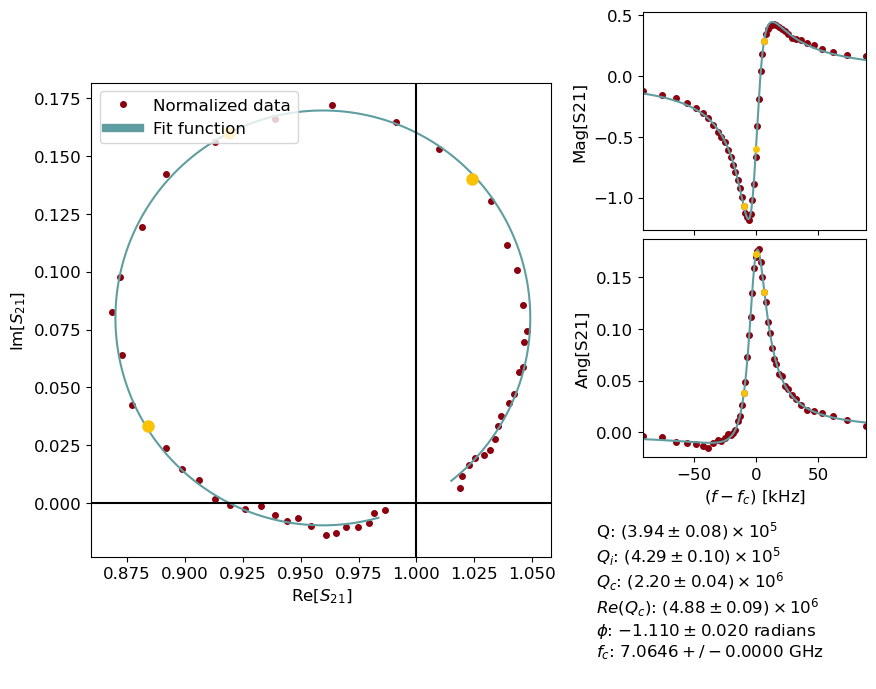

28.45


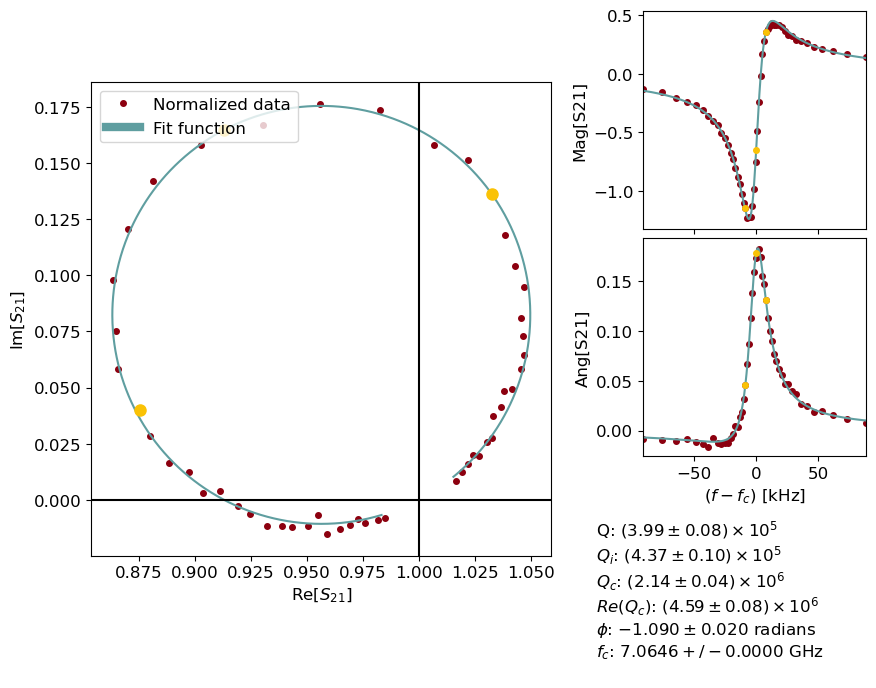

28.45


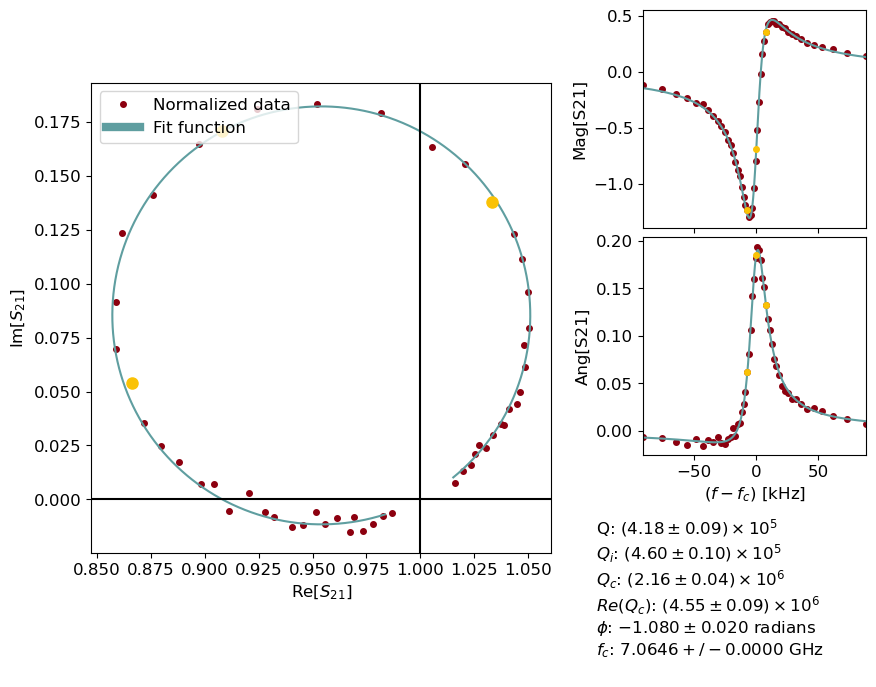

Time elapsed:  73.76556611061096
['res_7390_33', 'res_7390_30', 'res_7390_27', 'res_7390_24', 'res_7390_21', 'res_7390_18', 'res_7390_15', 'res_7390_12', 'res_7390_9', 'res_7390_6', 'res_7390_3', 'res_7390_0']
28.45


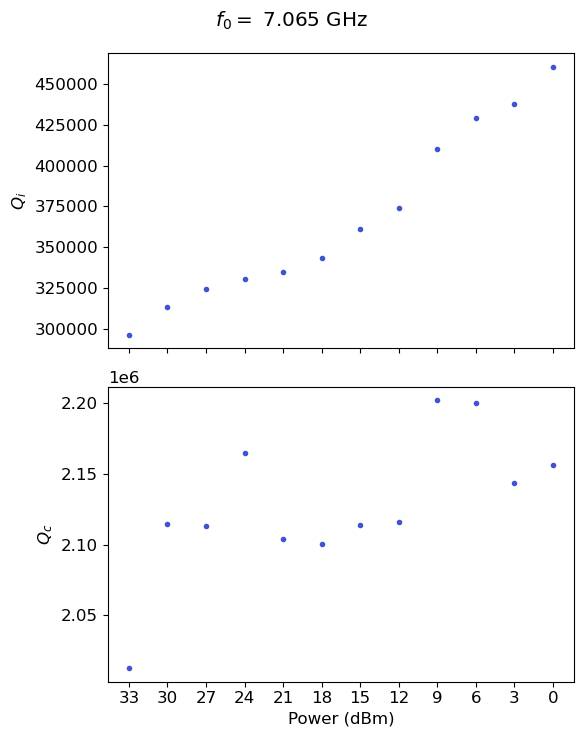

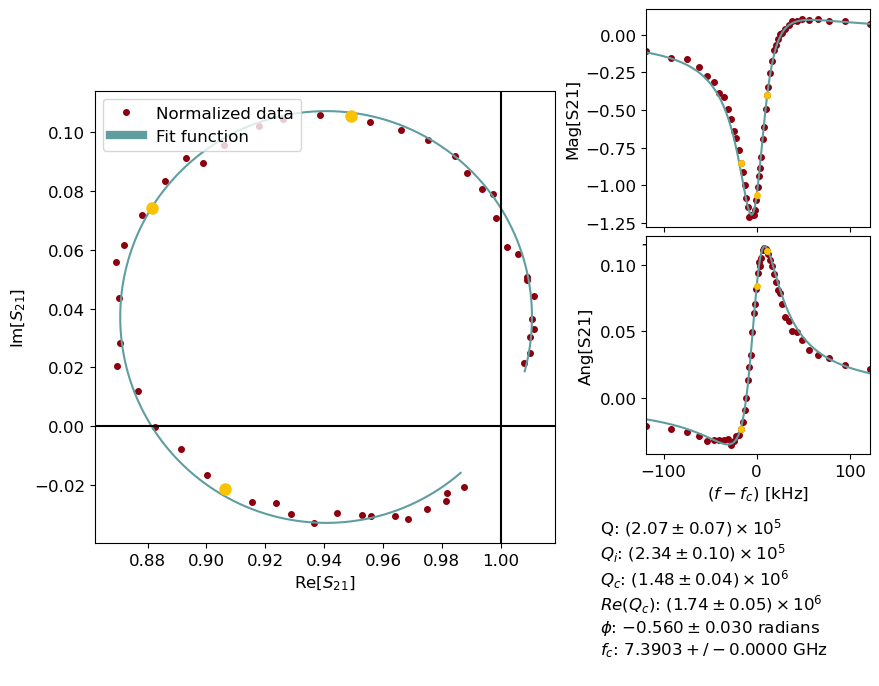

28.45


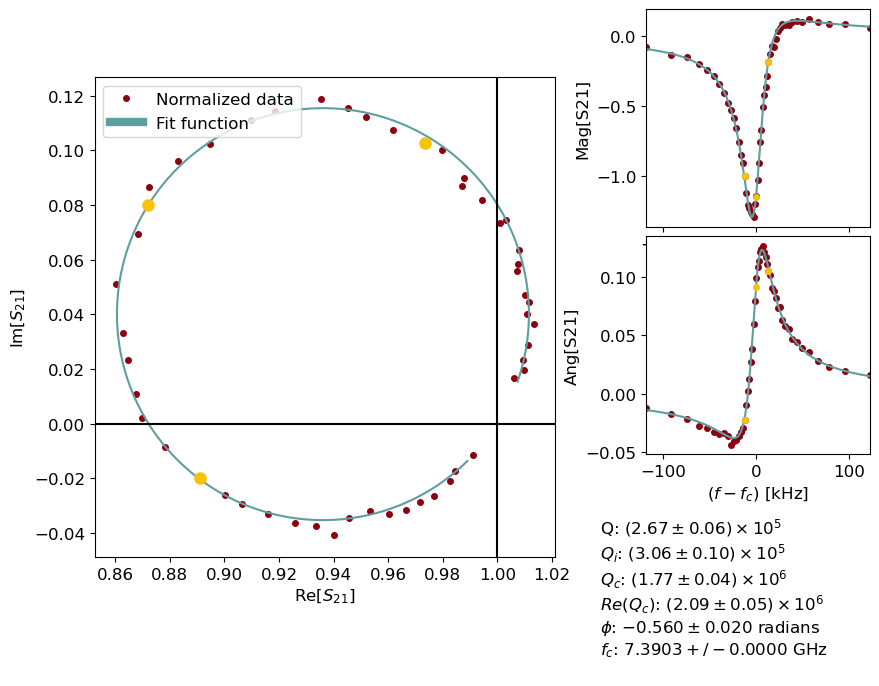

28.45


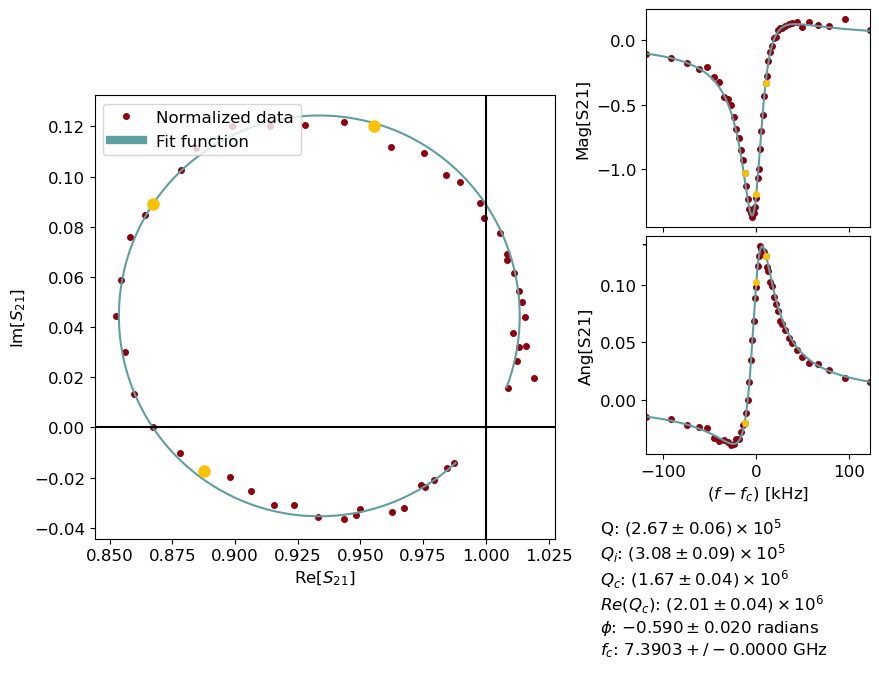

28.45


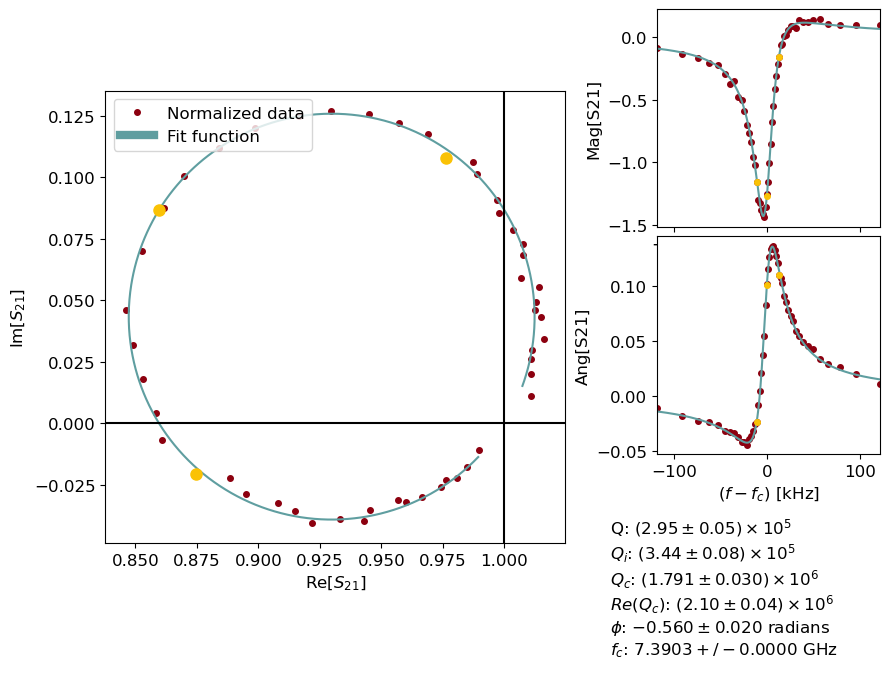

28.45


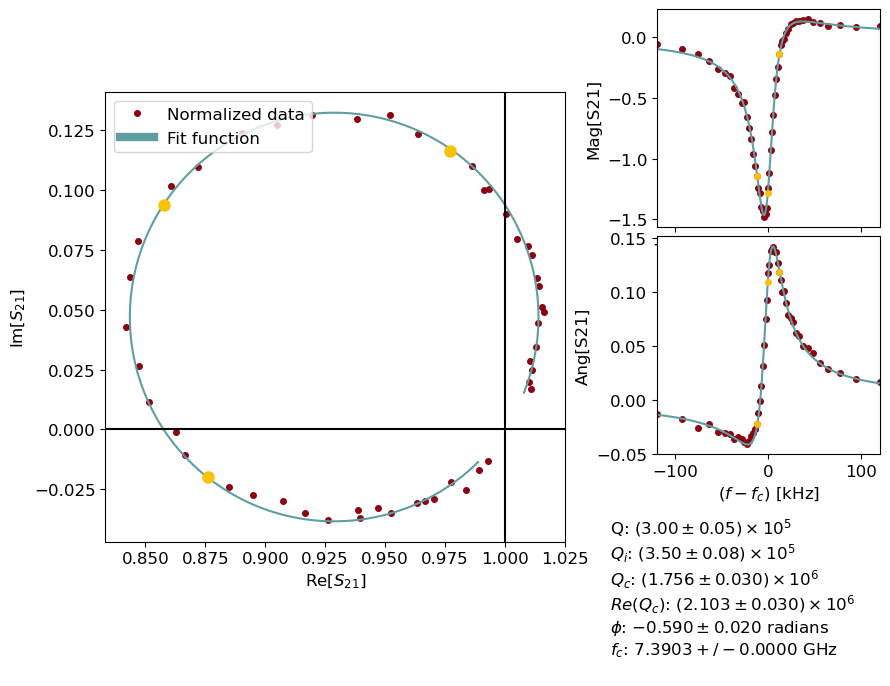

28.45


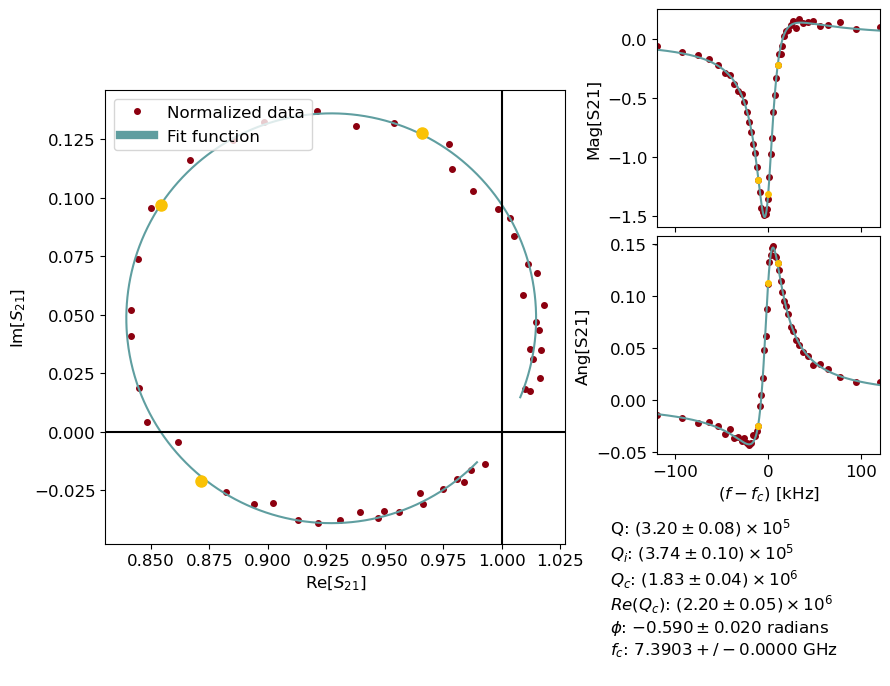

28.45


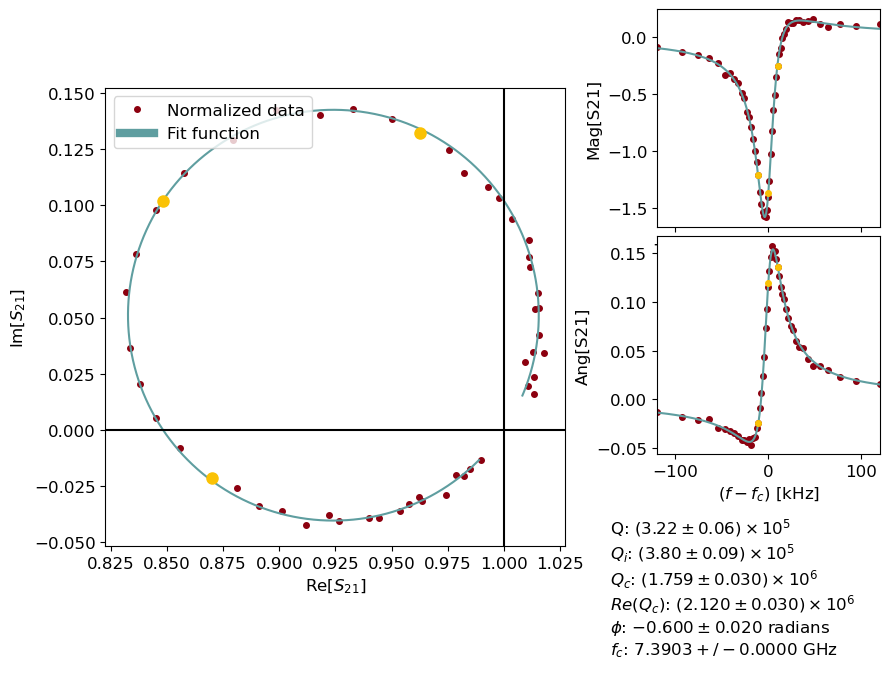

28.45


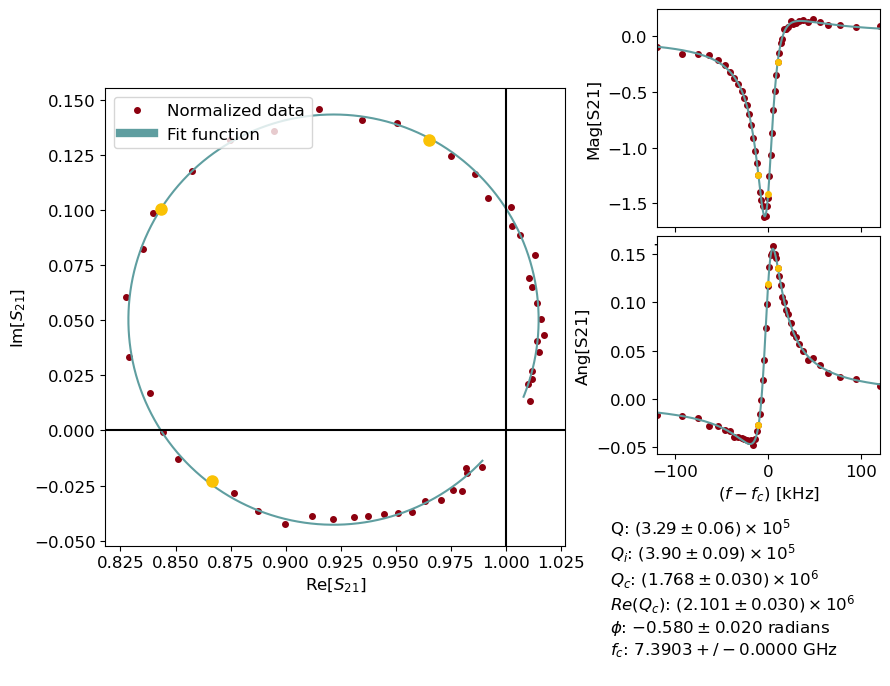

28.45


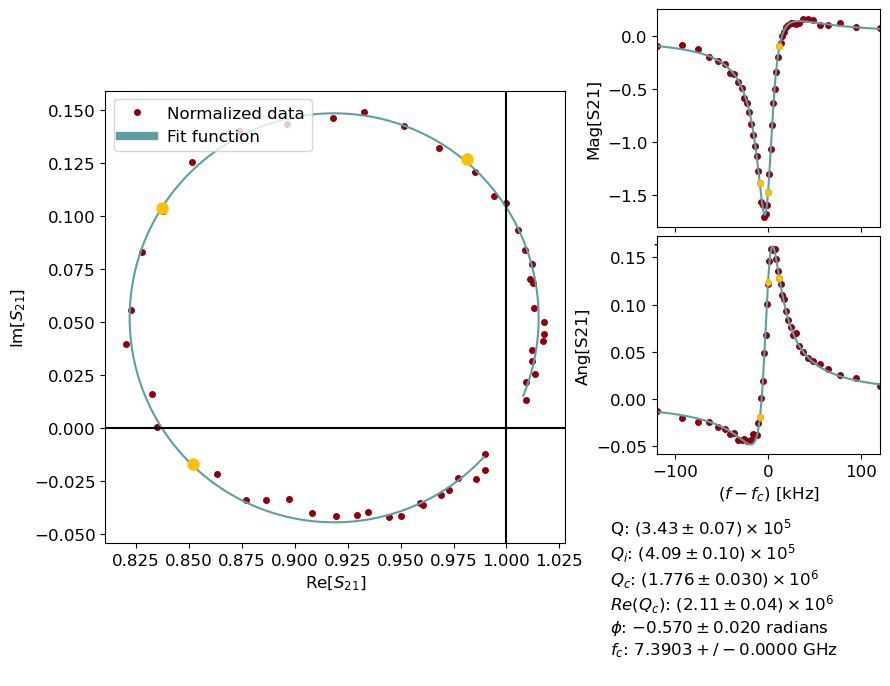

28.45


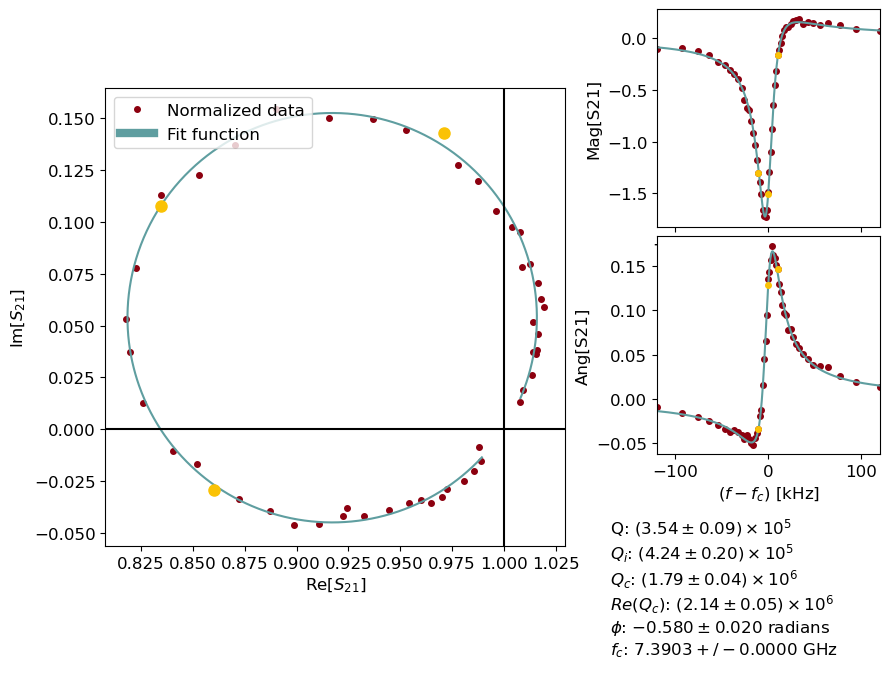

28.45


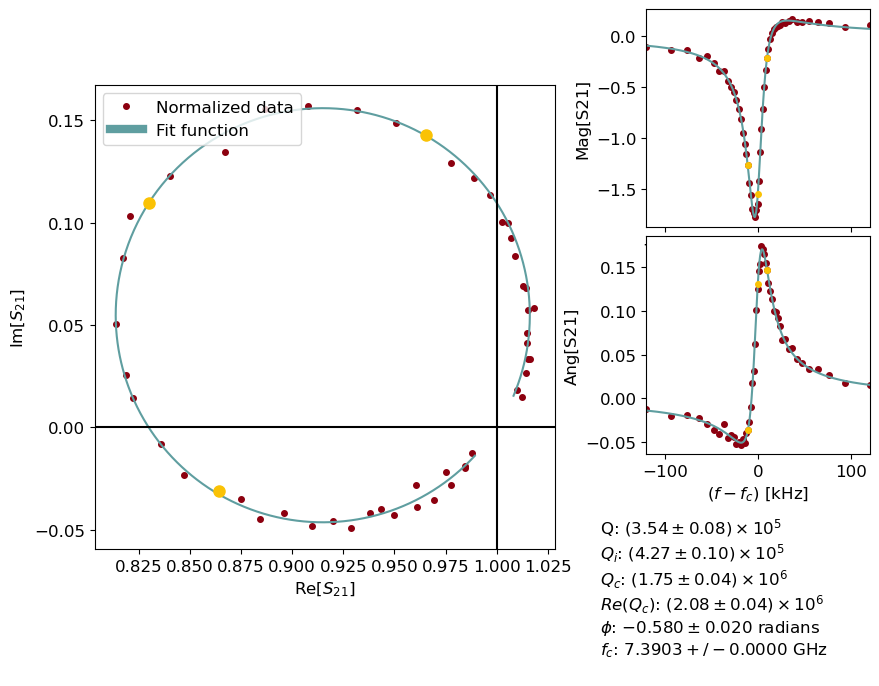

28.45


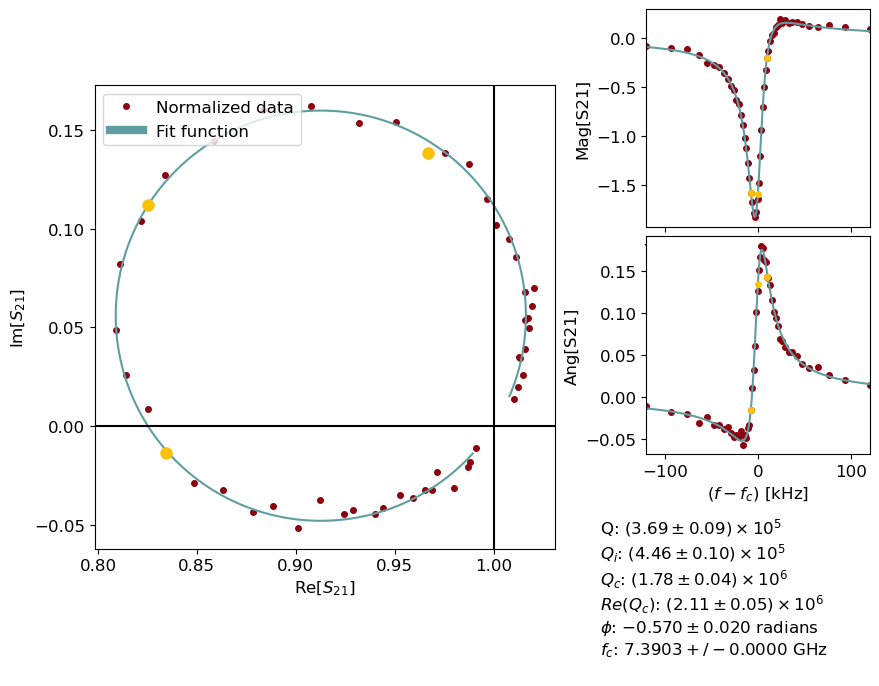

Time elapsed:  84.73133182525635


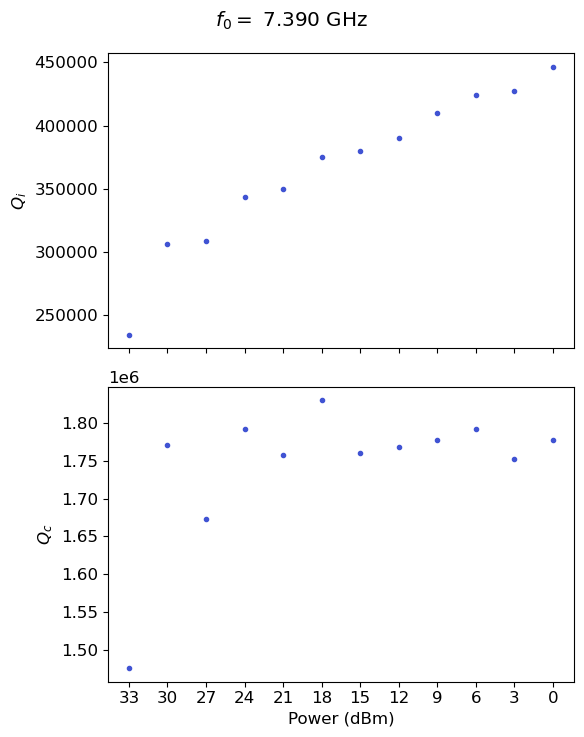

In [13]:
nfiles=1
meas_type='vna'
if params['res_name']=='240725':
    directories = ['power_sweep7']
    res_params = ana_res.analyze_sweep_double(directories, data_pth)
    nfiles = 2
elif params['res_name']=='240719':
    params['min_power']=-85
    directories = ['sample1_power_sweep_2']
    res_param = ana_res.analyze_sweep(directories, data_pth)
    nfiles = 1
elif params['res_name']=='240729':
    directories = ['power_sweep2']
    params['max_power'] = -30
    res_params = ana_res.analyze_sweep_double(directories, data_pth,img_pth=img_pth+'Images/')    
    nfiles = 2
elif params['res_name']=='240729-2':
    directories = ['power_sweep5']
    # there is an issue with power sweep 5 for the 6 um data 
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, img_pth=img_pth+'Images/',name=params['res_name'], plot=False)
elif params['res_name']=='240729-3':
    directories = ['power_sweep4']
    # there is an issue with power sweep 5 for the 6 um data 
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, img_pth=img_pth+'Images/',name=params['res_name'], plot=True)
elif params['res_name']=='240814-2':
    directories = ['powersweep7']
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, img_pth=img_pth+'Images/', name=params['res_name'], plot=False)
    #res_params = ana_res.analyze_sweep(directories, pth, name=params['res_name'], plot=True)
elif params['res_name']=='240729-5':
    meas_type='soc'
    #slope = 23.45293930972242
    slope = 23.9
    directories=['powersweep0']
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, name='rfsoc', img_pth=img_pth+'Images/', plot=True, type=meas_type, slope=slope)
elif params['res_name']=='240729-6':
    meas_type='soc'
    #slope = 23.45293930972242
    slope = 23.9
    directories=['powersweep3']
    res_params = ana_res.analyze_sweep_triple(directories, data_pth, name='rfsoc', img_pth=img_pth+'Images/', plot=True, type=meas_type, slope=slope)
elif params['res_name']=='silicon-scalinq-1':
    directories=['powersweep3']
    nfiles =3
    res_params = ana_res.analyze_sweep_gen(directories, data_pth, name=params['res_name'], img_pth=img_pth, plot=True, nfiles=nfiles)
elif params['res_name']=='silicon-mux':
    meas_type='soc'
    directories=['powersweep7']
    nfiles =1

    res_params = analyze_sweep_mux(directories, data_pth,img_pth, name=params['res_name'], plot=True, slope=28.45) # slope=28.45)
else:
    print('Sample not found')

Counter({5521: 12, 5824: 12, 6094: 12, 6371: 12, 6379: 12, 6704: 12, 7064: 12, 7390: 12})
0
28.76759064230772
dict_keys(['amps', 'phases', 'xpts', 'freqs'])
[-158819.5154 -158819.5319 -158819.5271 -158819.528  -158819.5239
 -158819.5154 -158819.5099 -158819.5047 -158819.4923 -158819.4809
 -158819.4714 -158819.4646 -158819.4592 -158819.451  -158819.4424
 -158819.4385 -158819.4291 -158819.4319 -158819.4317 -158819.4405
 -158819.4681 -158819.4945 -158819.5241 -158819.5755 -158819.6362
 -158819.6965 -158819.76   -158819.8138 -158819.8556 -158819.8807
 -158819.8872 -158819.8932 -158819.8917 -158819.8876 -158819.8743
 -158819.8531 -158819.8369 -158819.8265 -158819.8066 -158819.7914
 -158819.7731 -158819.7548 -158819.7453 -158819.7292 -158819.721
 -158819.7043 -158819.7004 -158819.6906 -158819.6918 -158819.7109]
res_5521_30
[[ 1.0104 -2.7399 -1.5437 -0.8504 -0.3891 -0.0546  0.1964  0.3945  0.5635
   0.7054  0.826   0.9292  1.0196  1.104   1.1815  1.2485  1.3164  1.3684
   1.4201  1.4606  1.48

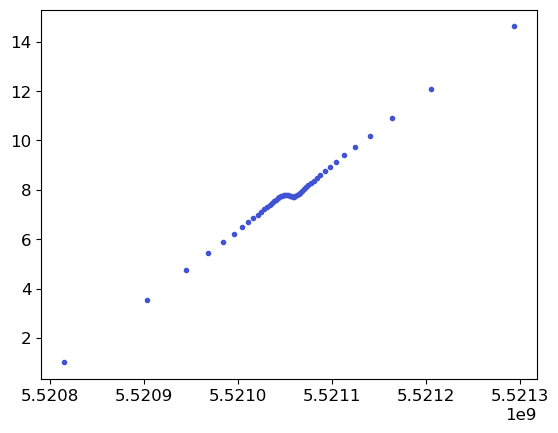

In [9]:
resonators, file_list = ana_res.get_resonators('powersweep7',data_pth,  r'res_(\d+)')
print(file_list[2][9:])
pth = data_pth + directories[0]
index = 80
data, attrs = ana_res.grab_data(pth, file_list[index], meas_type='soc', slope=50)
data_, attrs_ = hy.prev_data(pth, file_list[index])
print(data.keys())
print(data['phases'])
print(file_list[index])
print(data_['phases'])
#plt.plot(data['freqs'], np.unwrap(data_['phases'][0] - 28.5 * data_['xpts'][0]),'.')
plt.plot(data['freqs'], np.unwrap(data_['phases'][0]) , '.')
# get the slope correction
print(np.unwrap(data_['phases'][0]))
slope_ = (np.unwrap(data_['phases'][0])[5] - np.unwrap(data_['phases'][0])[0]) / (data_['xpts'][0][5] - data_['xpts'][0][0]) 
print(slope_)

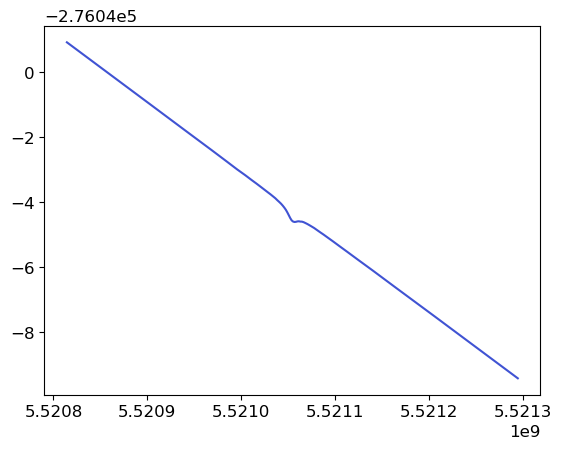

In [7]:
plt.plot(data['freqs'], np.unwrap(data['phases']))

In [29]:
# get average frequency
np.set_printoptions(precision=10)
freq_list = np.zeros(8)
for i in range(8):
    freq_list[i] = np.average(res_params[i]['freqs'][0])
print(freq_list)

[5.5210526802e+09 5.8244664974e+09 6.0943083645e+09 6.3711640935e+09
 6.3794885060e+09 6.7049479947e+09 7.0645955763e+09 7.3903033189e+09]


In [6]:
import scresonators.fit_resonator.fit as scfit
def plot_all(directories, pth_base,  output_path, name='res',min_power=-120, max_power =-25, norm=False,nfiles=3, meas_type='vna', slope=0):
    if nfiles==3:
        if meas_type=='vna': 
            pattern_end = 'dbm_'
            ends = ['wide1', 'narrow', 'wide2']
        else:
            pattern_end = '_'
            ends = ['wideleft', 'narrow','wideright']
        pattern0 = r'res_(\d+)_\d{2,5}' + pattern_end + ends[0]
    elif nfiles==2:
        pattern0 = r'res_(\d+)_\d{2,3}dbm_wide'
    else:
        pattern0 = r'res_(\d+)'

    # Initialize dict by getting list of resonators, creating dict with len = n resonators
    resonators, file_list = ana_res.get_resonators(directories[0],pth_base, pattern0)
    nres = len(resonators)
    
    sns.set_palette('coolwarm', n_colors=int(np.ceil(len(file_list)/nres)))
    fig, ax = plt.subplots(2,4, figsize=(10, 7))
    fig2, ax2 = plt.subplots(2,4, figsize=(10, 7))
    ax=ax.flatten(); ax2=ax2.flatten()

    # Each directory is a temperature 
    for i in range(len(directories)):         
        
        resonators, file_list0 = ana_res.get_resonators(directories[i], pth_base, pattern0)
        pth = pth_base + directories[i]
        for j in range(len(resonators)): 
            # Grab all the files for a given resonator, then sort by power. 
            if nfiles ==3:                
                pattern = 'res_{:d}_'.format(resonators[j]) + '(\d{2,5})'+pattern_end+ends[0]
            elif nfiles==2: 
                pattern = 'res_{:d}_'.format(resonators[j]) + '(\d{2,3})dbm_wide'
            else:
                pattern = 'res_{:d}_'.format(resonators[j]) + r'(\d+)'
            file_list = ana_res.get_resonator_power_list(pattern, file_list0)
 
            for k in range(len(file_list)):                
                # try: 
                if nfiles==3:
                    data1, attrs = ana_res.grab_data(pth, file_list[k], meas_type, slope)
                    file2 = file_list[k].replace(ends[0], ends[1])
                    data2, _ = ana_res.grab_data(pth, file2, meas_type, slope)
                    data = ana_res.combine_data(data1, data2)
                    file3 = file_list[k].replace(ends[0], ends[2])                
                    data3, _ = ana_res.grab_data(pth, file3, meas_type, slope)
                    data = ana_res.combine_data(data, data3) 
                    #print('checked')
                elif nfiles==2: 
                    data1 = ana_res.grab_data(pth, file_list[k])
                    file2 = file_list[k].replace('wide', 'narrow')
                    data2 = ana_res.grab_data(pth, file2)
                    data = ana_res.combine_data(data1, data2)
                    #print('checked')
                else:
                    data, attrs = ana_res.grab_data(pth, file_list[k],  meas_type='soc', slope=slope)
                    #print('checked')
                # except:
                #     continue
                if meas_type=='vna' :
                    if data1['vna_power'][0]>max_power or data1['vna_power'][0]<min_power: 
                        continue
                #print(np.max(data1['freqs'])-np.min(data2['freqs']))
                #print(np.max(data2['freqs'])-np.min(data3['freqs']))
                
                if norm: 
                    x = 10**(data['amps']/20)*np.cos(data['phases'])
                    y = 10**(data['amps']/20)*np.sin(data['phases'])
                    #z = scfit.preprocess_linear(x, y, normalize=5, output_path='hi', plot_extra=False)
                    z = scfit.preprocess_circle(data['freqs'], x+1j*y, output_path='hi', plot_extra=False)
                    ax[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, np.log10(np.abs(z)) * 20, linewidth=1)
                    ax2[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, np.angle(z), linewidth=1)
                else:
                    ax[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, data['amps'], linewidth=1)
                    ax2[j].plot((data['freqs']-np.mean(data['freqs']))/1e3, data['phases'], linewidth=1)

            #print(np.max(data1['freqs'])-np.min(data1['freqs']))
            #print(np.min(data2['freqs'])-np.min(data1['freqs']), np.max(data1['freqs'])-np.min(data2['freqs']))
            #print(np.min(data3['freqs'])-np.min(data2['freqs']), np.max(data2['freqs'])-np.min(data3['freqs']))
            fig.tight_layout()
            fig2.tight_layout()
            fig2.savefig(output_path +name+'_' + directories[i] + '_all_data_phase.png', dpi=300)                 
            fig.savefig(output_path +name+'_' + directories[i] + '_all_data_amp.png', dpi=300)    

Counter({5521: 14, 5824: 14, 6094: 14, 6371: 14, 6379: 14, 6704: 14, 7064: 14, 7390: 14})


Counter({5521: 14, 5824: 14, 6094: 14, 6371: 14, 6379: 14, 6704: 14, 7064: 14, 7390: 14})
['res_5521_39', 'res_5521_36', 'res_5521_33', 'res_5521_30', 'res_5521_27', 'res_5521_24', 'res_5521_21', 'res_5521_18', 'res_5521_15', 'res_5521_12', 'res_5521_9', 'res_5521_6', 'res_5521_3', 'res_5521_0']
['res_5824_39', 'res_5824_36', 'res_5824_33', 'res_5824_30', 'res_5824_27', 'res_5824_24', 'res_5824_21', 'res_5824_18', 'res_5824_15', 'res_5824_12', 'res_5824_9', 'res_5824_6', 'res_5824_3', 'res_5824_0']
['res_6094_39', 'res_6094_36', 'res_6094_33', 'res_6094_30', 'res_6094_27', 'res_6094_24', 'res_6094_21', 'res_6094_18', 'res_6094_15', 'res_6094_12', 'res_6094_9', 'res_6094_6', 'res_6094_3', 'res_6094_0']


['res_6371_39', 'res_6371_36', 'res_6371_33', 'res_6371_30', 'res_6371_27', 'res_6371_24', 'res_6371_21', 'res_6371_18', 'res_6371_15', 'res_6371_12', 'res_6371_9', 'res_6371_6', 'res_6371_3', 'res_6371_0']
['res_6379_39', 'res_6379_36', 'res_6379_33', 'res_6379_30', 'res_6379_27', 'res_6379_24', 'res_6379_21', 'res_6379_18', 'res_6379_15', 'res_6379_12', 'res_6379_9', 'res_6379_6', 'res_6379_3', 'res_6379_0']
['res_6704_39', 'res_6704_36', 'res_6704_33', 'res_6704_30', 'res_6704_27', 'res_6704_24', 'res_6704_21', 'res_6704_18', 'res_6704_15', 'res_6704_12', 'res_6704_9', 'res_6704_6', 'res_6704_3', 'res_6704_0']
['res_7064_39', 'res_7064_36', 'res_7064_33', 'res_7064_30', 'res_7064_27', 'res_7064_24', 'res_7064_21', 'res_7064_18', 'res_7064_15', 'res_7064_12', 'res_7064_9', 'res_7064_6', 'res_7064_3', 'res_7064_0']
['res_7390_39', 'res_7390_36', 'res_7390_33', 'res_7390_30', 'res_7390_27', 'res_7390_24', 'res_7390_21', 'res_7390_18', 'res_7390_15', 'res_7390_12', 'res_7390_9', 'res_73

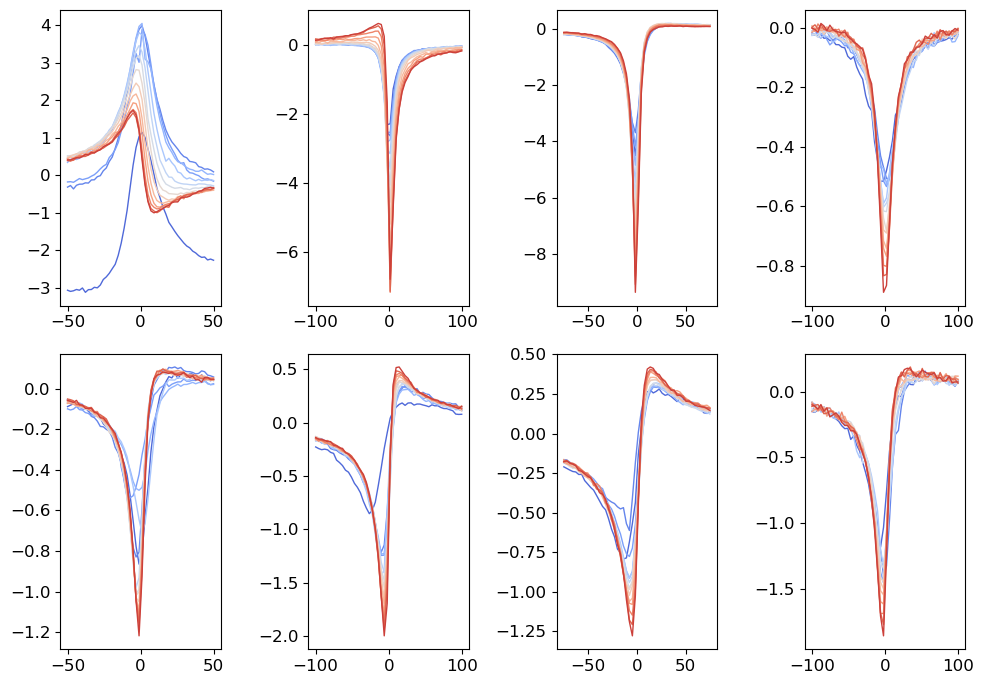

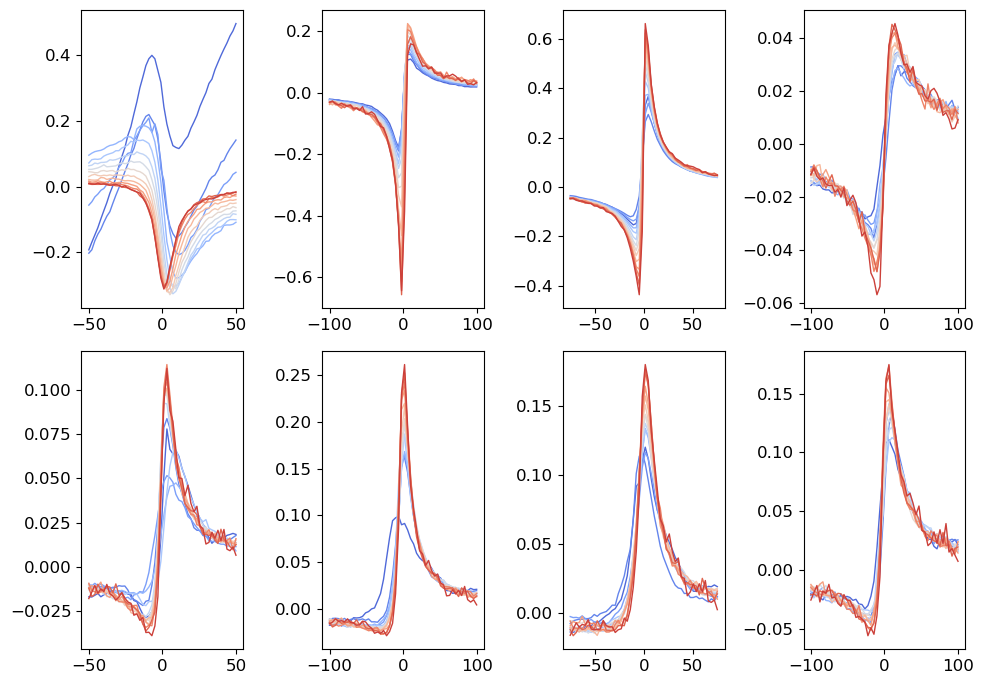

In [7]:
#slope = 0
#%matplotlib widget
plot_all(directories, data_pth, output_path=img_pth, max_power=-15, norm=True, nfiles=1, meas_type=meas_type, slope=28.5)

#### Reorder the data based on pitch (only run once)

In [8]:

# if meas_type=='soc':
#     res_params = ana_res.convert_power(res_params) 

params, res_params=ana_res.reorder(params, res_params) # only run once!
params['qc'] = np.array([np.nanmedian(res_params[i]['qc']) for i in range(len(res_params))])
params['qc_err'] = np.array([np.nanmedian(res_params[i]['qc_err']) for i in range(len(res_params))])
params['freqs'] = np.array([np.nanmedian(res_params[i]['freqs']) for i in range(len(res_params))])
params['phs'] = np.array([np.nanmedian(res_params[i]['phs']) for i in range(len(res_params))])

### Power sweep and TLS fits

UFuncTypeError: ufunc 'greater_equal' did not contain a loop with signature matching types (<class 'numpy.dtypes.StrDType'>, <class 'numpy.dtypes.Int32DType'>) -> <class 'numpy.dtypes.BoolDType'>

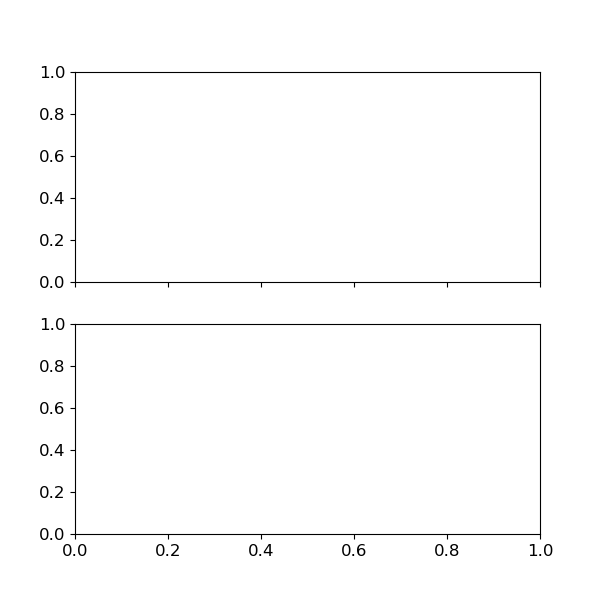

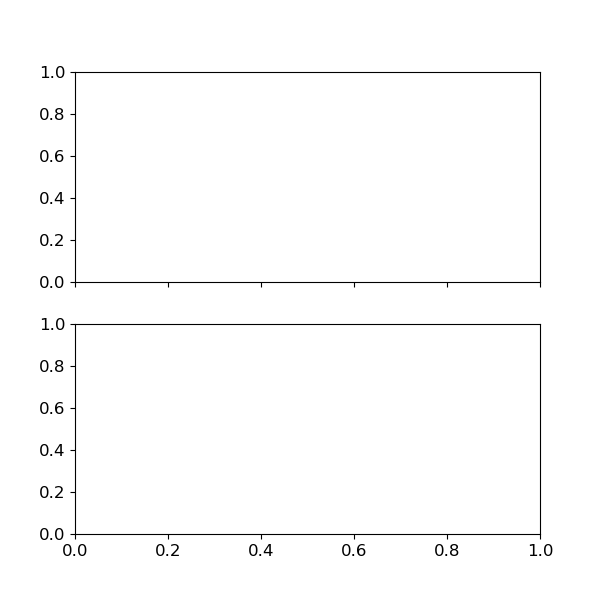

In [73]:
%matplotlib widget
ana_res.plot_power(res_params, params, img_pth, use_pitch=True)
cfg = ana_tls.fit_qi(res_params, params, img_pth) 
ana_tls.plot_res_pars([params], [''],img_pth)
ana_res.plot_res_pars([params], [''], img_pth)
hy.save_np(params, img_pth+'Text/' + params['res_name'] + '.yml')


In [ ]:

# soc_res_params = np.load(img_pth + 'other_files/soc_power_sweep.npy', allow_pickle=True)
# soc_res_params = np.load(img_pth + 'other_files/soc_power_sweep.npy', allow_pickle=True)
# np.save(img_pth + 'other_files/soc_power_sweep' , np.array(res_params))
#np.save(img_pth + 'other_files/vna_power_sweep' , np.array(res_params))
#print(np.array(res_params)[0]['qi'])

{'freqs': array([[6.7232e+09, 6.7232e+09, 6.7232e+09, 6.7232e+09, 6.7232e+09,
        6.7232e+09, 6.7232e+09, 6.7232e+09, 6.7232e+09, 6.7232e+09,
        6.7232e+09, 6.7232e+09, 6.7232e+09, 6.7232e+09, 6.7232e+09]]), 'phs': array([[0.174 , 0.1693, 0.1717, 0.1699, 0.1712, 0.172 , 0.1712, 0.1703,
        0.1726, 0.1708, 0.1729, 0.1741, 0.1808, 0.1934, 0.1838]]), 'q': array([[147055.4032, 147941.5565, 148838.9539, 149041.7508, 150260.2178,
        150926.4534, 151715.4653, 152463.875 , 153654.7951, 154439.0214,
        155352.7195, 156441.2176, 157773.3577, 159514.3399, 169813.7906]]), 'qi': array([[276823.5986, 279670.4825, 281731.7588, 283638.788 , 287028.9817,
        289505.5675, 292129.9073, 295336.2016, 298967.9204, 302227.0443,
        305199.1269, 308262.54  , 311012.4038, 312986.2545, 325806.39  ]]), 'qc': array([[308963.9625, 309602.9491, 310898.4796, 309553.9472, 310734.2364,
        310648.7306, 311026.5253, 310605.3764, 311431.8111, 311230.484 ,
        311693.8016, 312841.83

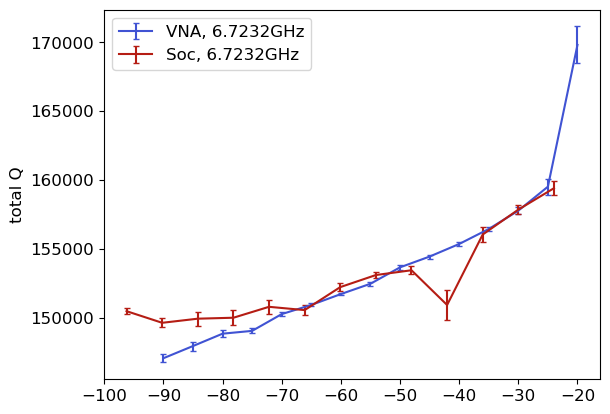

In [ ]:
# plot the vna and soc curves in the same plot
soc_res_params = np.load(img_pth + 'other_files/soc_power_sweep.npy', allow_pickle=True)
vna_res_params = np.load(img_pth + 'other_files/vna_power_sweep.npy', allow_pickle=True)

#print(vna_res_params)
print(vna_res_params[7])

%matplotlib inline
plt.errorbar(vna_res_params[7]['pow'][0], vna_res_params[7]['q'][0], yerr =  vna_res_params[7]['q_err'][0], capsize=2, label = 'VNA, 6.7232GHz')
plt.errorbar(soc_res_params[1]['pow'][0], soc_res_params[1]['q'][0], yerr =  soc_res_params[1]['q_err'][0], capsize=2, label = 'Soc, 6.7232GHz')
plt.ylabel('total Q')
plt.legend()
plt.show()

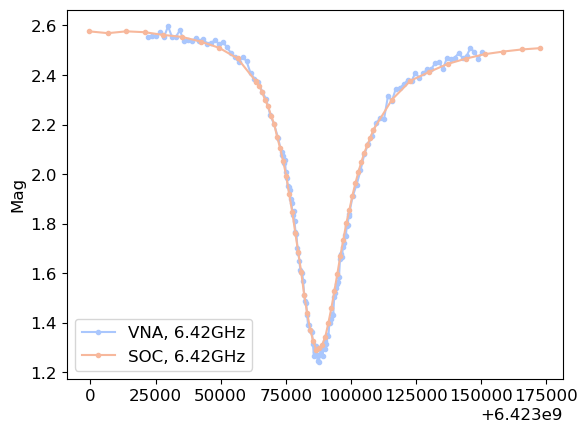

In [ ]:
# plot resonator data
vna_wide_1, _ = ana_res.grab_data('G:/My Drive/Projects/Materials/Data/240729/power_sweep4', fname = 'res_6423086_90dbm_wide1', meas_type='vna')
vna_wide_2, _ = ana_res.grab_data('G:/My Drive/Projects/Materials/Data/240729/power_sweep4', fname = 'res_6423086_90dbm_wide2', meas_type='vna')
vna_narrow, _ = ana_res.grab_data('G:/My Drive/Projects/Materials/Data/240729/power_sweep4', fname = 'res_6423086_90dbm_narrow', meas_type='vna')
vna_data = ana_res.combine_data( vna_narrow, ana_res.combine_data(vna_wide_1, vna_wide_2) )

slope_ = 23.9
soc_wide_1, _ =  ana_res.grab_data('G:/My Drive/Projects/Materials/Data/240818-Resonator/powersweep4', fname = 'res_6423_16_wideleft', meas_type='soc',slope = slope_)
soc_wide_2, _ =  ana_res.grab_data('G:/My Drive/Projects/Materials/Data/240818-Resonator/powersweep4', fname = 'res_6423_16_wideright', meas_type='soc',slope = slope_)
soc_narrow, _ =  ana_res.grab_data('G:/My Drive/Projects/Materials/Data/240818-Resonator/powersweep4', fname = 'res_6423_16_narrow', meas_type='soc',slope = slope_)
soc_data = ana_res.combine_data( soc_narrow, ana_res.combine_data(soc_wide_1, soc_wide_2) )

plt.plot(vna_data['freqs'], vna_data['amps'] - np.min(vna_data['amps']) + np.min(soc_data['amps'])-0.05, label = 'VNA, 6.42GHz', marker = '.' )
plt.plot(soc_data['freqs']-4000, soc_data['amps'], label = 'SOC, 6.42GHz', marker = '.' )
plt.ylabel('Mag')
plt.legend()

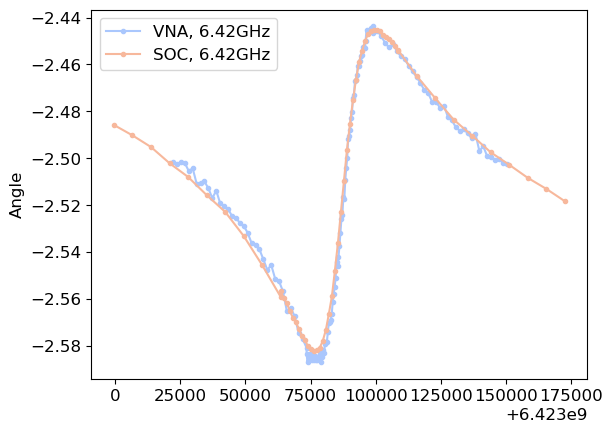

In [ ]:
plt.plot(vna_data['freqs'], vna_data['phases']-0.005, label = 'VNA, 6.42GHz', marker = '.' )
# plt.plot(soc_data['freqs']-4000, soc_data['phases']+160000-2322.3, label = 'SOC, 6.72GHz', marker = '.' )
plt.plot(soc_data['freqs']-4000, soc_data['phases']+(np.min(vna_data['phases']) - np.min(soc_data['phases'])), label = 'SOC, 6.42GHz', marker = '.' )
plt.ylabel('Angle')
plt.legend()

In [ ]:
print(vna_data.keys())

dict_keys(['freqs', 'amps', 'phases'])


### Plot with different max and min power for each resonator 

In [9]:
def plot_power(res_params, cfg, base_pth,use_pitch=True ): 
    sns.set_palette('coolwarm', len(res_params))
    plt.rcParams['lines.markersize'] = 4
    fig, ax = plt.subplots(2,1, figsize=(6,6), sharex=True) 
    fig2, ax2 = plt.subplots(2,1, figsize=(6,6), sharex=True) 
    for i in range(len(res_params)):    
        if use_pitch: 
            l = cfg['pitch'][i]
        else: 
            l = round(np.min(res_params[i]['freqs']/1e9),4)
        #inds = np.where((res_params[i]['pow'][0] >= cfg['min_power']) & (res_params[i]['pow'][0] <= cfg['max_power']))
        ax[0].semilogy(res_params[i]['pow'][0][inds], res_params[i]['qi'][0][inds], '.-', label=l) 
        ax[1].semilogy(res_params[i]['pow'][0][inds], res_params[i]['qi'][0][inds]/np.nanmax(res_params[i]['qi'][0]), '.-', label=l) 
        ax2[0].plot(res_params[i]['pow'][0][inds], 1e6*(res_params[i]['freqs'][0][inds]/np.nanmin(res_params[i]['freqs'][0][inds])-1), '.-', label=l) 
        ax2[1].plot(res_params[i]['pow'][0][inds], res_params[i]['qc'][0][inds]/np.nanmin(res_params[i]['qc'][0][inds]), '.-', label=l) 

    ax[1].set_xlabel('Power')
    ax[0].set_ylabel('$Q_i$')
    ax[1].set_ylabel('$Q_i/Q_{i,max}$')
    ax[1].legend(title='Gap', fontsize=8)

    ax2[1].set_xlabel('Power')
    ax2[0].set_ylabel('$\Delta f/f$ (ppm)')
    ax2[1].set_ylabel('$Q_c/Q_{c,min}$')
    
    fig2.tight_layout()
    fig2.savefig(base_pth +cfg['res_name']+  '_Qcfreq_pow.png', dpi=300)
    plt.show()
    fig.tight_layout()
    fig.savefig(base_pth +cfg['res_name']+  '_Qi_pow.png', dpi=300)
    plt.show()

In [10]:
def fit_qi(res_params, cfg, base_pth, min_power_vec=None, max_power_vec=None, bounds = ([0,0,0,0], [1e8, 3e7, 1e6, 5])): 

    j=0 # Temperature 
    params_list = []
    plt.rcParams['lines.markersize'] = 6
    min_power = cfg['min_power']
    max_power = cfg['max_power']

    fig, ax = plt.subplots(3,3,figsize=(10,9))
    ax = ax.flatten()
    err_list = []
    qi_0, qi_hi, nn_min, nn_max = [], [], [], []
    for i in range(len(res_params)):
        
        
        # photon numbers 
        nn = ana_tls.n(1.0, res_params[i]['freqs'][j,:], res_params[i]['q'][j,:], res_params[i]['qc'][j,:], -(res_params[i]['pow'][j,:].astype(int)))
        freq = res_params[i]['freqs'][j,0]
        nn_min.append(np.min(nn))
        nn_max.append(np.max(nn))
        # Assume we know the temp and freq 
        q_fit_tls = lambda n, Qtls0, nc, beta: ana_tls.Qtls(n, cfg['temp'], freq, Qtls0, nc, beta)
        q_fitn = lambda n, Qtls0, Qoth, nc, beta: ana_tls.Qtotn(n, cfg['temp'], freq, Qtls0, Qoth, nc, beta)
        if min_power_vec is not None:
            min_power = min_power_vec[i]
        if max_power_vec is not None:
            max_power = max_power_vec[i]
        inds = np.where((res_params[i]['pow'][j,:].astype(int) > 0) & (res_params[i]['pow'][j,:].astype(int) < 100))
        nn_fit = nn[inds] 
        qi_fit = res_params[i]['qi'][j,:][inds] 
        qi_err = res_params[i]['qi_err'][j,:][inds] 
        #print(nn_fit)
        p=[np.min(qi_fit), np.max(qi_fit), 3, 0.4]
        
        try: 
            p, err = curve_fit(q_fitn, nn_fit, qi_fit, p0=p, sigma=qi_err, bounds = bounds)
            err = np.sqrt(np.diag(err))       
            ax[i].semilogx(nn_fit, q_fitn(nn_fit, *p)/1e6, '-', linewidth=1)
            qi_0.append(q_fitn(0, *p))
            
        except: 
            err = np.nan*np.ones(4)
            qi_0.append(np.min(qi_fit))
            p = np.nan*np.ones(4)
            print('Failed!')
        qi_hi.append(np.max(qi_fit))
        ax[i].text(0.1, 0.9, str(cfg['pitch'][i])+' um', transform=ax[i].transAxes, fontsize=12, va='top', ha='left', bbox=dict(facecolor='white', edgecolor='black'))
        err_list.append(err)

        ax[i].errorbar(nn_fit, qi_fit/1e6, yerr=qi_err/1e6, fmt='.', color=colors[1], label=cfg['pitch'][i])
        ax[i].set_xscale('log')
        params_list.append(p)
    for a in ax:
        a.set_xlabel(r'$\langle n \rangle$')
        a.set_ylabel(r'$Q_i \: (10^6)$')
    
    fig.tight_layout()
    fig.savefig(base_pth +cfg['res_name']+ '_qi.png', dpi=300)
    
    cfg['qtls0'] = np.array([params_list[i][0] for i in range(len(params_list))])
    cfg['qother'] = np.array([params_list[i][1] for i in range(len(params_list))])
    cfg['nc'] = np.array([params_list[i][2] for i in range(len(params_list))])
    cfg['beta'] = np.array([params_list[i][3] for i in range(len(params_list))])
    
    cfg['qtls0_err'] = np.array([err_list[i][0] for i in range(len(err_list))])
    cfg['qother_err'] = np.array([err_list[i][1] for i in range(len(err_list))])
    cfg['nc_err'] = np.array([err_list[i][2] for i in range(len(err_list))])
    cfg['beta_err'] = np.array([err_list[i][3] for i in range(len(err_list))])
    cfg['qi0'] = np.array(qi_0)
    cfg['qi_hi'] = np.array(qi_hi)
    cfg['nn_min'] = np.array(nn_min)
    cfg['nn_max'] = np.array(nn_max)

    return cfg

Failed!
Failed!
Failed!


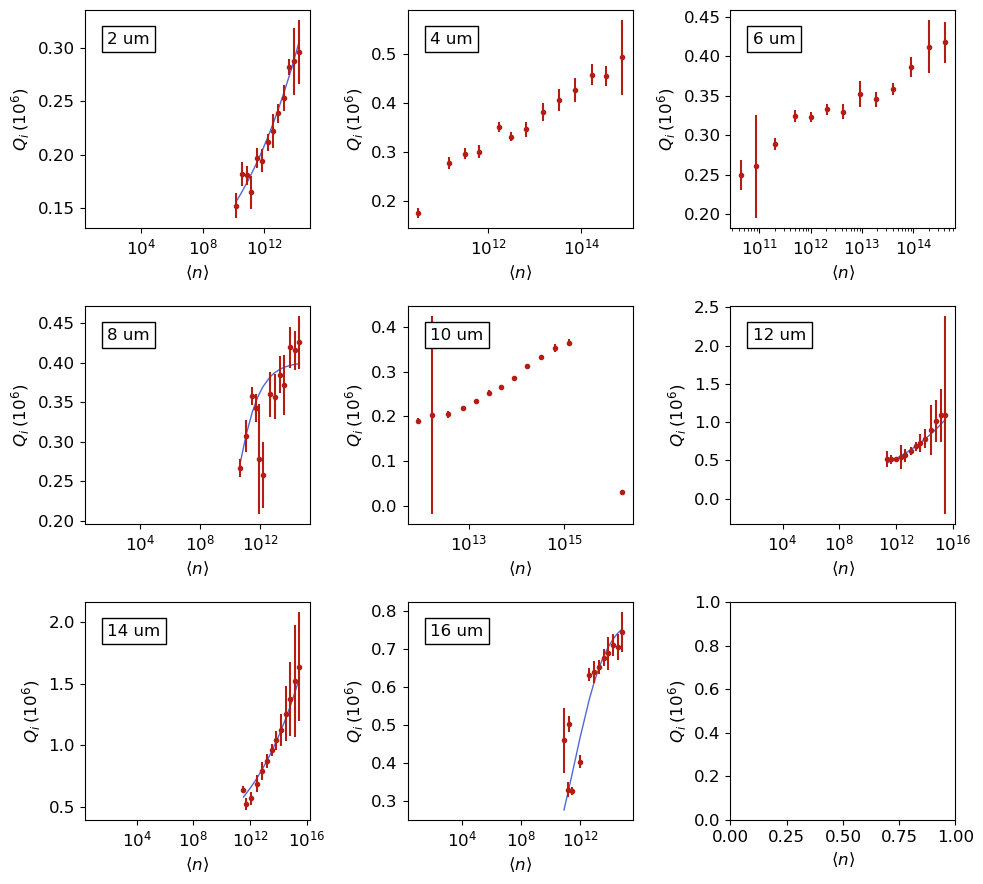

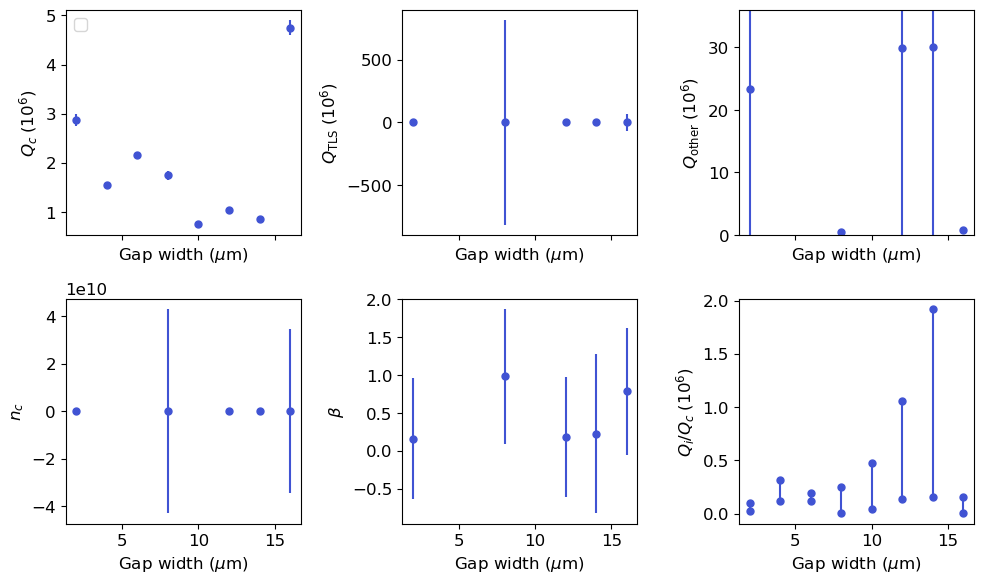

In [11]:
if sample == 'hf3':
    max_power = [-40, -50, -35, -40, -25, -25, -25, -25]

    cfg = ana_tls.fit_qi(res_params, params, img_pth, max_power_vec = max_power) 
    ana_tls.plot_res_pars([params], [''],img_pth)
    #params_nohf_low_pow = copy.deepcopy(params)
    params_hf = copy.deepcopy(params)
else:
    max_power = [-35, -35, -15, -25, -15, -15, -15, -15]
    min_power = [-115, -115, -115, -115, -100, -95, -90, -90]
    
    cfg = fit_qi(res_params, params, img_pth, max_power_vec = max_power, min_power_vec = min_power) 
    ana_tls.plot_res_pars([params], [''],img_pth)
    params_no_hf = copy.deepcopy(params)


In [12]:
print(cfg)

{'atten': -65, 'min_power': -100, 'max_power': -15, 'temp': 0.04, 'res_name': 'silicon-mux', 'sample': 'silicon-mux', 'pitch': [10, 12, 14, 2, 16, 4, 6, 8], 'target_freq': [5.9, 6.2, 6.5, 7, 6.7, 7.2, 7.5, 7.9], 'qtls0': array([619375.5181, 934342.6569, 823594.1214, 279441.1033, 279781.2991,
          965.3348, 488114.5034,  28510.4813]), 'qother': array([ 566172.986 ,  547249.5152, 1029852.6346,  211291.0522,
        551856.0057,  364958.2333,  338007.7898,  321683.1235]), 'nc': array([411393.1046, 386381.0452, 106141.3161,  55284.5539,      0.    ,
            1.2523,  78813.4268,   1485.1653]), 'beta': array([0.5809, 2.5452, 0.3882, 1.5721, 0.188 , 1.2323, 3.0177, 2.6303]), 'qtls0_err': array([2.4940e+05, 4.0139e+05, 1.1161e+06, 7.8876e+04, 1.1368e+09,
       1.1356e+08, 9.9049e+04, 6.8686e+07]), 'qother_err': array([   95509.2608,    51434.8754,   517903.1508,    19967.5205,
       16547451.5889,    19891.8259,    16801.4478,    12681.0196]), 'nc_err': array([ 527464.1417,  635027.

### Print out info for running scans

In [14]:
lw=[]
freq =[]
print('linewidth')
for i in range(len(params['freqs'])):
    q = 1/(1/params['qi0'][i]+1/params['qc'][i])
    lw.append(params['freqs'][i]/q)
    freq.append(params['freqs'][i])

print(lw)
print(freq)

linewidth
[30280.45663205266, 36573.839723565376, 23310.47610030494, 20449.658141614582, 12628.992384510642, 12592.140345702854, 15819.375033133289, 20216.294023869923]
[6336554140.323767, 6692445750.26349, 7056424707.435022, 7382929512.63772, 5516760932.618641, 5820847654.774935, 6091773974.418745, 6376981212.273887]


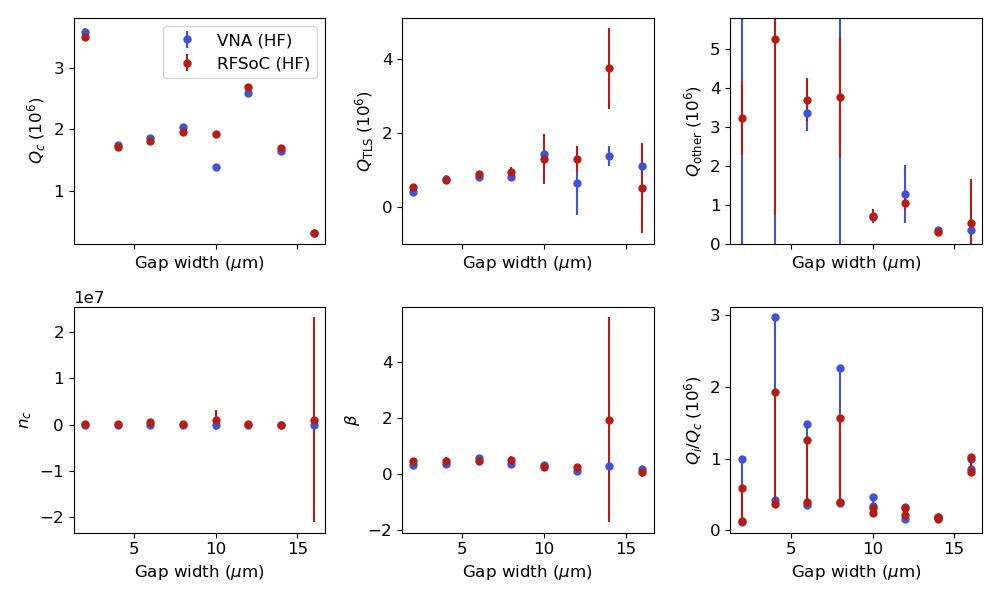

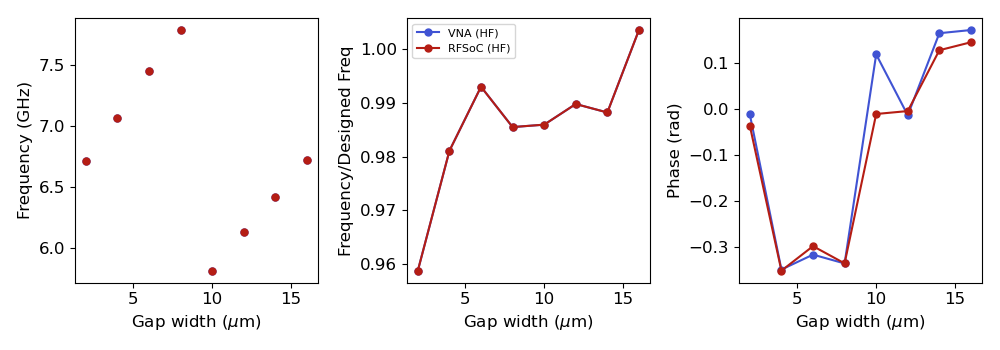

In [ ]:
%matplotlib widget
#pnames = ['240814-2','240725','240729-2', '240729-4']
#labs = ['ScalinQ (No HF)', 'SLab (No HF)', 'SLab (HF)', 'RFSoC (HF)'] 

#pnames = ['240729-2', '240729-3']
pnames = ['240729-3', '240820_soc']
labs = ['VNA (HF)', 'RFSoC (HF)'] 
plist =[]
for p in pnames:
    plist.append(hy.load(img_pth +'Text/'+ p + '.yml'))

ana_tls.plot_res_pars(plist, labs,img_pth)
ana_res.plot_res_pars(plist, labs,img_pth)


## Single resonators

In [ ]:
# Grab list of resonators following corect format in directory. 

pattern0 = r'res_(\d+)_\d{2,3}dbm'
resonators, file_list0 = ana_res.get_resonators(directories[0],pth, pattern0)

pattern = 'res_{:d}_'.format(resonators[0]) + '(\d{2,3})dbm'
file_list = ana_res.get_resonator_power_list(pattern, file_list0)

### Fit slope for RFSoC phase correction

In [ ]:
pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/Data/240816-Resonator'

plt.figure()
data, attrs = hy.prev_data(pth, 'test2')
plt.plot(data['xpts'][0], data['phases'][0])
slope, ofs = np.polyfit(data['xpts'][0], np.unwrap(data['phases'][0]), 1)
data['phases'] = np.unwrap(data['phases'][0]) - slope * data['xpts'][0]-ofs

print(slope)

data['phases']

In [ ]:
# Grab list of resonators following corect format in directory. 

pth = r'/Users/sph/Library/CloudStorage/GoogleDrive-circuitqed@gmail.com/My Drive/Projects/Materials/Data/240818-Resonator/'

#directories = ['240816-Resonator/powersweep3']
directories = ['powersweep2']
pattern0 = r'res_(\d+)_\d'
resonators, file_list = ana_res.get_resonators(directories[0],pth, pattern0)

In [ ]:
file_list

In [ ]:
fname =  'res_6423_4096_wideright'
data, attrs = hy.prev_data(pth+directories[0], fname)

data.keys()

In [ ]:
data = ana_res.grab_data(pth+directories[0], file_list[4], 'soc', slope=slope)
#ana_res.plot_raw_data(data)
output = ana_res.fit_resonator(data, fname, img_pth, plot=True)   

In [ ]:
sorted_file_list = sorted(file_list)
print(sorted_file_list)

In [ ]:
file_list[12]

In [ ]:
%matplotlib widget

for i in range(len(file_list)):
    #try:
    data = ana_res.grab_data(pth+directories[0], file_list[i])       
    ana_res.plot_raw_data(data)
    #output = ana_res.fit_resonator(data, file_list[i], output_path, 'png')    
    #except: 
    #    print('fit failed')  
7.714986

In [ ]:

pth = '../../../../JJ_fab/Coherence Sample/Resonators Measurement/240725/data/power_sweep5'
fname = 'res_7083855_60dbm_wide'
data = ana_res.grab_data(pth, fname)
output = ana_res.fit_resonator(data, fname, img_pth, plot=True)   
ana_res.plot_raw_data(data)

### Temp sweep

In [ ]:
# Initialize the directories list for a temperature sweep 
temps, directories = ana_res.get_temp_list(pth_base, max_temp=1500)
res_params = ana_res.analyze_sweep(directories)

ana_res.plot_power_temp(res_params,i,params,img_pth)